In [1]:
import pandas as pd

In [2]:
import os
import string
import numpy as np
import pandas as pd
from typing import List
from collections import Counter

import seaborn as sns
sns.set_style('dark')

import matplotlib.pyplot as plt
import squarify

from nltk import word_tokenize
from nltk.util import ngrams
from nltk.corpus import stopwords
from nltk.collocations import BigramCollocationFinder
from nltk.stem import WordNetLemmatizer, PorterStemmer

from IPython.display import display, HTML

import warnings
warnings.filterwarnings('ignore')

In [3]:
import nltk

In [4]:
df=pd.read_csv('A:\Customer Reviews Intent Analysis\Data\cleaned_data2.csv')
df.head()

,Restaurant_Name,Author,Review URL,Comment,Rating,Comment_Clean,positive,negative,neutral
0,24/7 Food Ex,Shikha Sharma,https://www.zoma.to/QqPBkQY,it is taste less hakka noodles it was so oily,2.0,"['taste', 'less', 'hakka', 'noodle', 'oily']",0.000,0.000,1.000
1,24/7 Food Ex,Sanju Nishad,https://www.zoma.to/OYQvMym,it was paneer cheese pizza but there was not e...,1.0,"['paneer', 'cheese', 'pizza', 'even', 'cheese'...",0.000,0.280,0.720
2,24/7 Food Ex,Aayush Pandey,https://www.zoma.to/dErRgGP,no cutlery was served with the respected order,2.0,"['cutlery', 'served', 'respected', 'order']",0.274,0.195,0.531
3,24/7 Food Ex,Shivanshi Yadav,https://www.zoma.to/bqlLpAO,no salt,2.0,['salt'],0.000,0.688,0.312
4,24/7 Food Ex,Ap,https://www.zoma.to/wBOamdK,most favourite food everyi gave 100 out of 10,5.0,"['favourite', 'food', 'everyi', 'gave', '100',...",0.000,0.000,1.000


In [5]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

In [6]:
## getting the negative reviews for identifying the key themes of problems
problems=df.loc[df.negative>0]['Comment']
problems.head()

1     it was paneer cheese pizza but there was not e...
2        no cutlery was served with the respected order
3                                               no salt
7                          very bad taste khrab h khana
10    all tastes very bitter and sour like it was se...
Name: Comment, dtype: object

In [7]:
problems

1       it was paneer cheese pizza but there was not e...
2          no cutlery was served with the respected order
3                                                 no salt
7                            very bad taste khrab h khana
10      all tastes very bitter and sour like it was se...
                              ...                        
7277    taste was good but the package could not hold ...
7279    roof is leaking food is average they dont acce...
7282    the food is quite good but the staff and servi...
7283    spicy baby potato was sweet and not spicy at a...
7284    the service is very pathetic they take more th...
Name: Comment, Length: 2916, dtype: object

In [8]:
vectorizer=TfidfVectorizer(stop_words='english')
X=vectorizer.fit_transform(problems)

In [9]:
X

<2916x9382 sparse matrix of type '<class 'numpy.float64'>'
	with 46751 stored elements in Compressed Sparse Row format>

In [10]:
from sklearn.cluster import KMeans

# Define the number of clusters
k = 3

# Initialize the KMeans model with updated parameters
model = KMeans(
    n_clusters=k,
    init='k-means++',
    n_init=10,
    max_iter=300,
    tol=0.0001,
    verbose=0,
    random_state=None,
    copy_x=True,
    algorithm='lloyd'
)

# Fit the model to the data
model.fit(X)


KMeans(n_clusters=3, n_init=10)

In [11]:
# Get the centroids of each cluster, sorted by feature importance
centroids = model.cluster_centers_.argsort()[:, ::-1]

# Get the feature names from the vectorizer
features = vectorizer.get_feature_names_out()

# Print the top 10 features for each cluster
for i in range(3):  # Replace '3' with 'k' if you want to use the dynamic number of clusters
    print(f"\nCluster {i}:")
    for ind in centroids[i, :10]:  # Top 10 features
        print(f"\t- {features[ind]}")



Cluster 0:
	- good
	- taste
	- quality
	- food
	- worst
	- poor
	- quantity
	- pizza
	- packaging
	- salt

Cluster 1:
	- bad
	- taste
	- quality
	- food
	- experience
	- packaging
	- smell
	- service
	- test
	- cooked

Cluster 2:
	- food
	- worst
	- good
	- taste
	- order
	- chicken
	- quality
	- like
	- place
	- poor


In [12]:
df = df.dropna(subset=['Comment'])

In [13]:
### predicting the text sentence and tell into which cluster the sentence belongs to.
X=vectorizer.transform(df.Comment)
df['cluster']=model.predict(X)
df.head()

,Restaurant_Name,Author,Review URL,Comment,Rating,Comment_Clean,positive,negative,neutral,cluster
0,24/7 Food Ex,Shikha Sharma,https://www.zoma.to/QqPBkQY,it is taste less hakka noodles it was so oily,2.0,"['taste', 'less', 'hakka', 'noodle', 'oily']",0.000,0.000,1.000,2
1,24/7 Food Ex,Sanju Nishad,https://www.zoma.to/OYQvMym,it was paneer cheese pizza but there was not e...,1.0,"['paneer', 'cheese', 'pizza', 'even', 'cheese'...",0.000,0.280,0.720,2
2,24/7 Food Ex,Aayush Pandey,https://www.zoma.to/dErRgGP,no cutlery was served with the respected order,2.0,"['cutlery', 'served', 'respected', 'order']",0.274,0.195,0.531,2
3,24/7 Food Ex,Shivanshi Yadav,https://www.zoma.to/bqlLpAO,no salt,2.0,['salt'],0.000,0.688,0.312,2
4,24/7 Food Ex,Ap,https://www.zoma.to/wBOamdK,most favourite food everyi gave 100 out of 10,5.0,"['favourite', 'food', 'everyi', 'gave', '100',...",0.000,0.000,1.000,2


In [14]:
import ast
df['Comment_Clean_2'] = df['Comment_Clean'].apply(lambda row: ' '.join(ast.literal_eval(row)) if isinstance(row, str) else ' '.join(row))


In [15]:
df.head()

,Restaurant_Name,Author,Review URL,Comment,Rating,Comment_Clean,positive,negative,neutral,cluster,Comment_Clean_2
0,24/7 Food Ex,Shikha Sharma,https://www.zoma.to/QqPBkQY,it is taste less hakka noodles it was so oily,2.0,"['taste', 'less', 'hakka', 'noodle', 'oily']",0.000,0.000,1.000,2,taste less hakka noodle oily
1,24/7 Food Ex,Sanju Nishad,https://www.zoma.to/OYQvMym,it was paneer cheese pizza but there was not e...,1.0,"['paneer', 'cheese', 'pizza', 'even', 'cheese'...",0.000,0.280,0.720,2,paneer cheese pizza even cheese brthe paneer s...
2,24/7 Food Ex,Aayush Pandey,https://www.zoma.to/dErRgGP,no cutlery was served with the respected order,2.0,"['cutlery', 'served', 'respected', 'order']",0.274,0.195,0.531,2,cutlery served respected order
3,24/7 Food Ex,Shivanshi Yadav,https://www.zoma.to/bqlLpAO,no salt,2.0,['salt'],0.000,0.688,0.312,2,salt
4,24/7 Food Ex,Ap,https://www.zoma.to/wBOamdK,most favourite food everyi gave 100 out of 10,5.0,"['favourite', 'food', 'everyi', 'gave', '100',...",0.000,0.000,1.000,2,favourite food everyi gave 100 10


In [16]:
from collections import Counter

In [17]:
def most_common_words(input_df: pd.DataFrame,
                      text_col: str,
                      n_most_common=20):
    """ Given a collection of documents as text, compute the number of most common
    words as defined by n_most_common.

    Parameters
    ----------
        input_df: Dataframe that contains the relevant text column
        text_col: Name of the column
        n_most_common: Number of most common words to calculate
    Returns:
    --------
        Pandas dataframe with two columns (['word', 'count']) indicating a word and number
        of times (count) that it appears in the original input_df
    """
    word_list = list([x.split() for x in input_df[text_col] if x is not None])
    word_counter = Counter(x for xs in word_list for x in set(xs))
    word_counter.most_common(n_most_common)

    return pd.DataFrame(word_counter.most_common(n_most_common), columns=['word', 'count'])

In [18]:
def plot_most_common_words(input_df: pd.DataFrame,
                           text_col: str,
                           n_most_common=20,
                           return_counts=False,
                           figsize=(10, 10)) -> None:
    
    if return_counts:
        df = most_common_words(input_df=input_df, text_col=text_col, n_most_common=n_most_common)
        display(HTML(df.to_html()))

    fig, ax = plt.subplots(figsize=figsize)
    common_words_df = most_common_words(input_df=input_df,
                                        text_col=text_col,
                                        n_most_common=n_most_common)
    sns.barplot(x='count', y='word', data=common_words_df).set_title(f'Common Words Found - Overall', fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='-', color='black')
    plt.show()

In [19]:
!pip install seaborn


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [20]:
import seaborn as sns
import matplotlib.pyplot as plt 

Text(0.5, 1.0, 'Number of reviews per Rating')

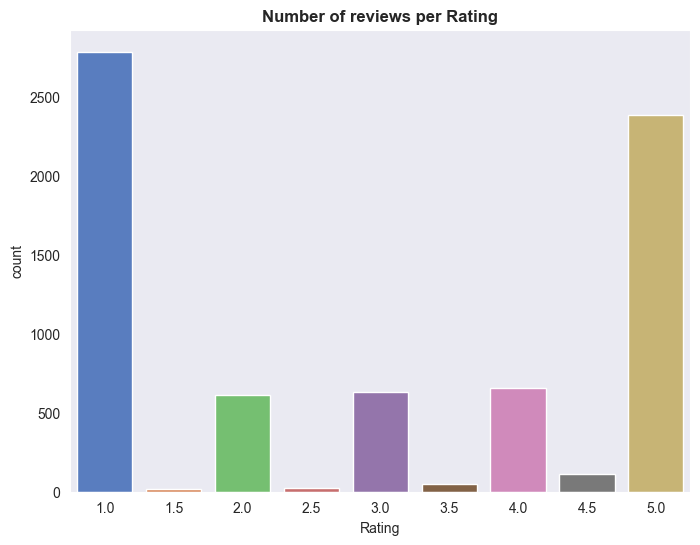

In [21]:
plt.figure(figsize=(8, 6))
sns.countplot(x=df['Rating'], palette='muted').set_title('Number of reviews per Rating', fontweight='bold')

,word,count
0,food,2130
1,good,1606
2,taste,1153
3,place,905
4,service,904
5,quality,538
6,ambience,520
7,bad,509
8,restaurant,504
9,great,502


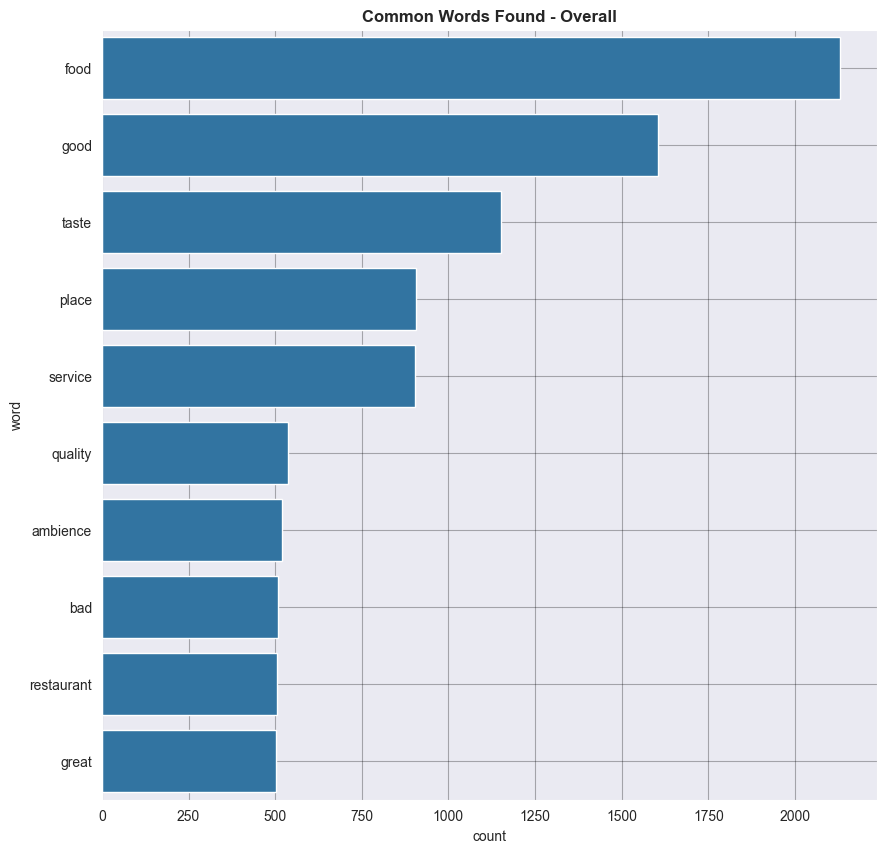

In [22]:
plot_most_common_words(df, n_most_common=10, text_col='Comment_Clean_2', return_counts=True)

In [23]:
from IPython.display import display, HTML

In [24]:
def plot_wordcloud(input_df: pd.DataFrame,
                   text_col: str,
                   figsize=(10, 10)) -> None:
    """ Generate a WordCloud plot based on the number of occurenences of words
    in a set documents
    """
    plt.figure(figsize=figsize)
    combined_text = ' '.join([x for x in input_df[text_col] if x is not None])
    wordcloud = WordCloud().generate(combined_text)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [25]:
def compute_bigrams(input_df: pd.DataFrame,
                    text_col: str) -> dict:
    """ Calculate the number of occurences where a pair of words appear next to
    each other, and return a dictionary of {pair of words: count}.
    """
    combined_text = ' '.join([x for x in input_df[text_col]])
    
    finder = BigramCollocationFinder.from_words(word_tokenize(combined_text))

    bigrams_dict = {}
    for k, v in finder.ngram_fd.items():
        if len(k[0]) > 1 and len(k[1]) > 1:
            bigrams_dict[k] = v
        else:
            continue
    return bigrams_dict

In [26]:
def plot_bigrams(input_df: pd.DataFrame,
                 text_col: str,
                 top_n: int,
                 rotation=0.8,
                 figsize=(10, 8)) -> None:

    bigrams_dict = compute_bigrams(input_df=input_df, text_col=text_col)
    bigrams_sorted = sorted(bigrams_dict.items(), key=lambda x: x[1], reverse=True)[0:top_n]
    bgram, counts = list(zip(*bigrams_sorted))
    bgstring = list(map(lambda txt: '_'.join(txt), bgram))

    plt.figure(figsize=figsize)
    g = sns.barplot(bgstring, counts, palette='muted')
    g.set_xticklabels(g.get_xticklabels(), rotation=rotation)
    plt.title(f'Top-{top_n} pairs of words that appear next to each other',
              fontweight='bold')
    plt.ylabel('Count')
    plt.grid(True, alpha=0.1, color='black')
    plt.show()

In [27]:
bigrams = compute_bigrams(df, text_col='Comment_Clean_2')

In [28]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Mukul\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [29]:
pd.DataFrame(sorted(bigrams.items(), key=lambda item: item[1], reverse=True), columns=['Bigram', 'Count']).head(15)


,Bigram,Count
0,"(food, good)",180
1,"(good, food)",170
2,"(main, course)",139
3,"(taste, good)",132
4,"(good, service)",113
5,"(food, quality)",111
6,"(quality, food)",104
7,"(good, taste)",97
8,"(one, best)",90
9,"(best, place)",88


In [30]:
def plot_bigrams(input_df: pd.DataFrame,
                 text_col: str,
                 top_n: int,
                 rotation=0.8,
                 figsize=(10, 8)) -> None:

    bigrams_dict = compute_bigrams(input_df=input_df, text_col=text_col)
    bigrams_sorted = sorted(bigrams_dict.items(), key=lambda x: x[1], reverse=True)[0:top_n]
    bgram, counts = list(zip(*bigrams_sorted))
    bgstring = list(map(lambda txt: '_'.join(txt), bgram))

    plt.figure(figsize=figsize)
    g = sns.barplot(x=bgstring, y=counts, palette='muted')  # Corrected line
    g.set_xticklabels(g.get_xticklabels(), rotation=rotation)
    plt.title(f'Top-{top_n} pairs of words that appear next to each other',
              fontweight='bold')
    plt.ylabel('Count')
    plt.grid(True, alpha=0.1, color='black')
    plt.show()


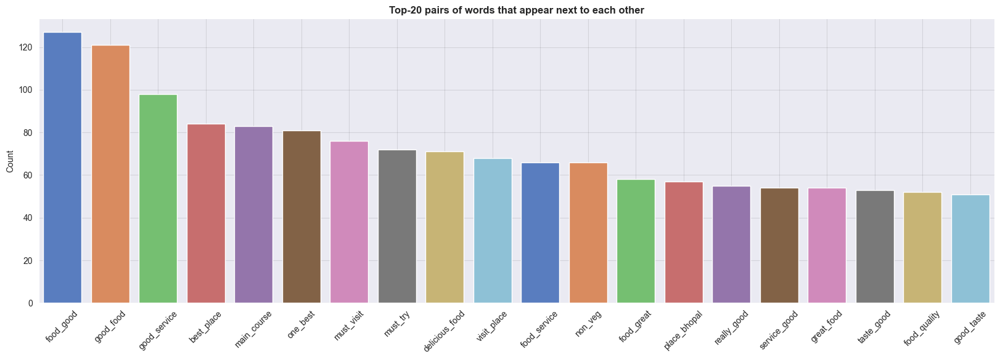

In [31]:
input_df = df[df['Rating'] >= 4]
plot_bigrams(input_df, text_col='Comment_Clean_2', top_n=20, rotation=45, figsize=(20, 6))

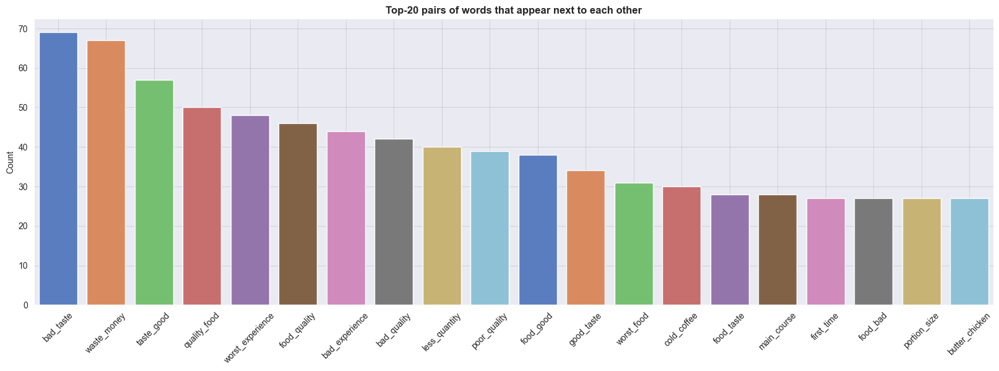

In [32]:
input_df = df[df['Rating'] <= 2]
plot_bigrams(input_df, text_col='Comment_Clean_2', top_n=20, rotation=45, figsize=(20, 6))

In [33]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from scipy.sparse.csr import csr_matrix

In [34]:
class LDAModeller:
    """ Common class used to perform an end-to-end Latent Dirichlet Allocation
    analysis. The base object of the class is a Pandas Dataframe.
    
    Parameters
    -----------
    input_df: Base dataframe
    reviews_col: String representing the name of the column that contains the reviews
    """

    def __init__(self, input_df: pd.DataFrame, reviews_col: str):
        self.input_df = input_df
        self.reviews_col = reviews_col
 

    def setCountVectorizer(self, max_df: float, min_df: float, max_features: int, ngram_range: tuple):
        """ A project-specific wrapper based on
        https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
        """
        self.vectorizer = CountVectorizer(max_df=max_df, min_df=min_df,
                                          max_features=max_features, ngram_range=ngram_range)

        
    def computeCountVectorizerMatrix(self):
        try:
            self.cv_matrix = self.vectorizer.fit_transform(self.input_df[self.reviews_col])
            self.cv_matrix_shape = self.cv_matrix.shape
            self.cv_feature_names = self.vectorizer.get_feature_names_out()         
        except AttributeError:
            raise Exception('CountVectorizer was is not set up..\n')



            
    def identifyNGramsFromCountVectMatrix(self) -> List[List['str']]:
        """ Given a sparse matrix, get the column names where respective 
        columns of that document have non-zero values - indicating that the
        relative column is a word present in the document.
        
        Requires @computeCountVectorizerMatrix() to be fitted beforehand.
        """
        vector_matrix_df = pd.DataFrame(self.cv_matrix.toarray(), columns=self.cv_feature_names)
        
        combined_ngrams_ls = []
        for i in vector_matrix_df.index:
            ngrams_ls = []
            for j in list(np.where(vector_matrix_df.iloc[i] != 0)[0]):
                ngrams_ls.append(vector_matrix_df.columns[j])
            combined_ngrams_ls.append(ngrams_ls)
        return combined_ngrams_ls

    
    def countVectorizerToDict(self) -> dict:
        """ Produces a dictionary of the format dict([column_name, count]),
        where column_name is an n-gram case in the sparse matrix, while count
        describes the number of occurences for that specific n-gram as calculated
        by @computeCountVectorizerMatrix() .
        """
        counts = np.asarray(self.cv_matrix .sum(axis=0))[0]
        return dict(zip(self.cv_feature_names, counts))

    
    def assignNGramsAsColumn(self, ngram_colname: 'str'):
        self.input_df[ngram_colname] = self.identifyNGramsFromCountVectMatrix()
 

    def retrieveTopNgrams(self, top_n: int, n_gram_type='Bigram'):
        self.n_gram_counts = self.countVectorizerToDict()
        if top_n is not None:
            return pd.DataFrame(sorted(self.n_gram_counts.items(),
                                       key=lambda item: item[1],
                                       reverse=True),
            columns=[n_gram_type, 'Count']).head(top_n)        

        
    def setAndFitLDAModel(self, lda_model: LatentDirichletAllocation, topic_num: int, fit_model=True):
        self.lda_model = lda_model
        self.number_of_topics = topic_num
        if fit_model:
            self.fitted_lda_model = self.lda_model.fit(self.cv_matrix)


    def getPerTopicWordWeights(self, sort=True):
        self.word_weights_per_topic = []
        for i, topic in enumerate(self.fitted_lda_model.components_):
            weights = list(zip(self.cv_feature_names, topic))
            if sort:
                weights = sorted(weights, key=lambda x: x[1], reverse=True)
            self.word_weights_per_topic.append([i, weights])

            
    def showTopWordsPerTopic(self, num_top_words: int):
        for i in range(0, len(self.fitted_lda_model.components_)):
            self.getPerTopicWordWeights()
            weights = self.word_weights_per_topic[i][1]
            print('Topic {0} : {1} \n'.format(i+1, weights[0:num_top_words]))

In [35]:
def assign_topic(topic_probs: List[float], threshold=0.65) -> int:
    """ Assign a topic to a review based on the topic with the highest probability.
    If no topic probability exceeds threshold, no assignment is being completed.
    """
    max_likelihood = np.max(topic_probs)
    if threshold < max_likelihood:
        max_topic_idx = np.argmax(topic_probs)
        if max_topic_idx==0:
            max_topic_idx = 1
        else:
            max_topic_idx += 1
        return max_topic_idx
    else:
        return 0

In [36]:
num_topics_neg = 4

In [37]:
lda_neg= LatentDirichletAllocation(n_components=num_topics_neg,
                                   learning_method='online',
                                   learning_offset=20,
                                   doc_topic_prior= 3 * (1/num_topics_neg),
                                   max_iter=30,
                                   random_state=10,
                                   n_jobs=-1,
                                   verbose=0)

In [38]:
negative_reviews_df = df[df['Rating'] < 4]
negative_reviews_df.reset_index(inplace=True)
negative_reviews_df.shape

positive_reviews_df = df[df['Rating'] >= 4]
positive_reviews_df.reset_index(inplace=True)
positive_reviews_df.shape

(3155, 12)

In [39]:
neg_lda = LDAModeller(input_df=negative_reviews_df, reviews_col='Comment_Clean_2')

In [40]:
neg_lda.setCountVectorizer(max_df=0.95, min_df=3, max_features=12000, ngram_range=(2,2))
neg_lda.computeCountVectorizerMatrix()
neg_lda.assignNGramsAsColumn(ngram_colname='ngrams')
neg_lda.input_df.iloc[0]['Comment_Clean_2']
neg_lda.input_df.iloc[0]['ngrams']

['hakka noodle', 'taste less']

In [41]:
neg_lda.retrieveTopNgrams(top_n=10)

,Bigram,Count
0,taste good,77
1,bad taste,70
2,waste money,70
3,food quality,58
4,quality food,57
5,main course,56
6,food good,54
7,worst experience,48
8,bad experience,47
9,less quantity,43


In [42]:
neg_lda.setAndFitLDAModel(lda_model=lda_neg, topic_num=num_topics_neg, fit_model=True)

In [43]:
neg_lda.getPerTopicWordWeights(sort=True)
neg_lda.word_weights_per_topic[0][1][0:5]

[('waste money', 71.77407566924995),
 ('bad taste', 71.59868374400503),
 ('worst experience', 50.03701977701735),
 ('less quantity', 41.32781029005332),
 ('quantity less', 38.99152173428996)]

In [44]:
neg_lda.showTopWordsPerTopic(num_top_words=15)

Topic 1 : [('waste money', 71.77407566924995), ('bad taste', 71.59868374400503), ('worst experience', 50.03701977701735), ('less quantity', 41.32781029005332), ('quantity less', 38.99152173428996), ('cold coffee', 32.39542496794463), ('garlic bread', 25.08760458247364), ('worst taste', 24.809191678805785), ('taste bad', 23.713183423392277), ('poor service', 20.88729948988686), ('paneer tikka', 20.57226979129014), ('wrong order', 20.41957781380309), ('worth price', 19.473799178558348), ('dont order', 19.424592568842417), ('wrong item', 19.028222429489126)] 

Topic 2 : [('bad experience', 45.46371152004255), ('bad quality', 41.34621230297634), ('worst food', 29.471973036023797), ('bad food', 24.95140317806283), ('food bad', 24.81762227722853), ('stale food', 24.630763143233324), ('taste like', 24.500332169791836), ('ordered chicken', 21.934551192115865), ('didnt like', 18.094740043037802), ('recommend anyone', 17.263154569518743), ('poor taste', 16.912126377972537), ('chilli chicken', 15

In [45]:
num_topics_pos = 2

lda_pos = LatentDirichletAllocation(n_components=num_topics_pos,
                                    learning_method='online',
                                    learning_offset=20,
                                    # doc_topic_prior= 4 * (1/num_topics_pos),
                                    doc_topic_prior=1,
                                    max_iter=30,
                                    random_state=10,
                                    n_jobs=-1,
                                    verbose=0)
pos_lda = LDAModeller(input_df=positive_reviews_df, reviews_col='Comment_Clean_2')
pos_lda.setCountVectorizer(max_df=18, min_df=1, max_features=3000, ngram_range=(2,2))
pos_lda.computeCountVectorizerMatrix()
pos_lda.assignNGramsAsColumn(ngram_colname='ngrams')
pos_lda.cv_matrix_shape
(915, 3000)
pos_lda.retrieveTopNgrams(top_n=10)

,Bigram,Count
0,authentic italian,19
1,breakfast buffet,19
2,fine dining,19
3,service staff,19
4,every bite,18
5,place good,18
6,place must,18
7,food bhopal,17
8,place visit,17
9,pool side,17


In [46]:
pos_lda.setAndFitLDAModel(lda_model=lda_pos, topic_num=num_topics_pos, fit_model=True)
pos_lda.getPerTopicWordWeights(sort=True)
pos_lda.showTopWordsPerTopic(num_top_words=15)

Topic 1 : [('would definitely', 17.19263992115103), ('fine dining', 17.054167632132646), ('quality good', 16.867168692042632), ('pool side', 16.467154420773234), ('good quantity', 15.874677263841813), ('sunday brunch', 15.514362134405298), ('really nice', 15.504213763718433), ('would like', 15.47160827523986), ('staff courteous', 15.329821504281743), ('momo cafe', 15.262590998526482), ('friendly staff', 14.905089398083142), ('staff really', 14.650597165766273), ('great time', 14.526299906923446), ('well cooked', 14.28557513069622), ('food awesome', 14.266266048050051)] 

Topic 2 : [('authentic italian', 18.815312595351944), ('breakfast buffet', 18.710277850444594), ('place good', 17.8294335964811), ('service excellent', 17.49252493088641), ('visit bhopal', 17.34398661850109), ('top notch', 17.264954981551607), ('place visit', 17.002884134852252), ('food bhopal', 16.687122682049292), ('amazing service', 16.01722358693177), ('courteous staff', 15.844207718228411), ('cake delightful', 15.

In [47]:
pos_lda.getPerTopicWordWeights(sort=True)
pos_lda.word_weights_per_topic[0][1][0:5]

[('would definitely', 17.19263992115103),
 ('fine dining', 17.054167632132646),
 ('quality good', 16.867168692042632),
 ('pool side', 16.467154420773234),
 ('good quantity', 15.874677263841813)]

In [48]:
topic_to_review_dist_neg = neg_lda.lda_model.transform(neg_lda.cv_matrix)


In [49]:
topic_to_review_dist_neg

array([[0.15009504, 0.5497344 , 0.15008325, 0.15008731],
       [0.46883882, 0.34312372, 0.09393962, 0.09409784],
       [0.25      , 0.25      , 0.25      , 0.25      ],
       ...,
       [0.09383231, 0.71850875, 0.09383029, 0.09382866],
       [0.35030913, 0.34939825, 0.15015071, 0.15014191],
       [0.07505723, 0.07505953, 0.77483016, 0.07505308]])

In [50]:
topic_to_review_dist_pos = pos_lda.lda_model.transform(pos_lda.cv_matrix)

In [51]:
topic_to_review_dist_pos

array([[0.34366267, 0.65633733],
       [0.37025178, 0.62974822],
       [0.5       , 0.5       ],
       ...,
       [0.5       , 0.5       ],
       [0.6608027 , 0.3391973 ],
       [0.2088217 , 0.7911783 ]])

In [52]:
topics_map_negative = {0: 'Indecisive',
                       1: 'Complaints',
                       2: 'Quality Issues',
                       3: 'Taste Issues',
                       4: 'Service Issues'}

In [53]:
topics_map_positive = {0: 'Indecisive',
                       1: 'Quantity',
                       2: 'Quality'}

In [54]:
negative_reviews_df['Topic_Likelihood'] = topic_to_review_dist_neg.tolist()
positive_reviews_df['Topic_Likelihood'] = topic_to_review_dist_pos.tolist()

In [55]:
cutoff_threshold_neg = 1/num_topics_neg
cutoff_threshold_pos = 0

In [56]:
negative_reviews_df['Topic_Num'] = negative_reviews_df['Topic_Likelihood'].apply(lambda row: assign_topic(row, threshold=cutoff_threshold_neg))
positive_reviews_df['Topic_Num'] = positive_reviews_df['Topic_Likelihood'].apply(lambda row: assign_topic(row, threshold=cutoff_threshold_pos))
negative_reviews_df['Topic'] = negative_reviews_df['Topic_Num'].apply(lambda row: topics_map_negative[row])
positive_reviews_df['Topic'] = positive_reviews_df['Topic_Num'].apply(lambda row: topics_map_positive[row])

In [57]:
with pd.option_context('display.max_colwidth', 100):
    print(negative_reviews_df[['Comment', 'Topic', 'Topic_Num']].head(5))

                                                                                               Comment  \
0                                                        it is taste less hakka noodles it was so oily   
1  it was paneer cheese pizza but there was not even a cheese in it and brthe paneer was in very ve...   
2                                                       no cutlery was served with the respected order   
3                                                                                              no salt   
4                                                                                         bekhar khana   

            Topic  Topic_Num  
0  Quality Issues          2  
1      Complaints          1  
2      Indecisive          0  
3      Indecisive          0  
4      Indecisive          0  


In [58]:
def get_review_summary(input_df: pd.DataFrame,
                       rev_idx: int,
                       topics_map: dict):
    
    print('\x1b[1;30m' + 'Review: ' + '\x1b[0m' + input_df['Comment'].iloc[rev_idx] + '\n')
    print('\x1b[1;30m' + 'Predicted Topic: ' + '\x1b[0m' + input_df['Topic'].iloc[rev_idx] + '\n')
    print(input_df['Topic_Likelihood'].iloc[rev_idx])
    
    topic_to_likelihood = list(zip(list(topics_map.keys()),
                                   list(topics_map.values()),
                                   [0.0] + input_df['Topic_Likelihood'].iloc[rev_idx]))
    l_df = pd.DataFrame(topic_to_likelihood, columns = ['Topic_Num', 'Topic', 'Likelihood'])
    
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Topic', y='Likelihood', data=l_df)
    plt.ylim(0, 1.0)
    plt.grid(True, alpha=0.2, linestyle='-', color='black')
    plt.show()

Review: entire food was floating and filled with oil third grade food quality for such high price food so bad even our pet dog didn’t eat it

Predicted Topic: Taste Issues

[0.09400534591515879, 0.2192697678059896, 0.4685207992215825, 0.21820408705726912]


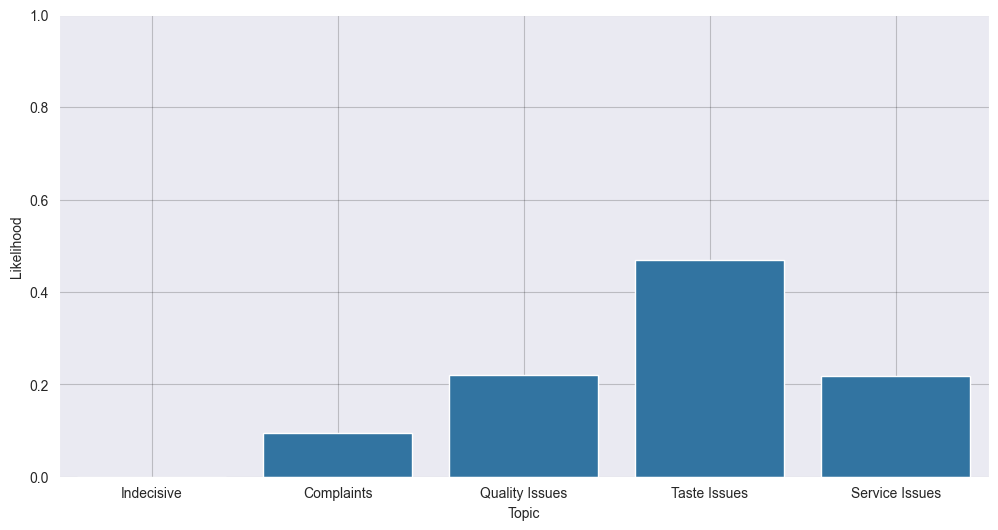

In [59]:
get_review_summary(input_df=negative_reviews_df, rev_idx=1200, topics_map=topics_map_negative)

Review: good servicee

Predicted Topic: Quantity

[0.5, 0.5]


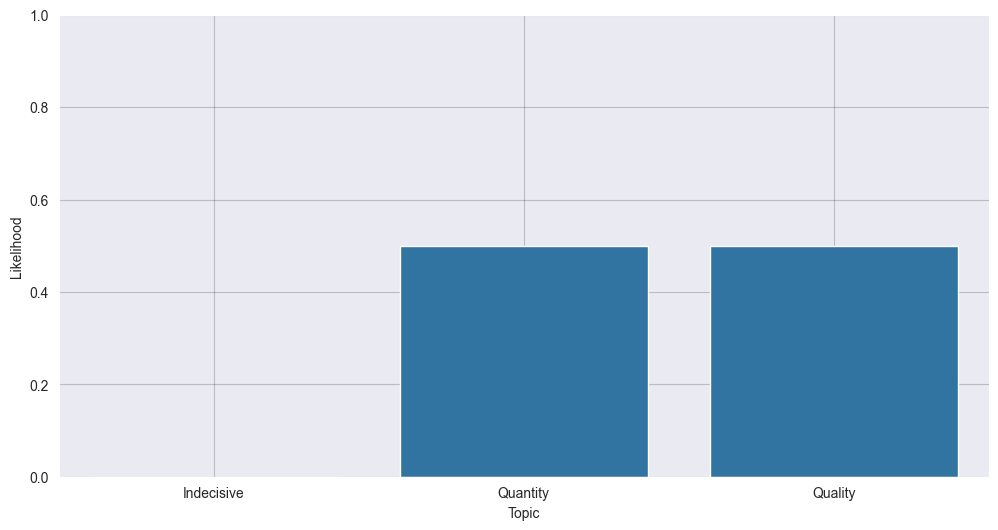

In [60]:
get_review_summary(input_df=positive_reviews_df, rev_idx=145, topics_map=topics_map_positive)


Review: place is nice and the food was decent as well what i didnt like the managers attitude i had a zomato pro plus subscription with me and was going to pay bill through zomato only they told us not to pay through zomato and insted asked to pay in cash later when we were leaving he sneakily took back the receipt also and we were not able to file a complaint in the app this was so wrong of them

Predicted Topic: Complaints

[0.46826490343357263, 0.22002877629648288, 0.09415782844866695, 0.21754849182127745]


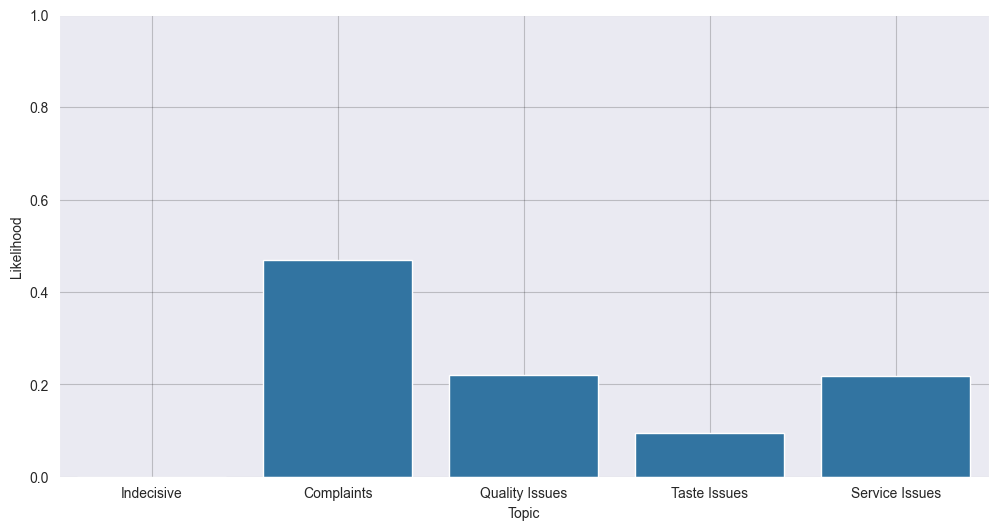

In [61]:
get_review_summary(input_df=negative_reviews_df, rev_idx=800, topics_map=topics_map_negative)


In [62]:
def summary_per_company(input_df: pd.DataFrame,
                        company: 'all',
                        figsize=(6, 6)) -> None:
    
    if company != 'all':
        filtered_df = input_df[input_df['Restaurant_Name'] == company]
    else:
        filtered_df = input_df

    vals = filtered_df['Topic'].value_counts()
    groups = filtered_df['Topic'].value_counts().index.tolist()
    
    filtered_df = pd.DataFrame({'Num_Reviews': vals, 'group': groups})
    
    colors_ls = ["tab:olive", "tab:orange", "tab:purple", "tab:red", "tab:cyan"]
    
    plt.figure(figsize=(figsize))

    # TreePlot
    plt.subplot(1, 2, 1)

    squarify.plot(sizes=filtered_df['Num_Reviews'],
                  label=filtered_df['group'],
                  color=colors_ls,
                  alpha=.4 )
    plt.axis('on')
    #plt.title('Treeplot for {}'.format(company), pad=30)
    
    # DonutPlot
    plt.subplot(1, 2, 2)
    
    cen_circle = plt.Circle((0, 0), 0.6, color='white')
    
    plt.pie(filtered_df['Num_Reviews'],
            labels= filtered_df['group'],
            autopct='%1.1f%%',
            pctdistance = 1.23,
            startangle=85,
            labeldistance=1.05,
            colors=colors_ls)
    plt.axis('equal')
    #plt.title('Donutplot for {}'.format(company), pad=30)
    plt.gca().add_artist(cen_circle)
    
    plt.tight_layout()
    plt.show()

24/7 Food Ex - Number of reviews: 89


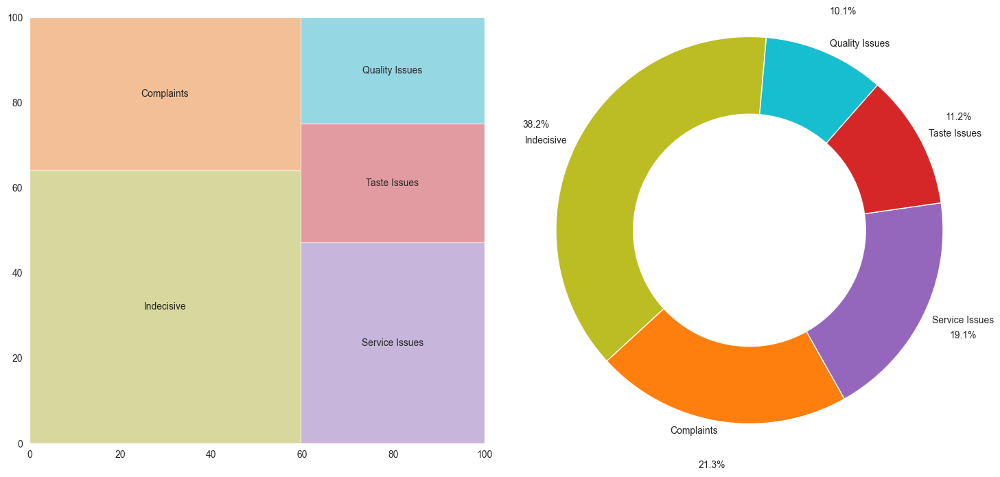

32 Degree North East - Number of reviews: 22


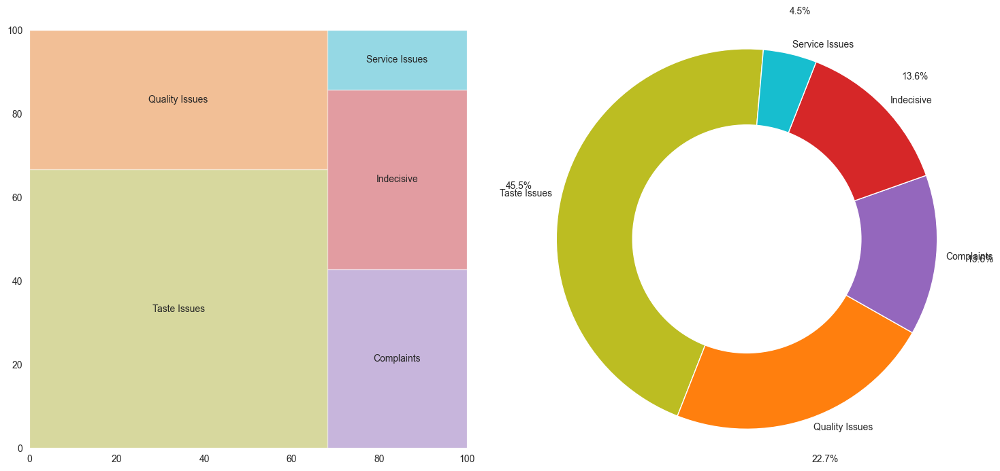

Above & Beyond, Garden Kitchen & Club - Number of reviews: 7


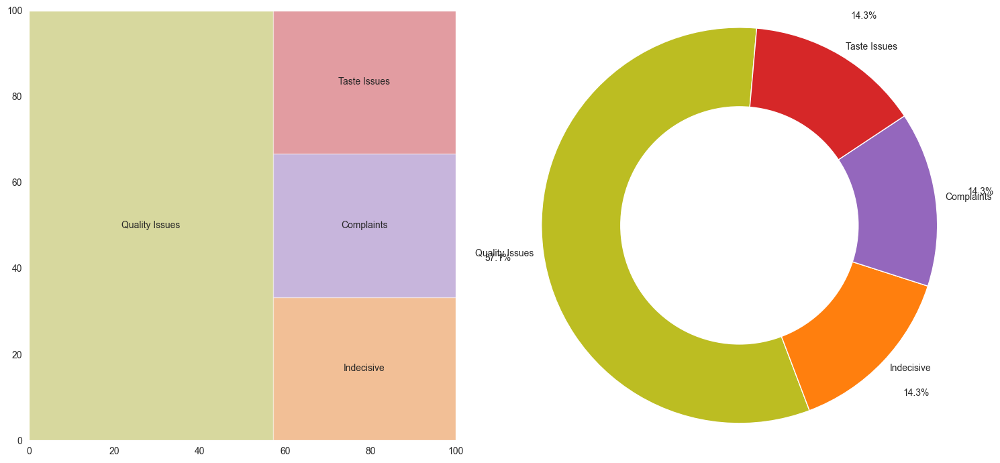

Alishan Restaurant - Number of reviews: 26


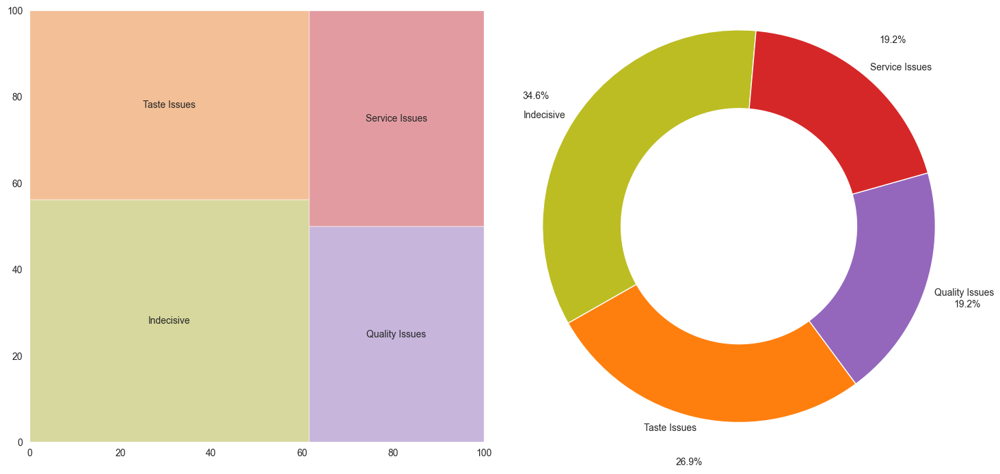

Amer Bakery Hut - Number of reviews: 46


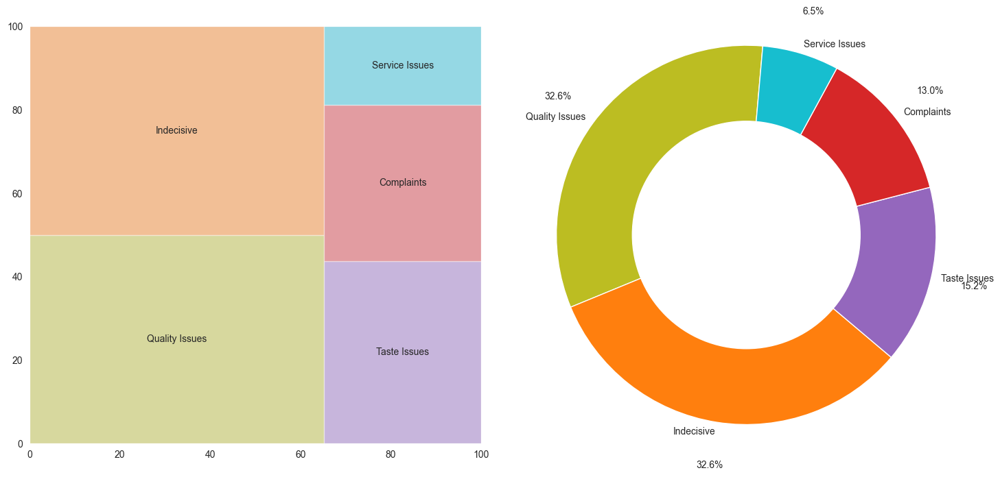

Anny's Artisan Bistro - Number of reviews: 21


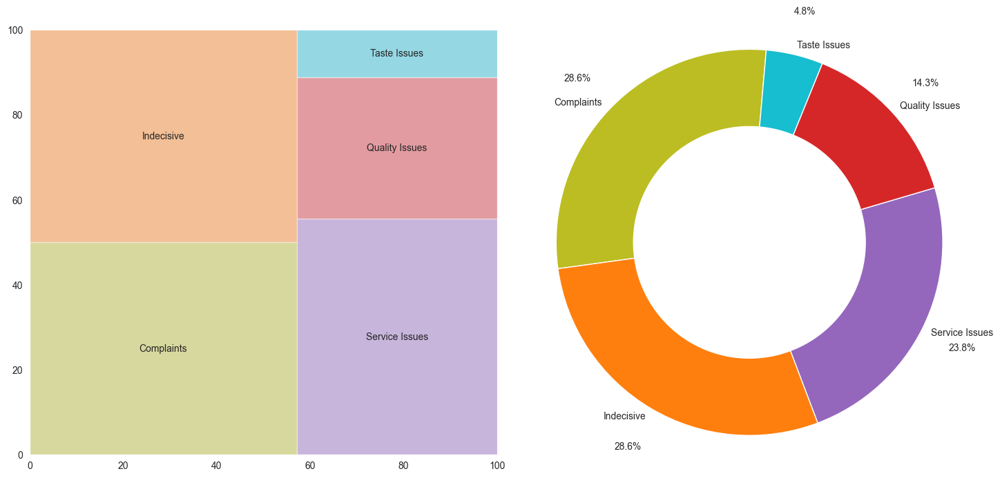

Arpit's Rivaayat - Number of reviews: 51


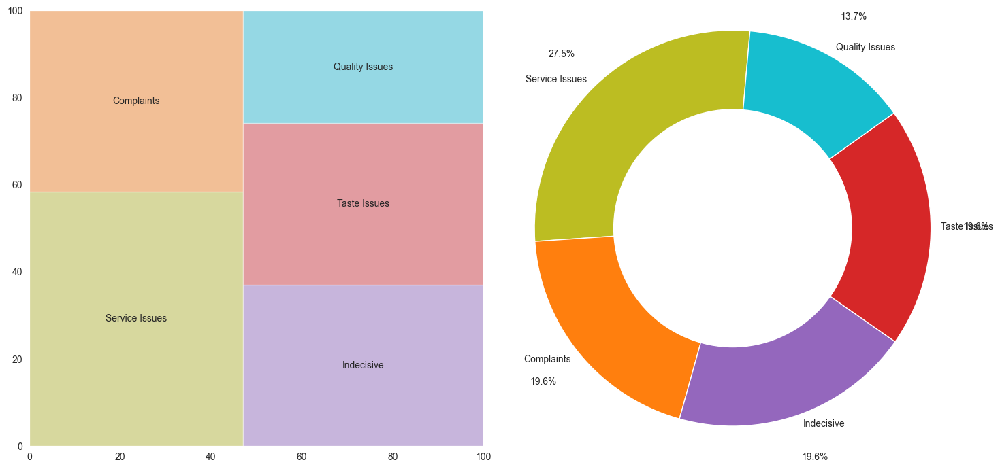

Atmosphere - Number of reviews: 6


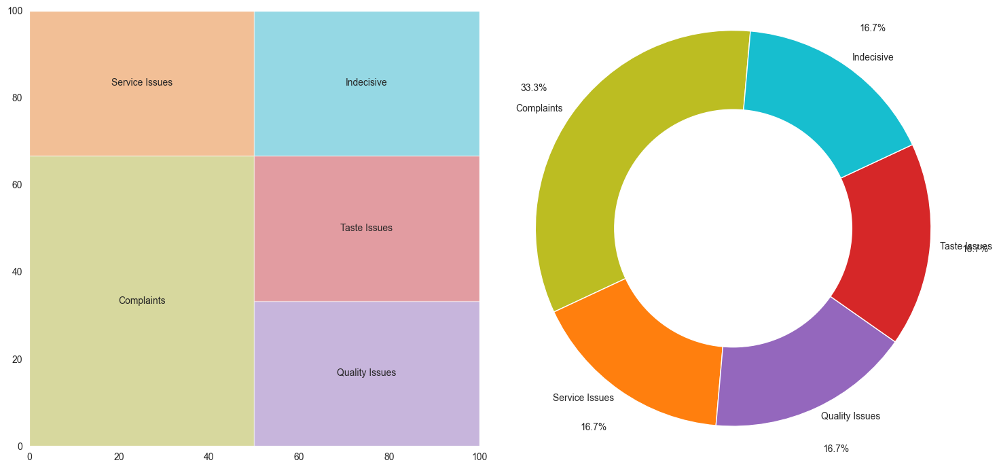

Bageecha Bistro - Number of reviews: 2


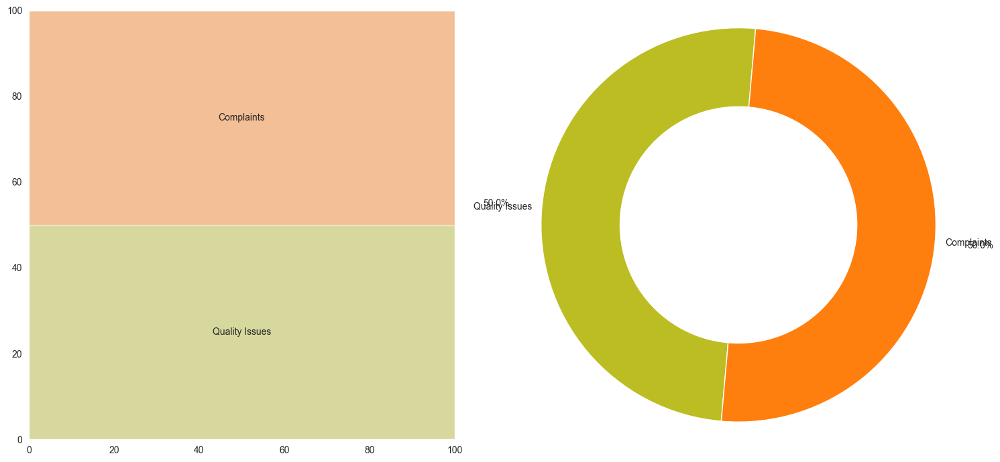

Bake N Shake - Number of reviews: 49


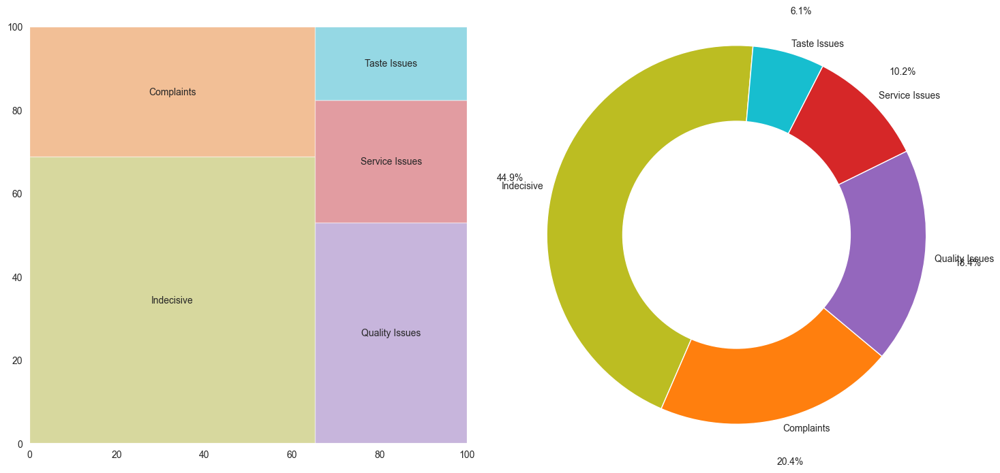

Bapu Ki Kutia - Number of reviews: 87


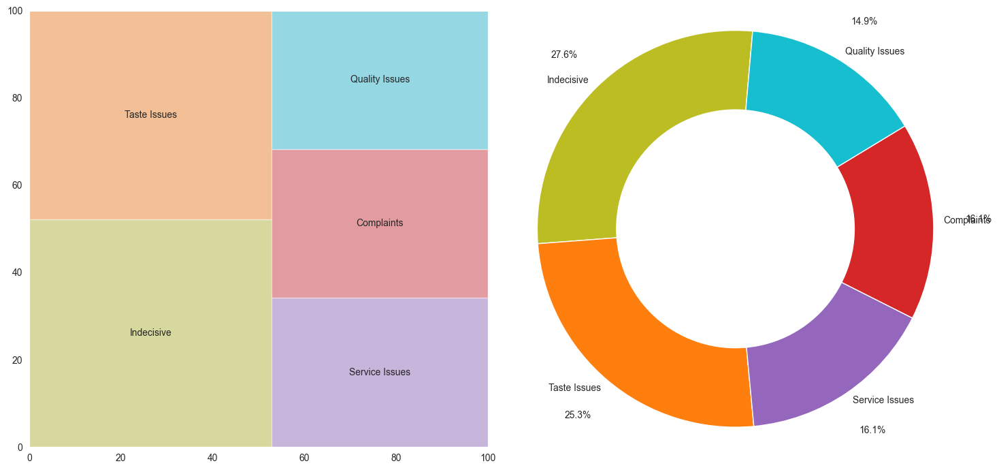

Barbeque Nation - Number of reviews: 80


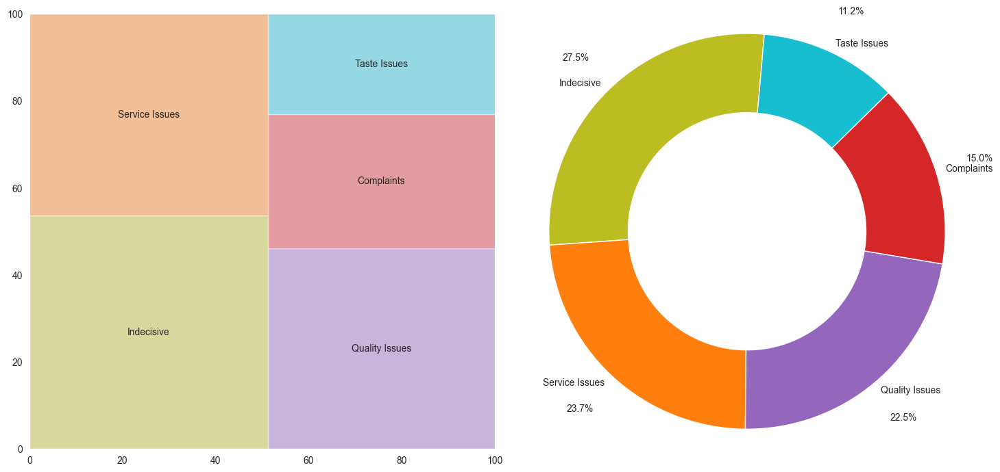

Bhopal Bakehouse & Cafe - Number of reviews: 42


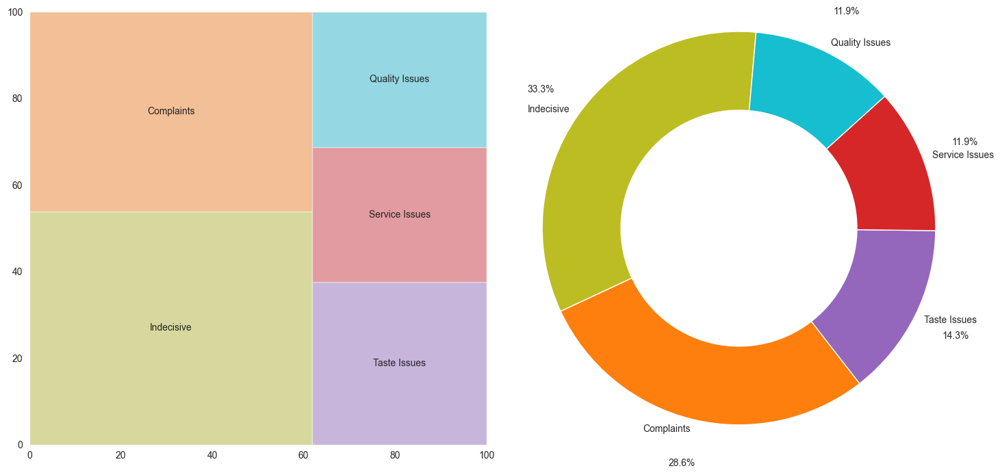

Bhopal Canteen - Number of reviews: 115


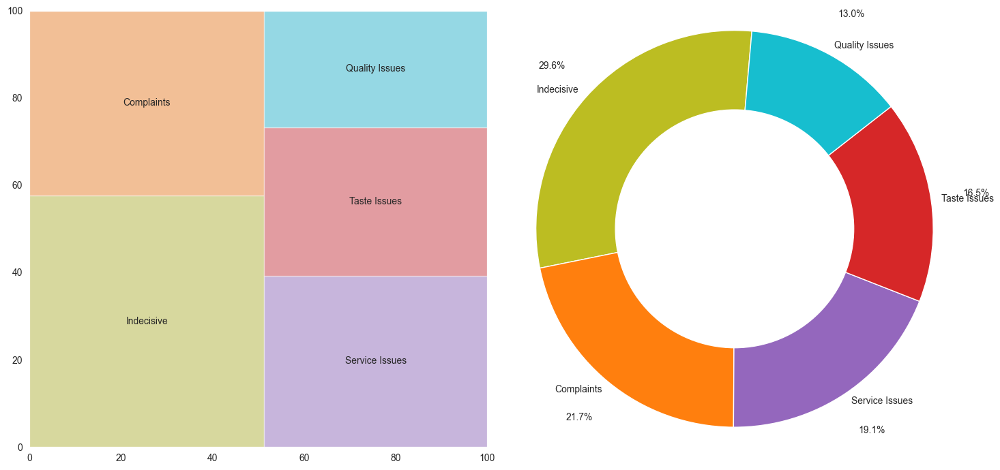

Bhopal Udipi Restaurant - Number of reviews: 87


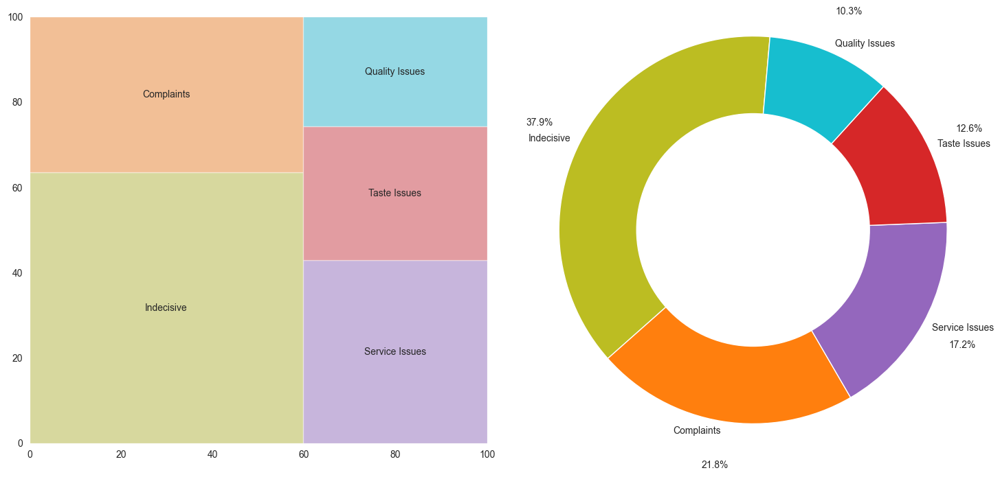

Black Mamba Pub & Club - Number of reviews: 12


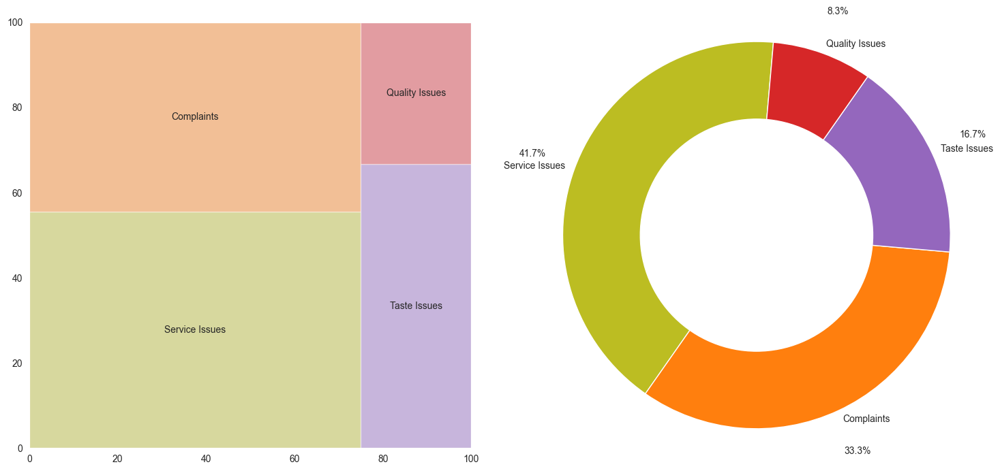

Blue Lagoon Resort - Number of reviews: 11


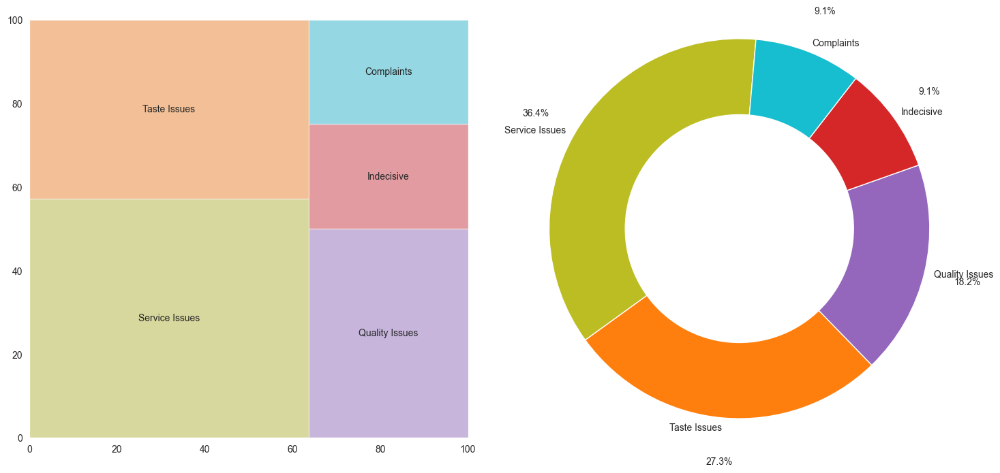

Boscos - Number of reviews: 13


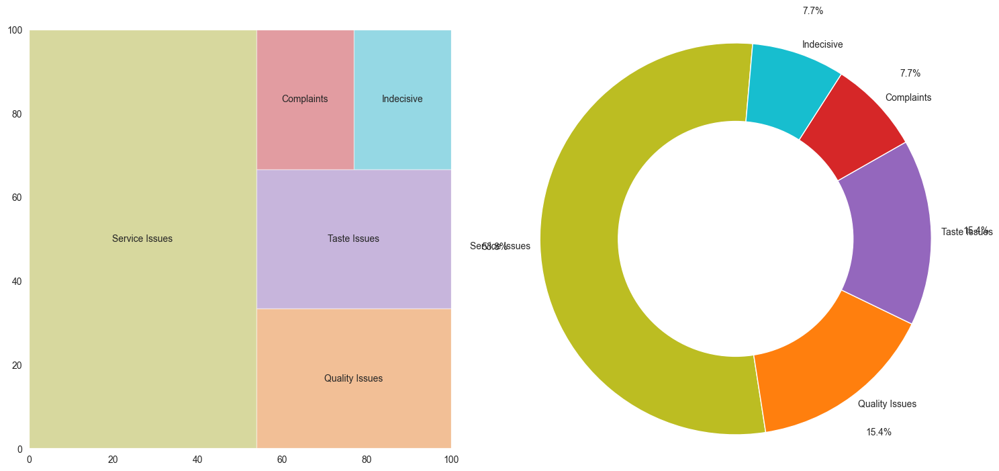

Brewzo Cafe - Number of reviews: 5


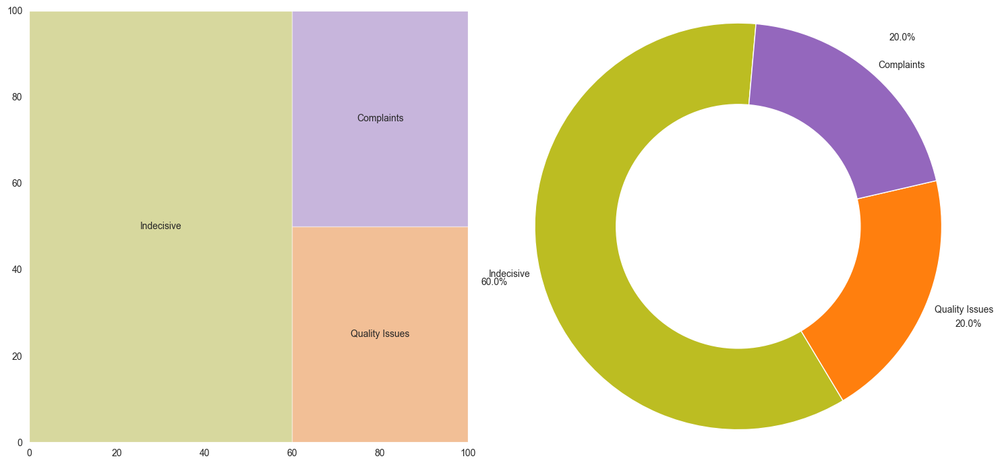

Bun Teaa The Roof Top Baithak - Number of reviews: 10


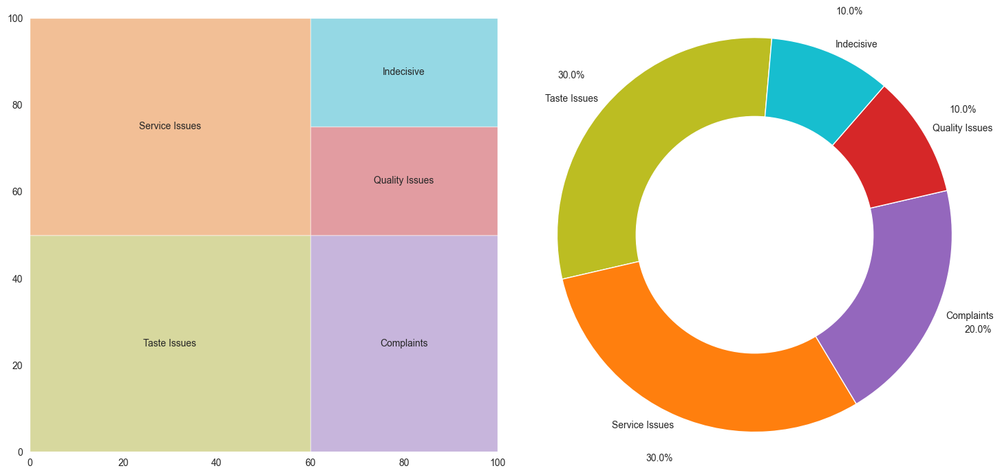

Cafe Amado - Number of reviews: 18


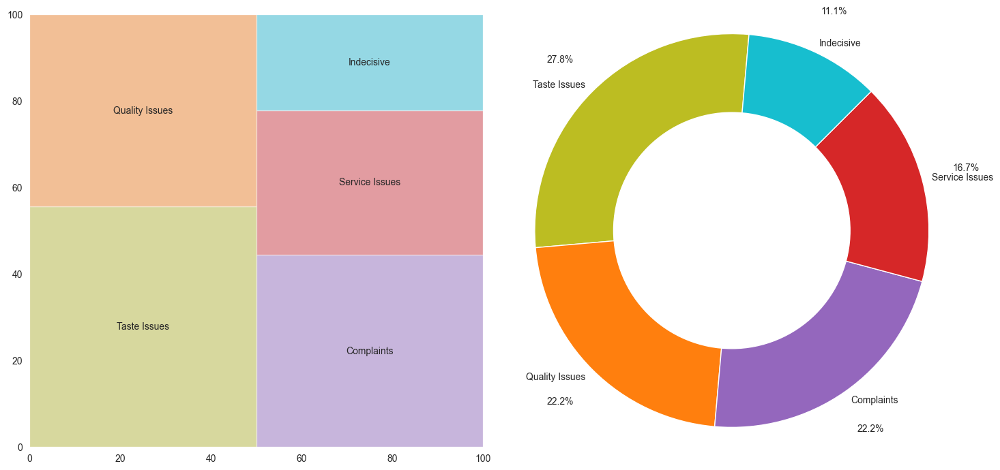

Cafe Latte - Number of reviews: 6


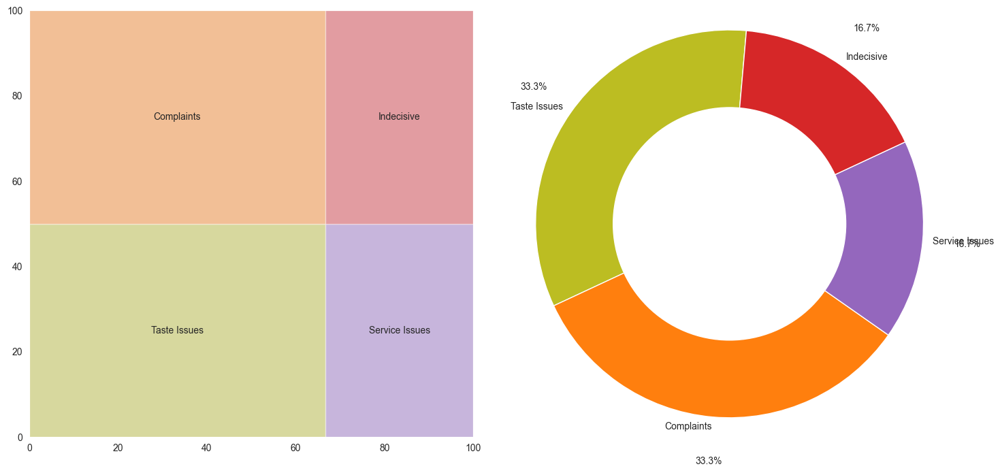

CafeChino - Jehan Numa Palace - Number of reviews: 10


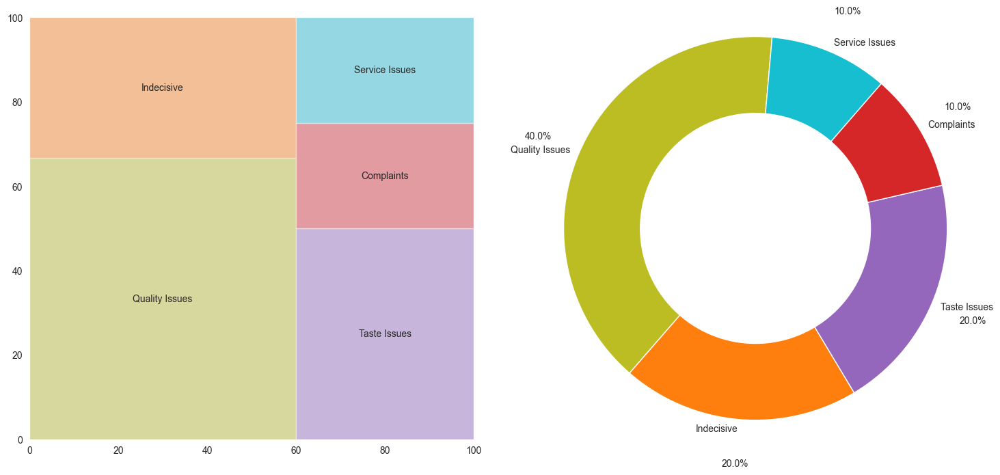

Cake Adda - Number of reviews: 28


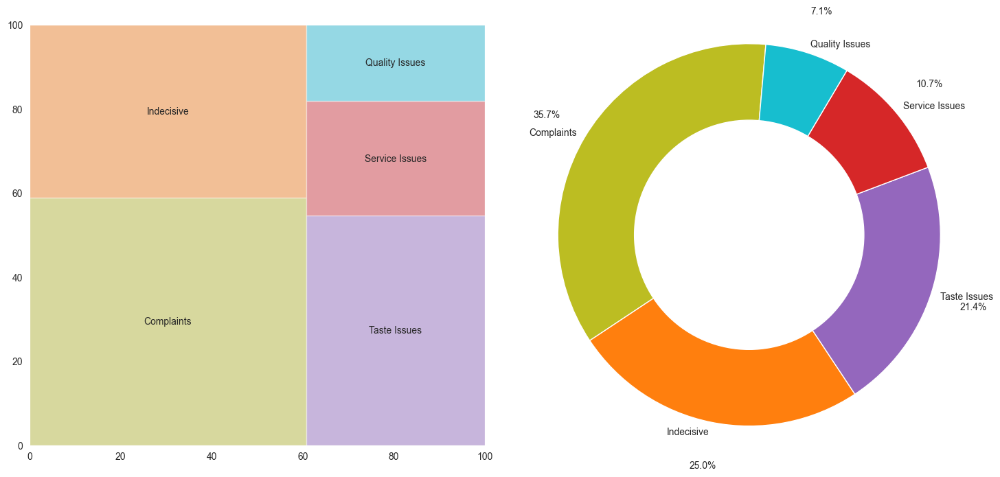

Celebrations Resort - Number of reviews: 21


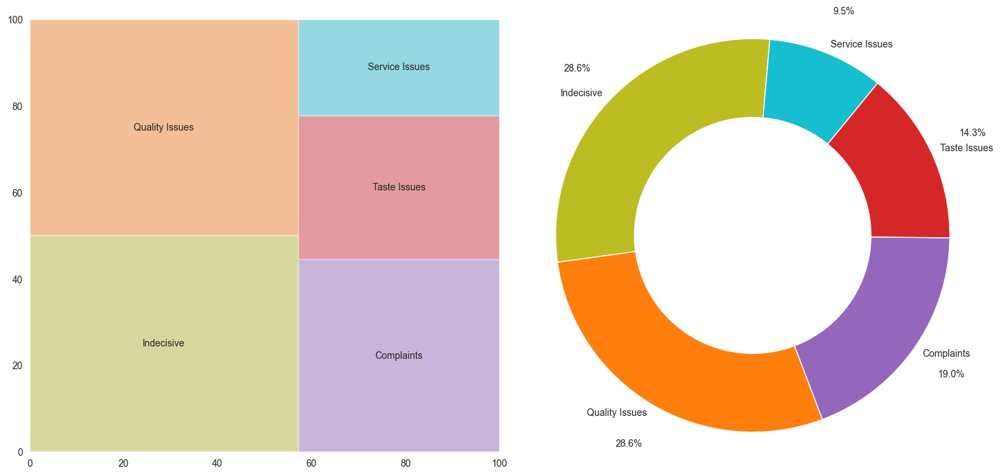

Chai Ho Jaye - Number of reviews: 30


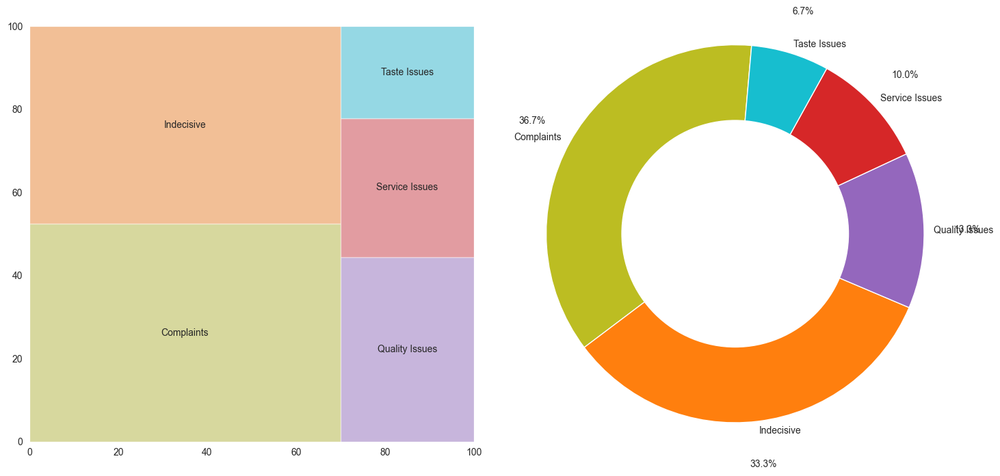

Chai Nagri - Number of reviews: 4


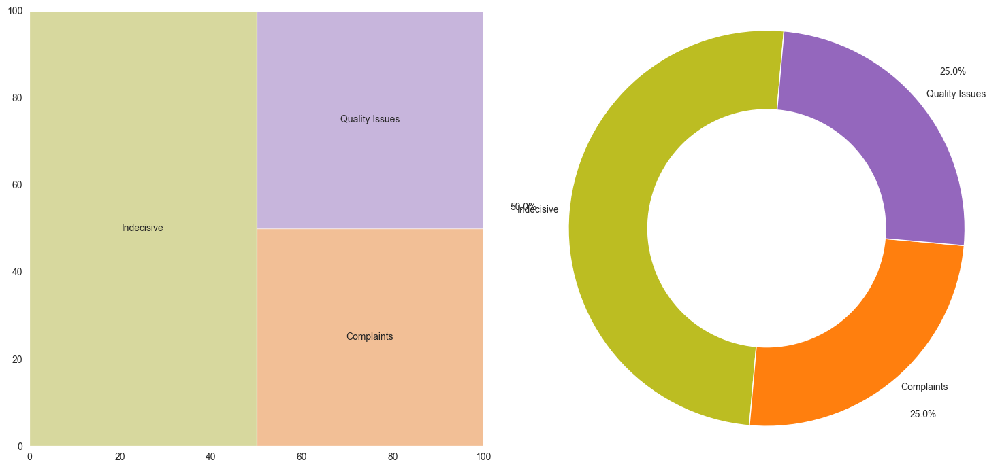

Chicken Kukduku - Number of reviews: 68


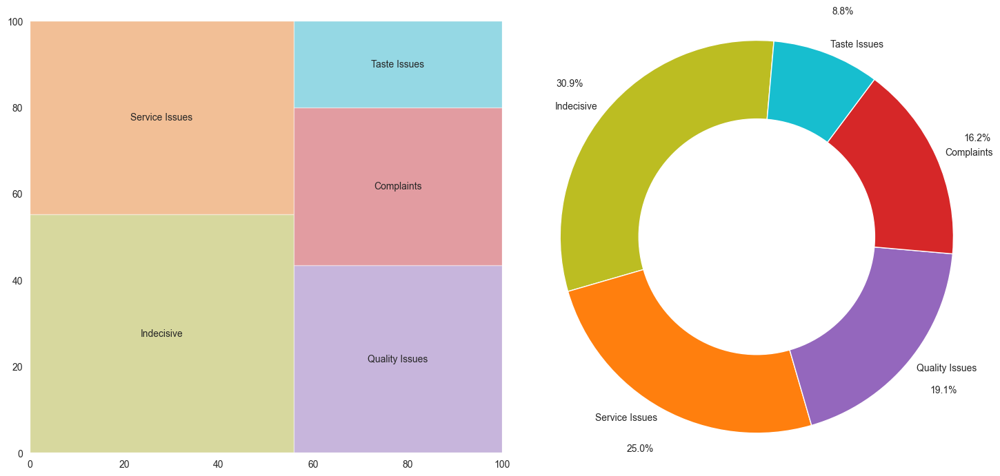

Cloud - 9 Espresso - Number of reviews: 74


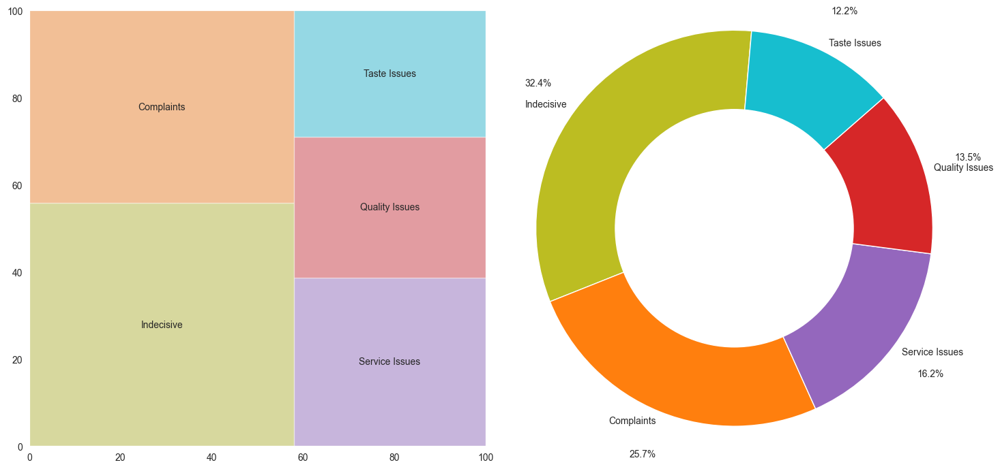

Coffee Cafe - Number of reviews: 16


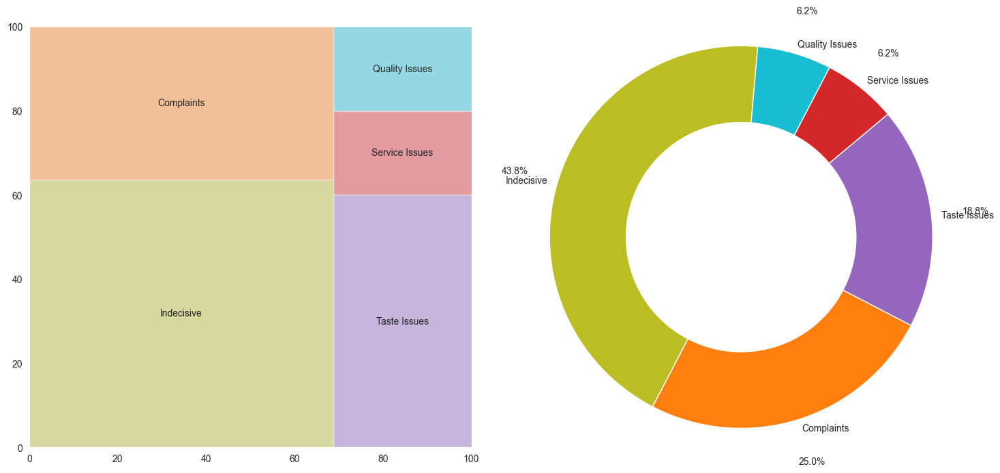

Countryside Meadows - Number of reviews: 21


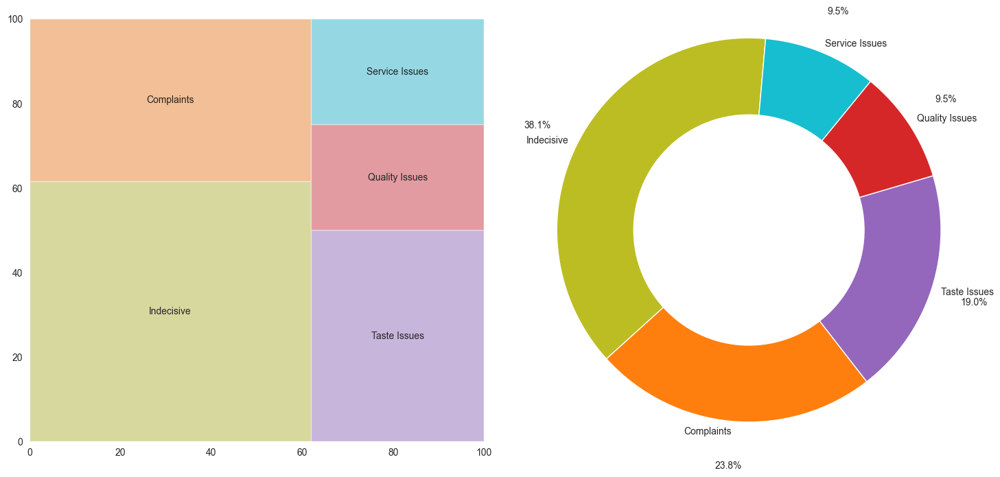

Culture Bakery Cafe - Number of reviews: 43


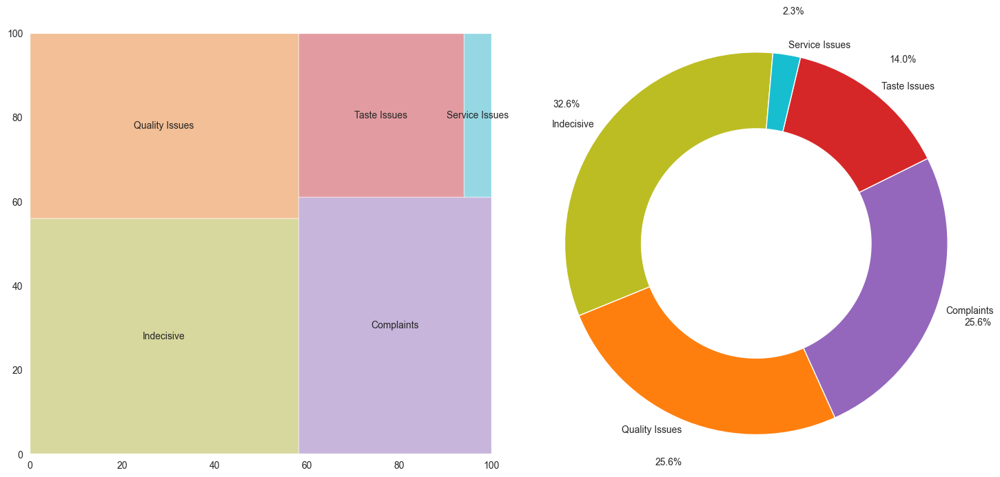

D-Runch Kitchen Lounge - Number of reviews: 4


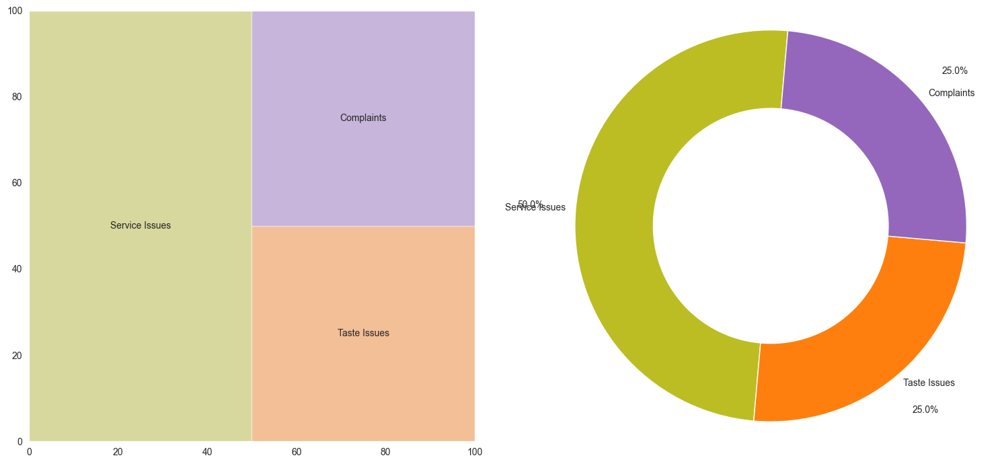

Ecko- Artisanal Bistro - Number of reviews: 47


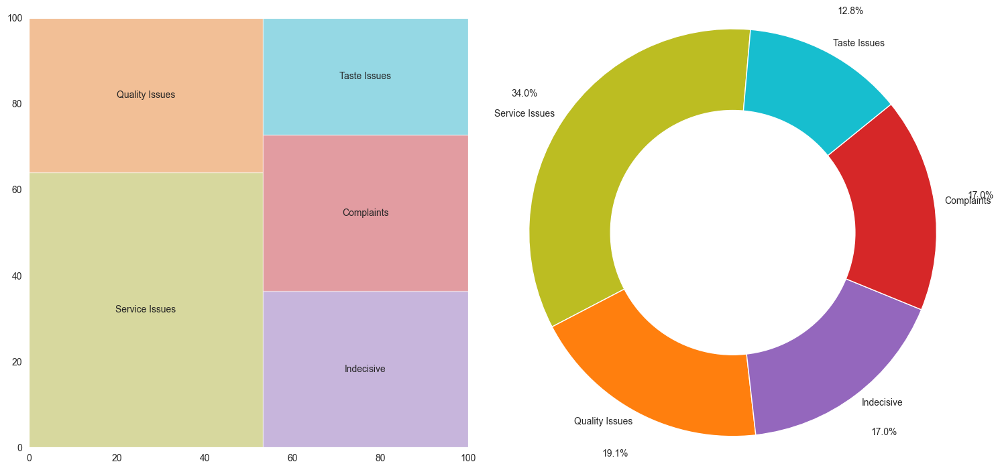

Effotel By Sayaji - Number of reviews: 74


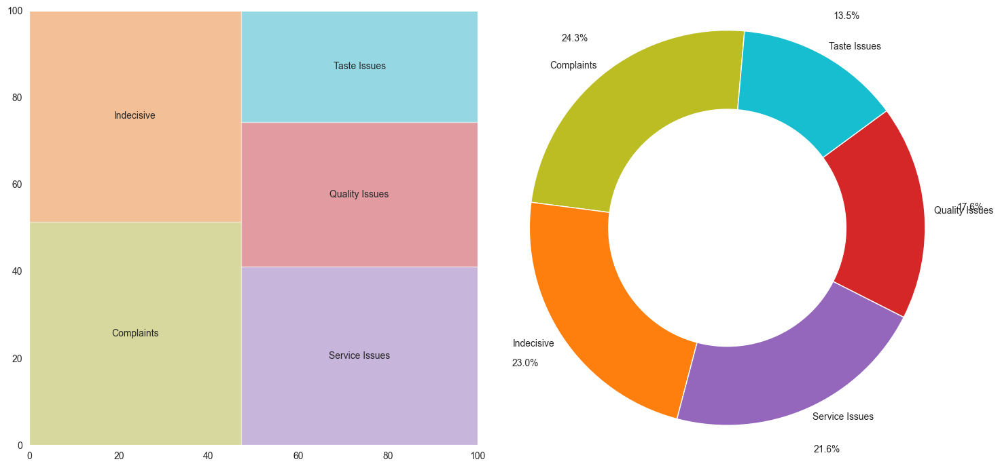

Eighteen Calories - The Healthy Food Cafe - Number of reviews: 38


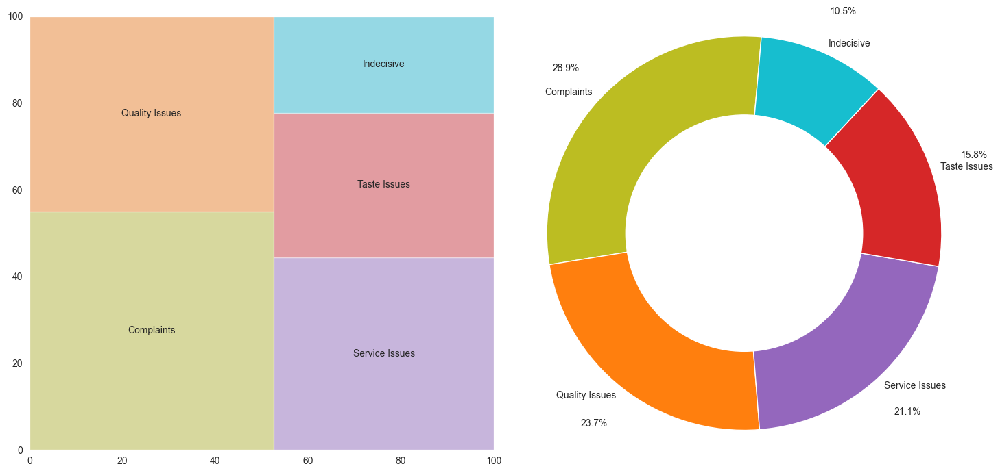

Elixir Airborne - Number of reviews: 1


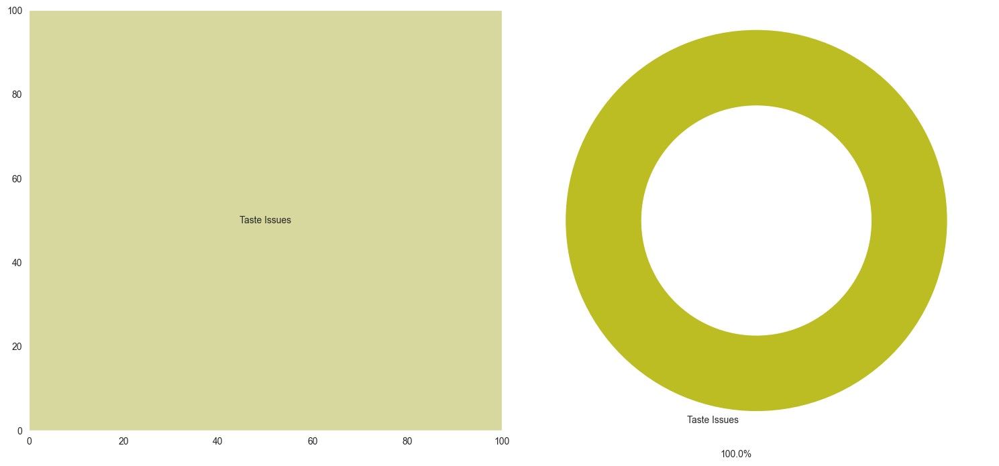

Evening Post - Number of reviews: 4


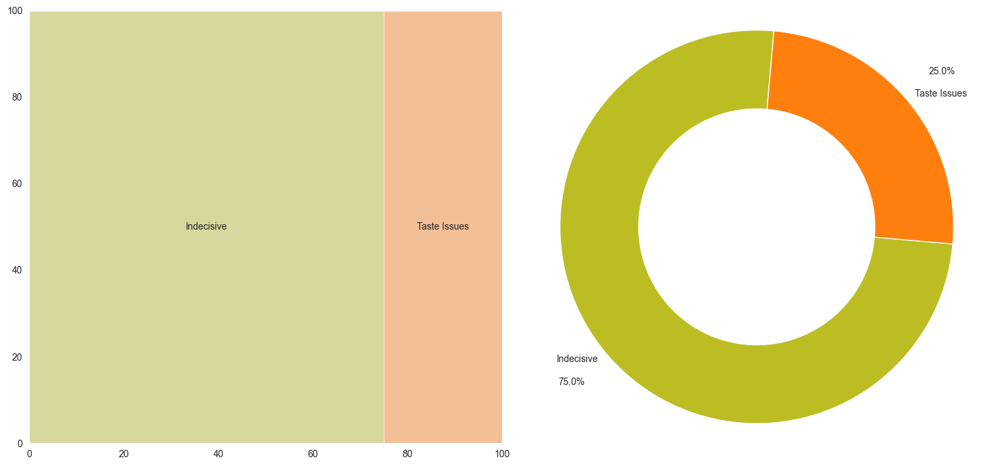

Fagito - Number of reviews: 48


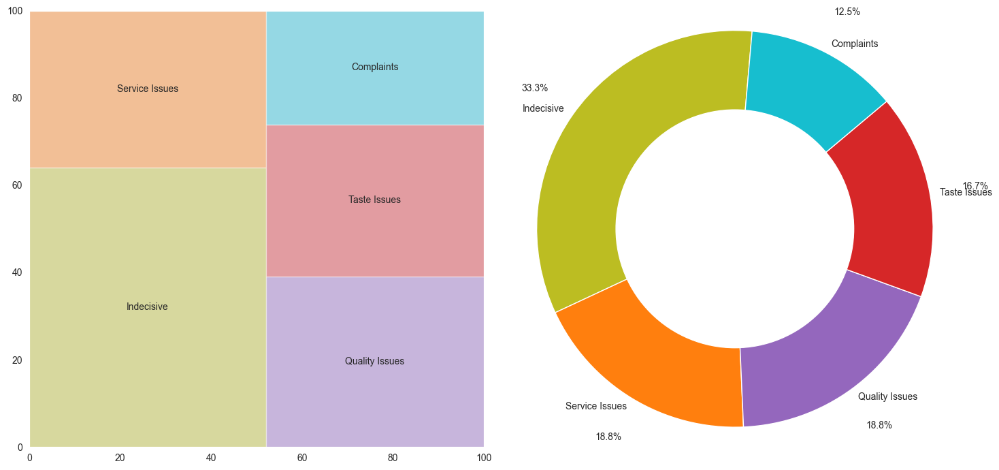

Farzi Cafe - Number of reviews: 9


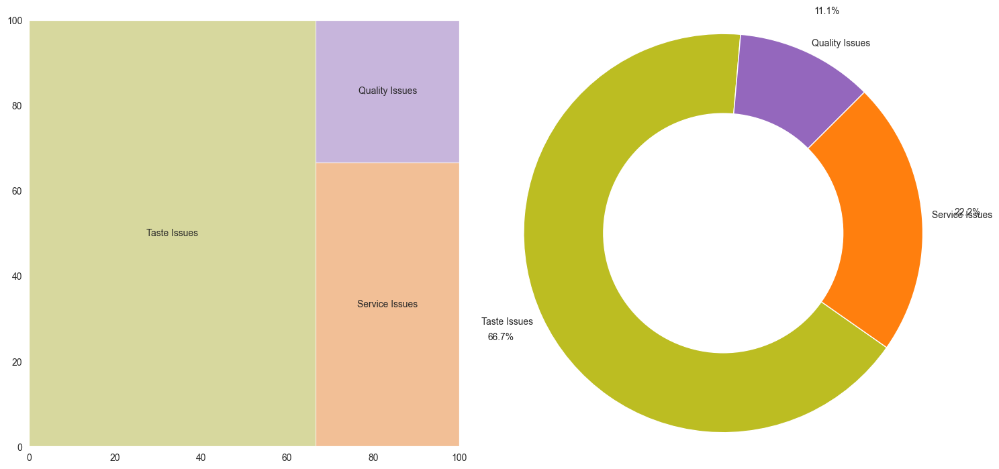

Fusion Cafe - Radisson Hotel - Number of reviews: 10


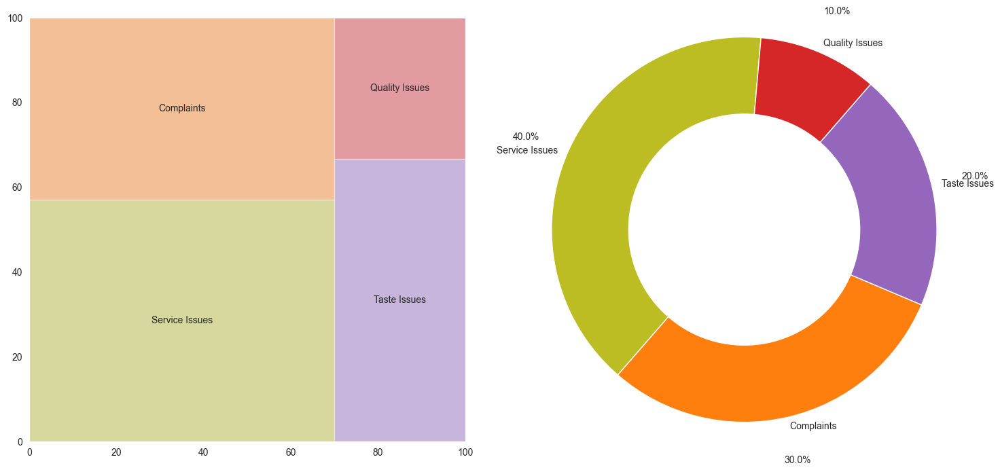

Golden Tulip - Number of reviews: 3


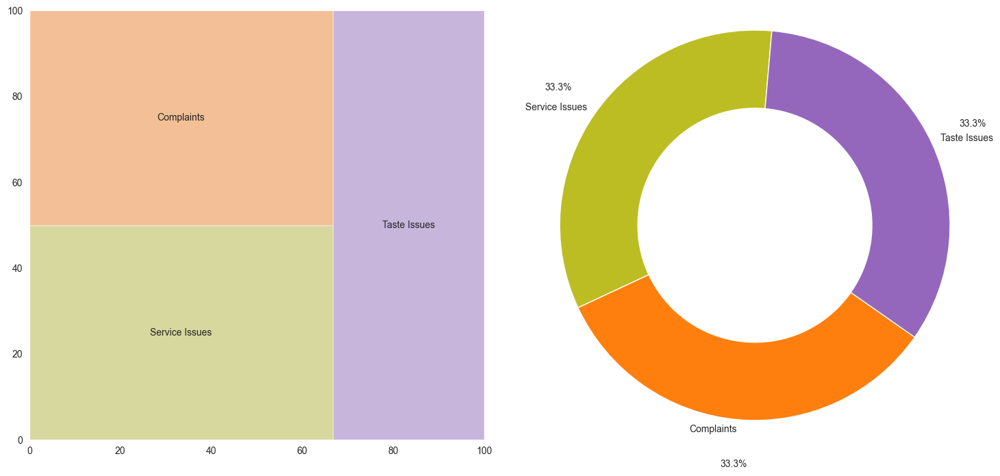

Green House Bistro - Number of reviews: 7


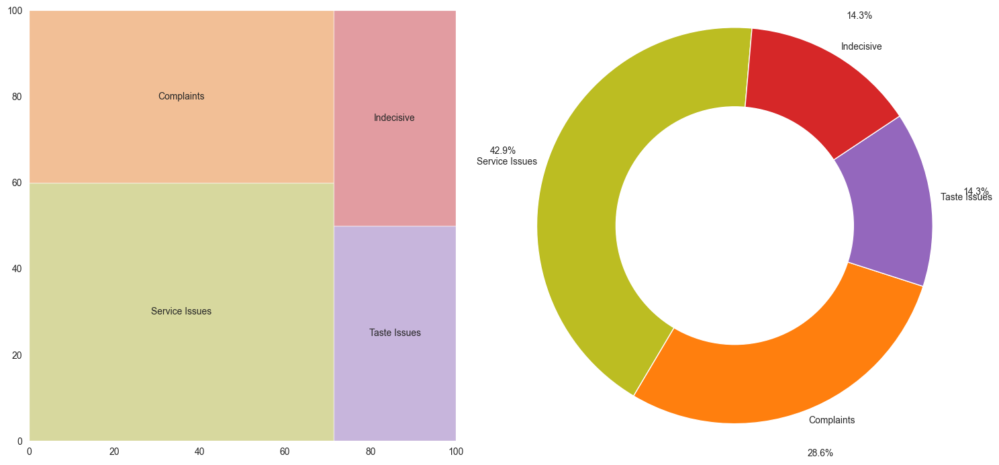

Hakeem Restaurant - Number of reviews: 52


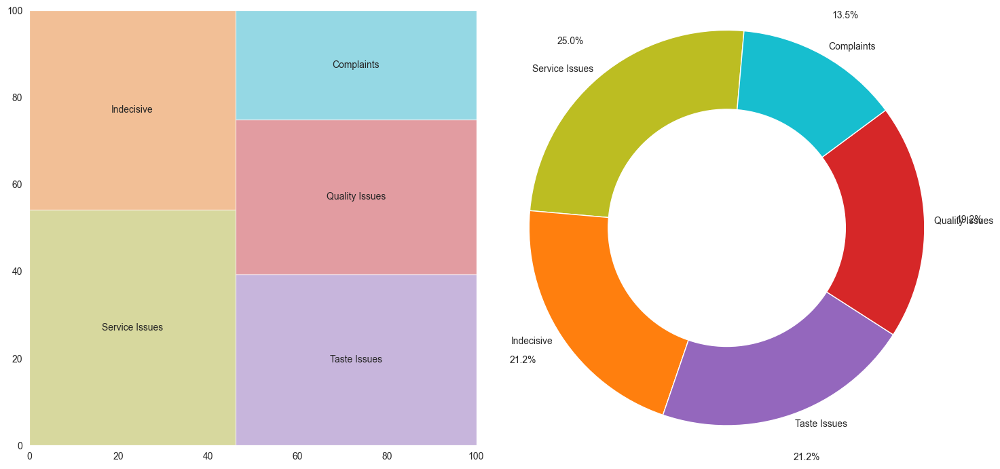

Handcrafted Cafe & Roastery - Number of reviews: 6


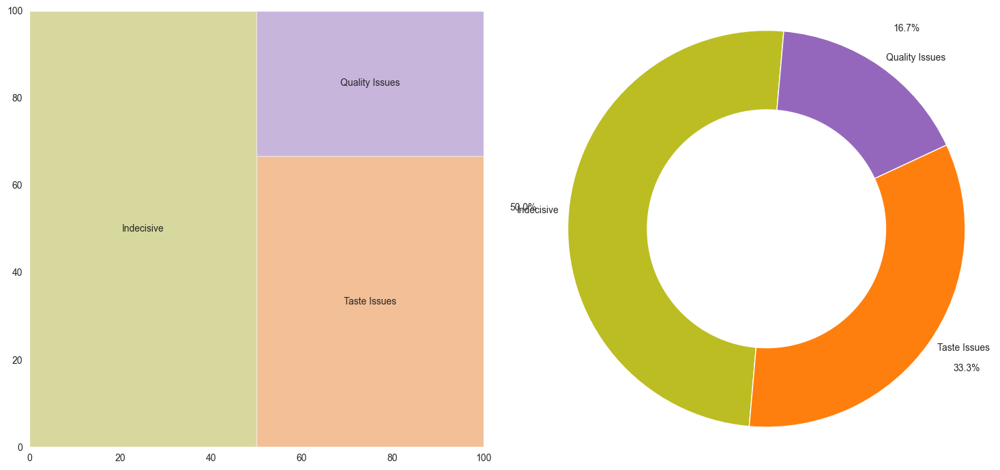

Hotel Kavish Mahal - Number of reviews: 22


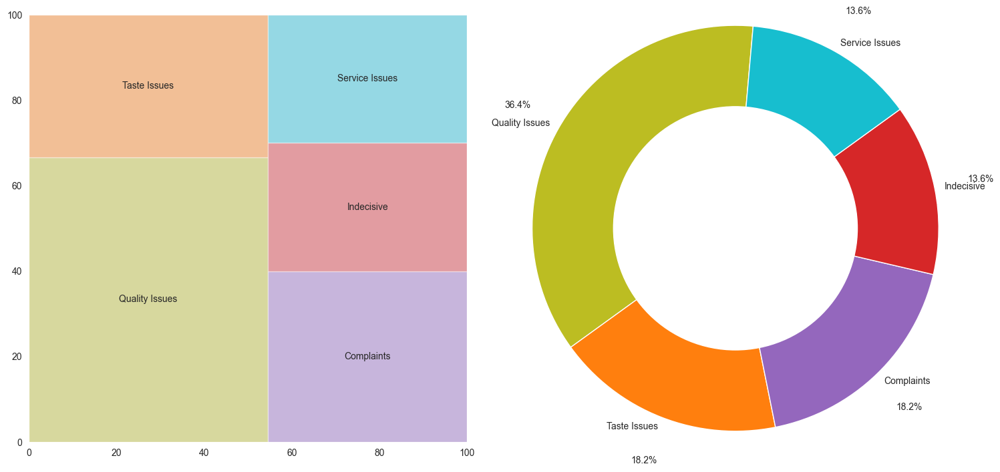

Hotel Rajhans Regent - Number of reviews: 27


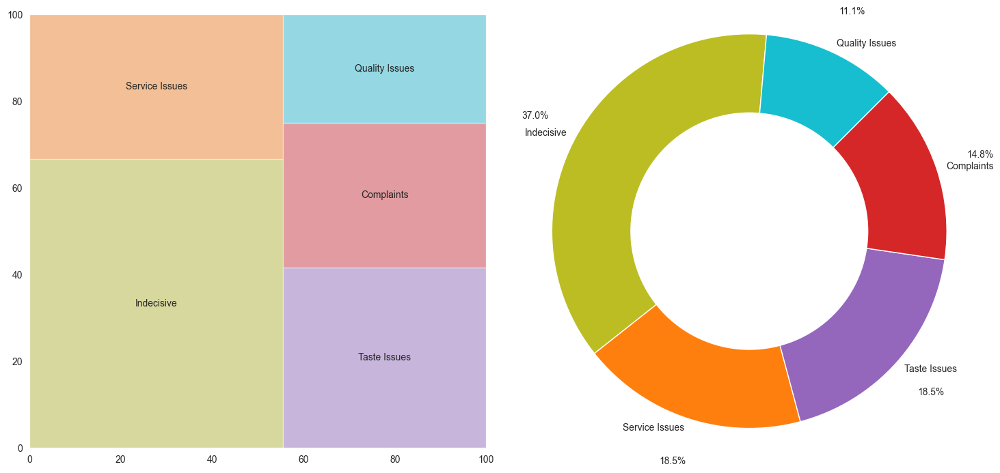

Hotel The Oasis - Number of reviews: 1


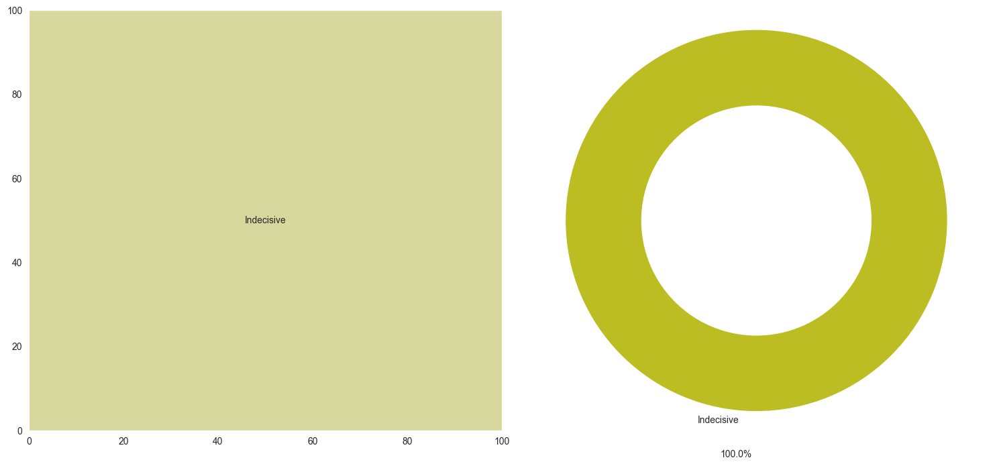

House 230- The Gourmet Kitchen - Number of reviews: 4


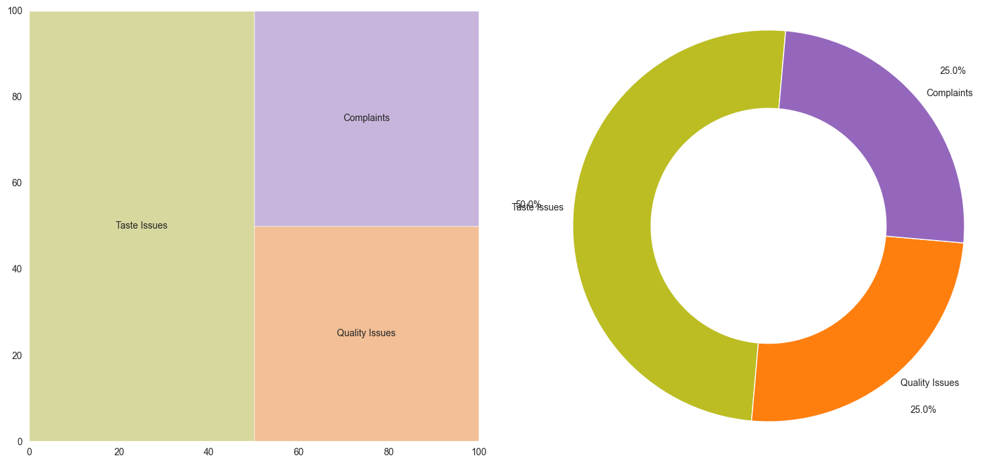

House Of Delici - Number of reviews: 84


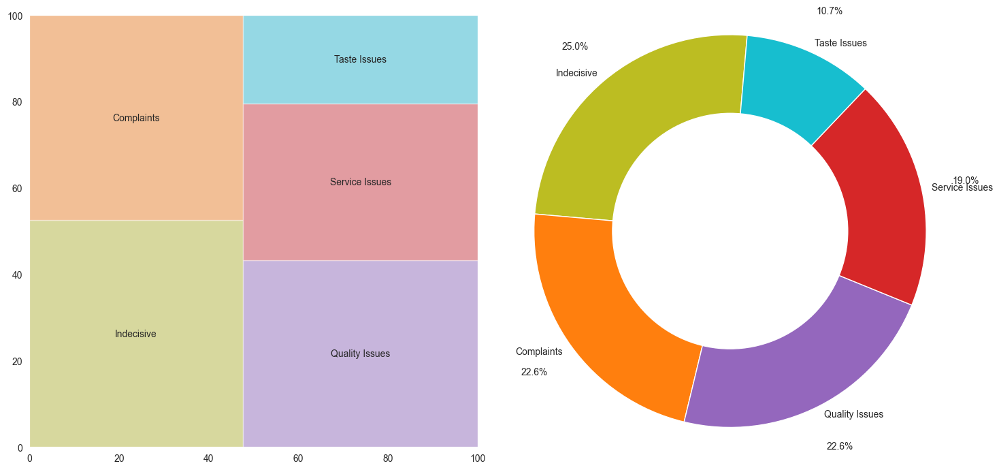

Humpty Dumpty Restaurant - Number of reviews: 7


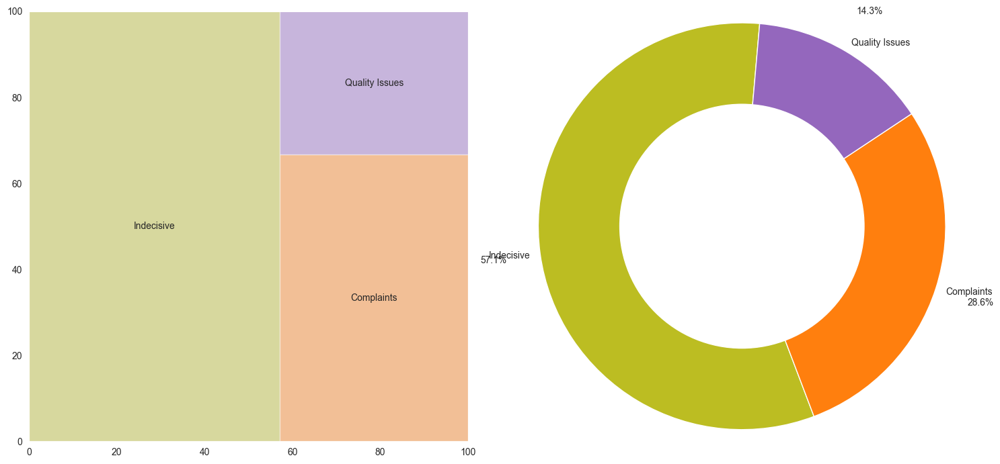

Idli Street - Number of reviews: 47


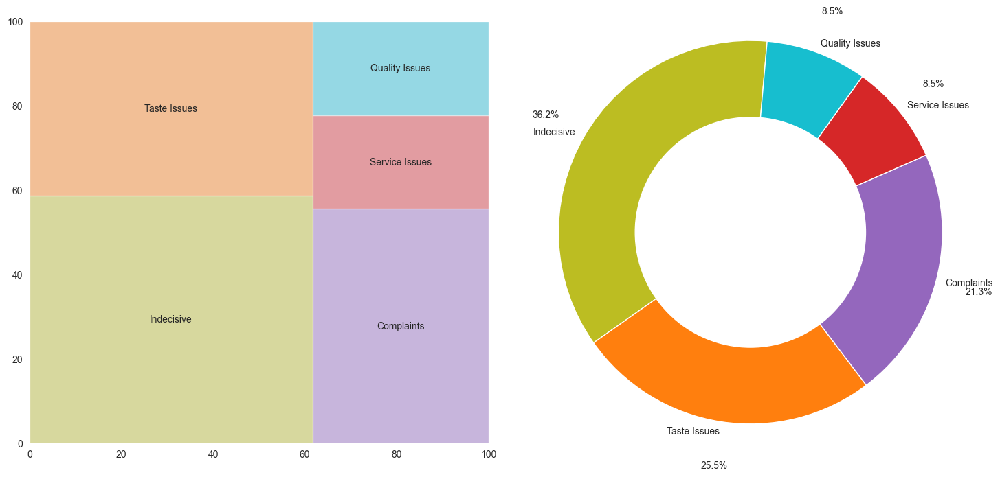

Infinity - Taj Lakefront - Number of reviews: 6


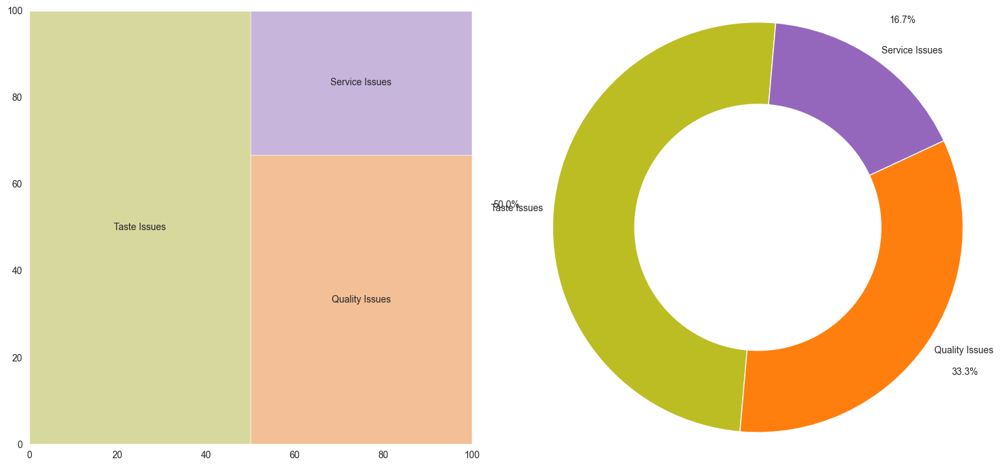

Ivoryy - Number of reviews: 27


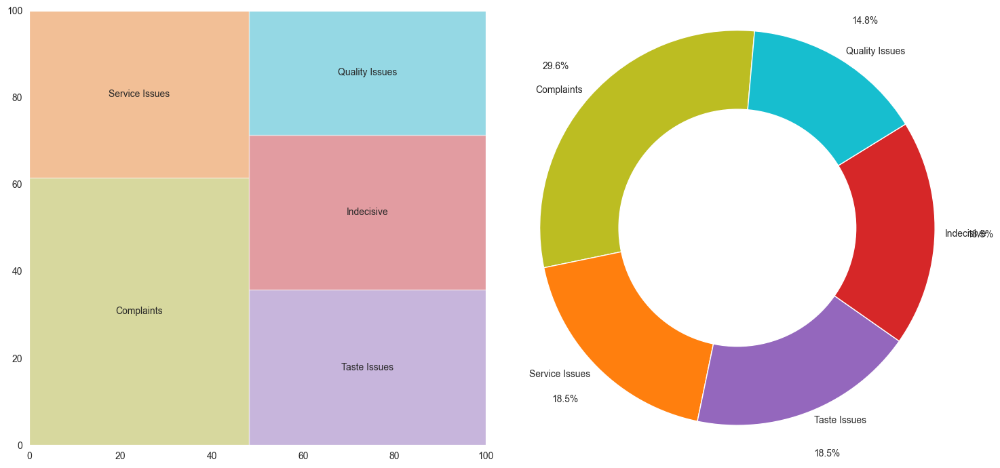

Jharokha - Hotel Amer Palace - Number of reviews: 67


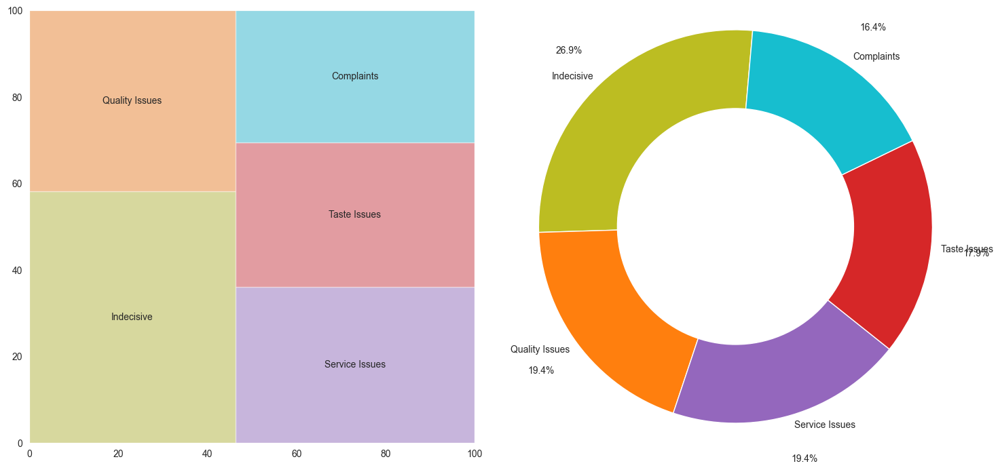

Juhnuhnee - Number of reviews: 6


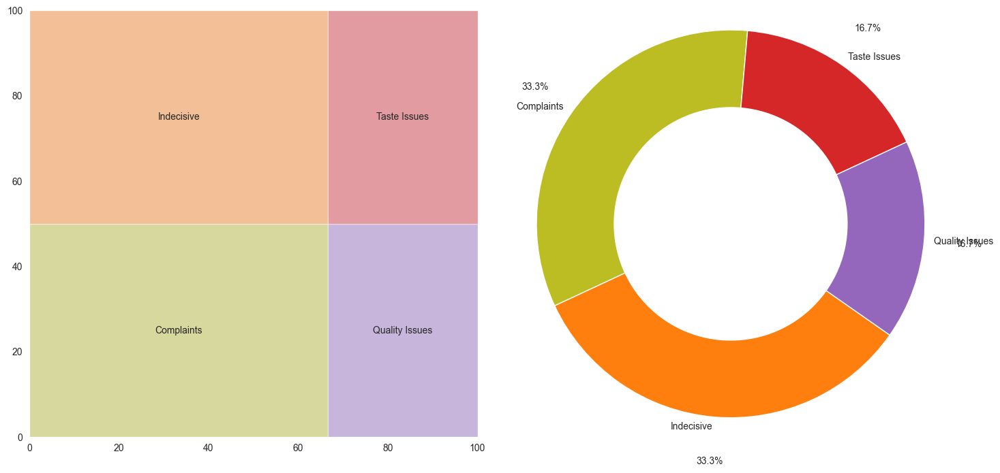

Kebabsville - Sayaji Hotel - Number of reviews: 43


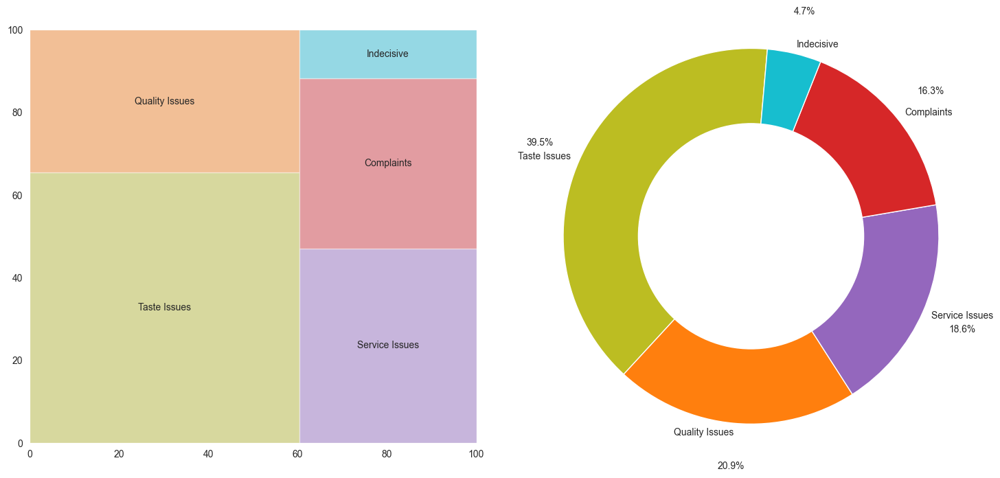

KFC - Number of reviews: 78


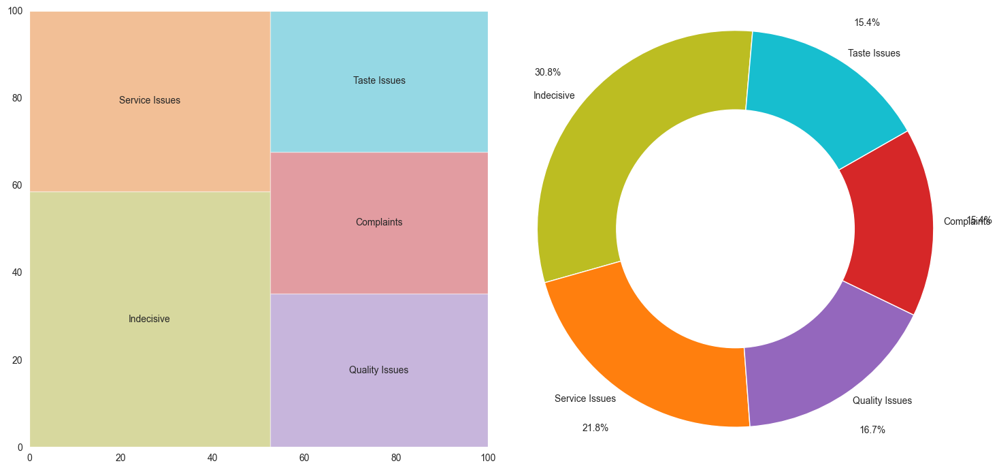

La Kuchina - Jehan Numa Palace - Number of reviews: 29


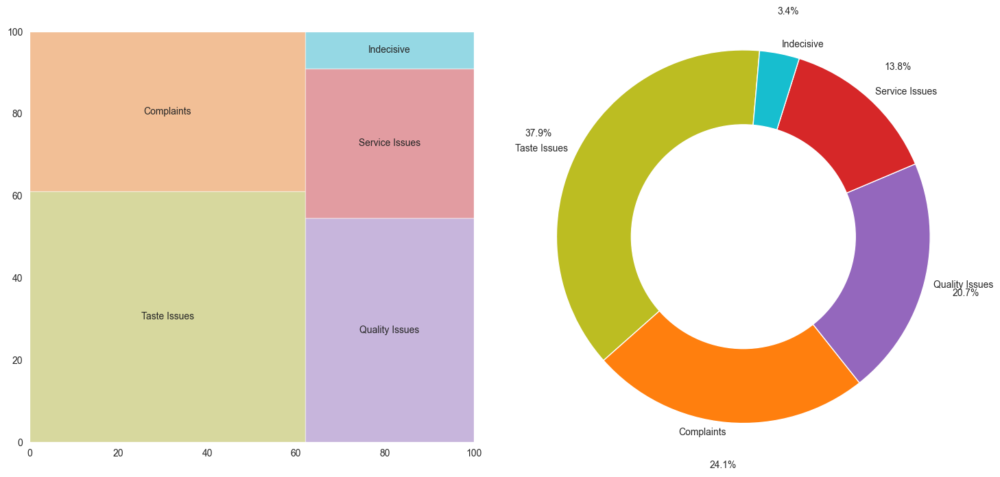

Lamington Cafe Patisserie - Number of reviews: 17


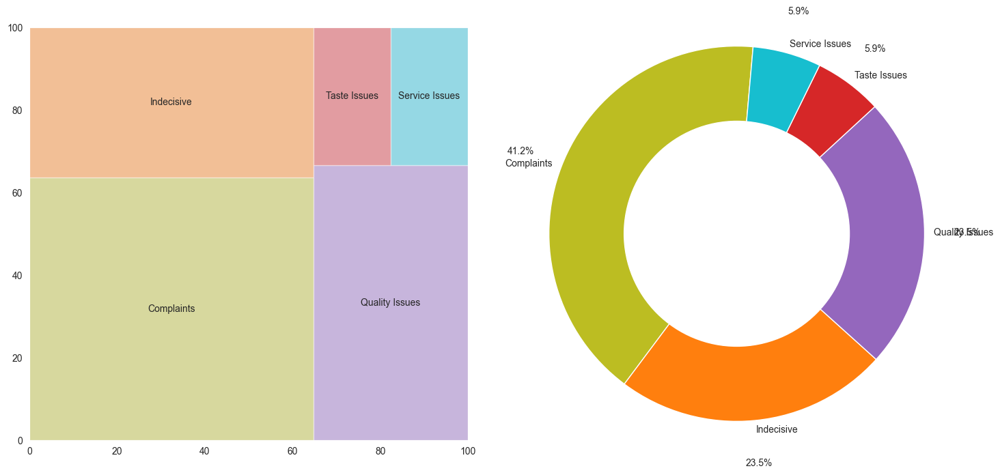

Land Of Liberty - Number of reviews: 2


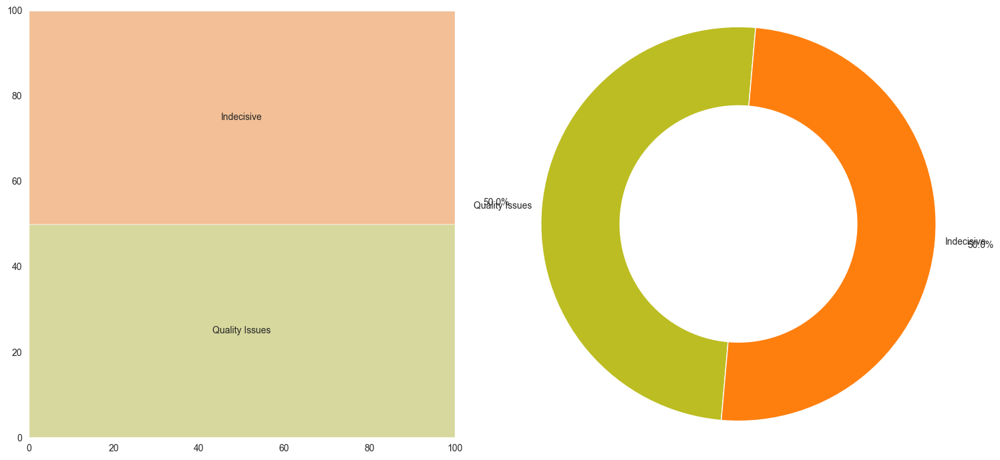

Latitude Cafe And Restro - Number of reviews: 8


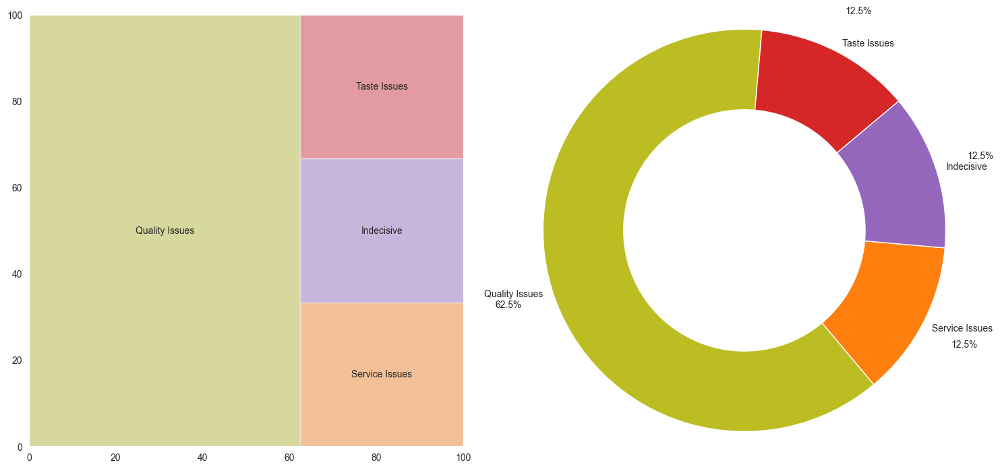

Lord Of The Drinks - Number of reviews: 3


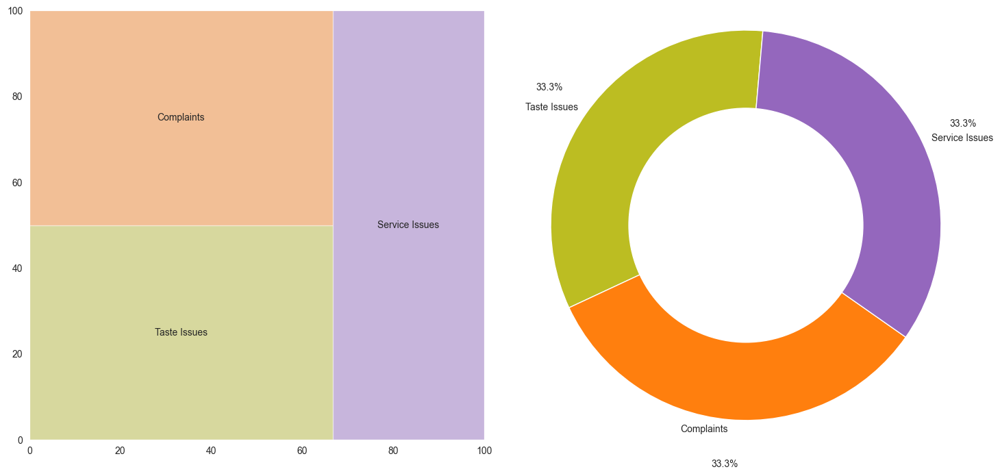

Machan - Number of reviews: 4


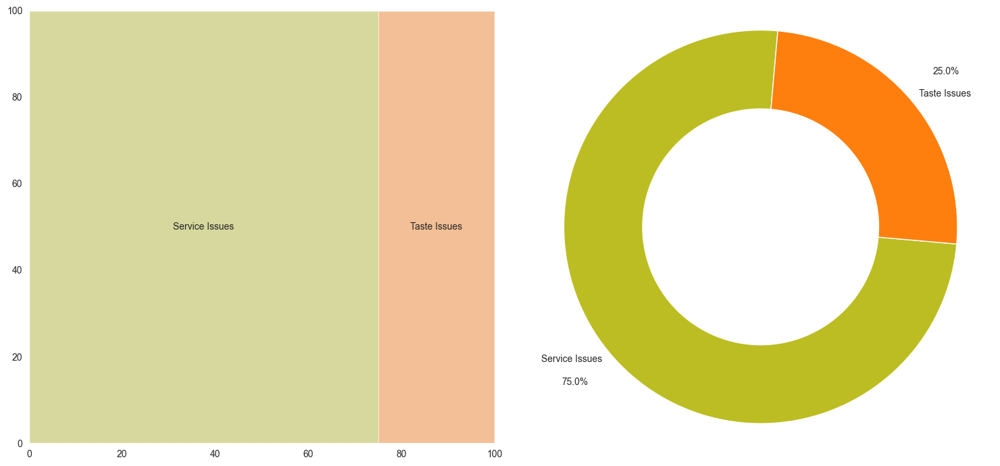

Manmarziyaan - Number of reviews: 44


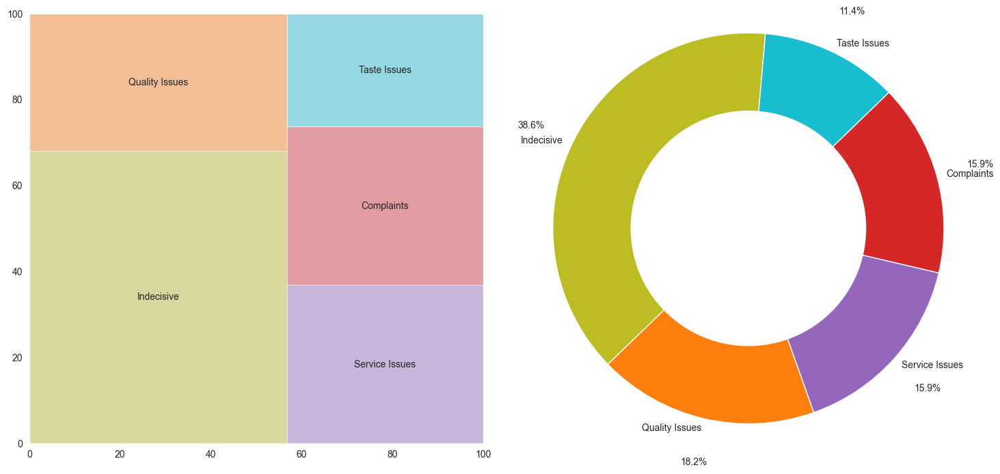

Mantar Restaurant - Number of reviews: 84


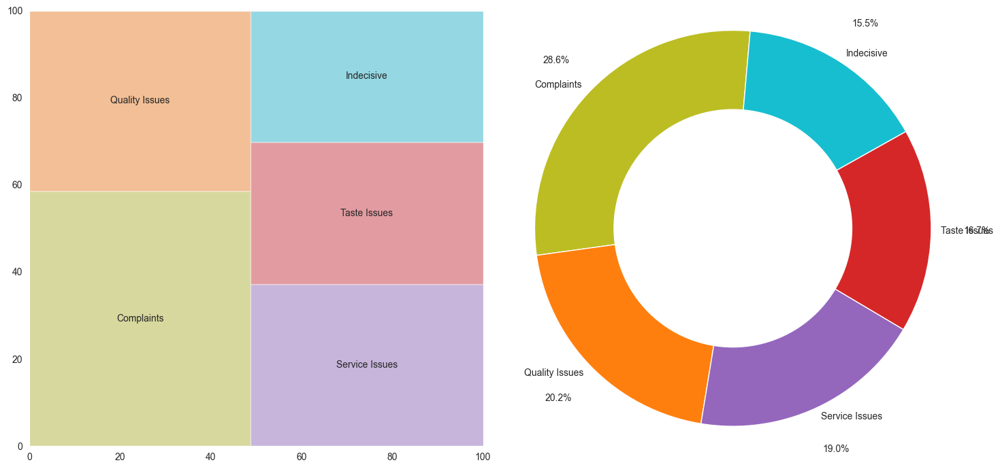

Marbal Arch - Noor Us Sabah Palace - Number of reviews: 18


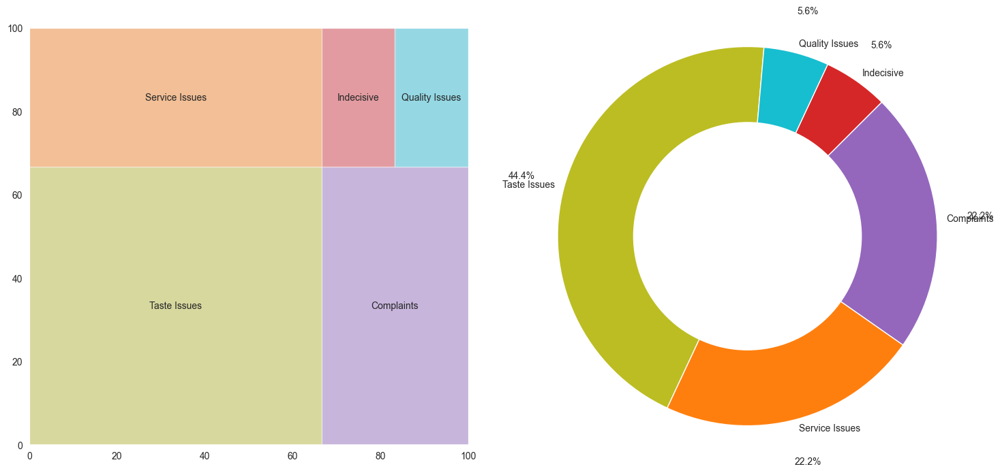

McDonald's - Number of reviews: 102


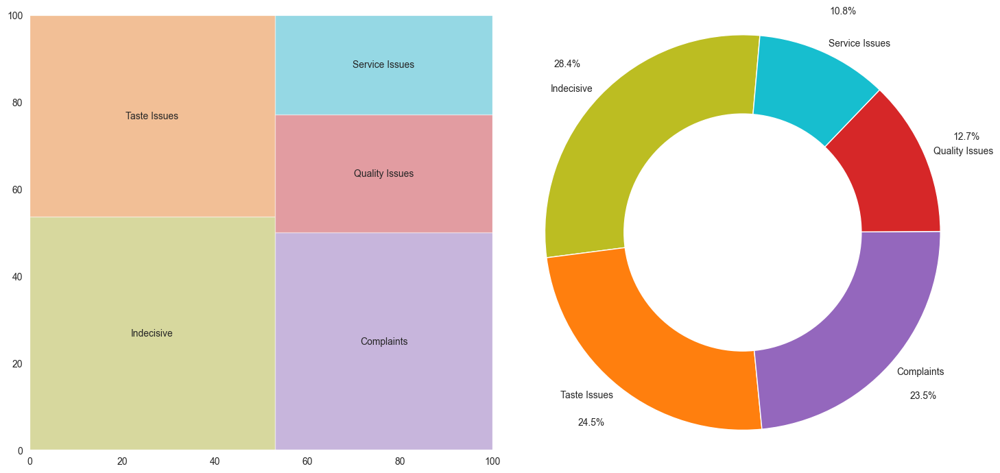

Mehfil E Dawat- Hotel La Pearl - Number of reviews: 67


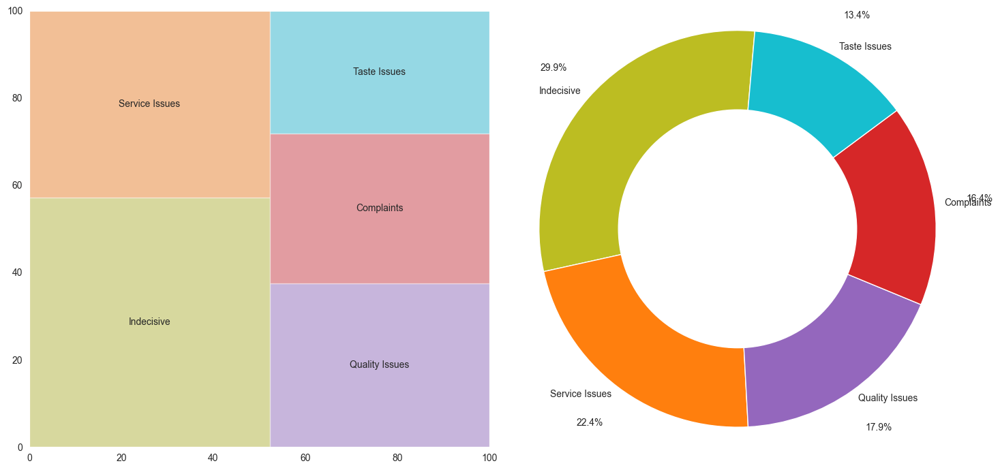

Memsaheb - Number of reviews: 10


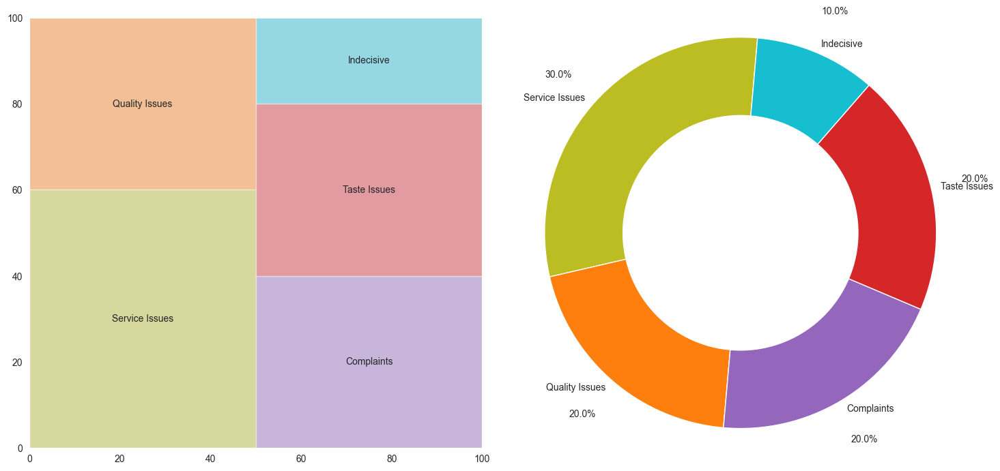

Ming Dynasty - Noor Us Sabah - Number of reviews: 3


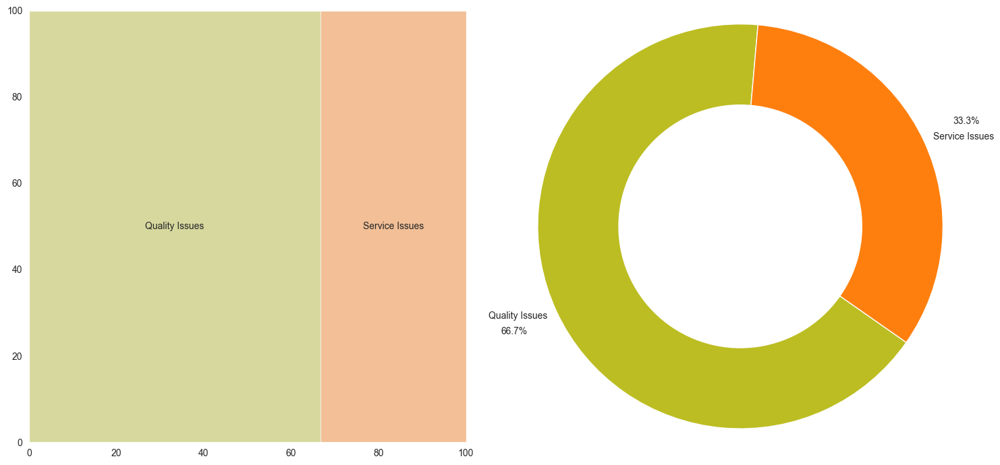

Mitho Wok Street - Number of reviews: 70


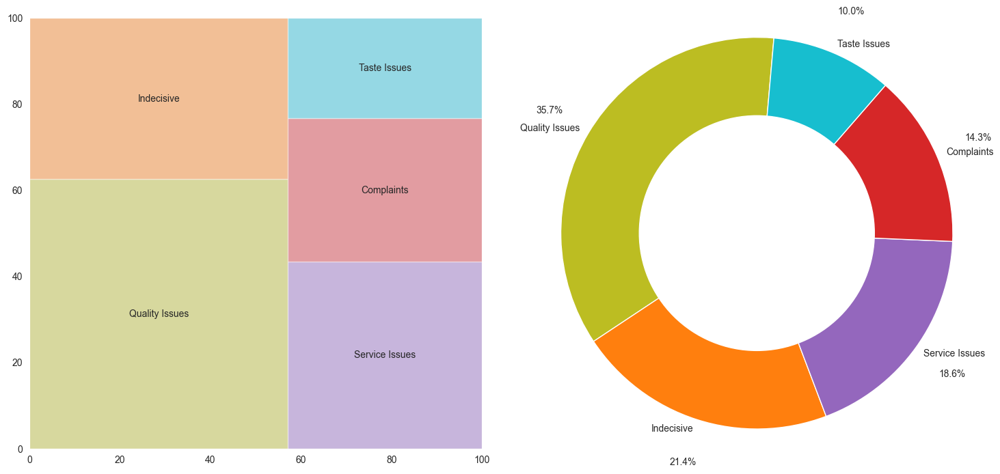

MoMo Cafe - Courtyard by Marriott - Number of reviews: 48


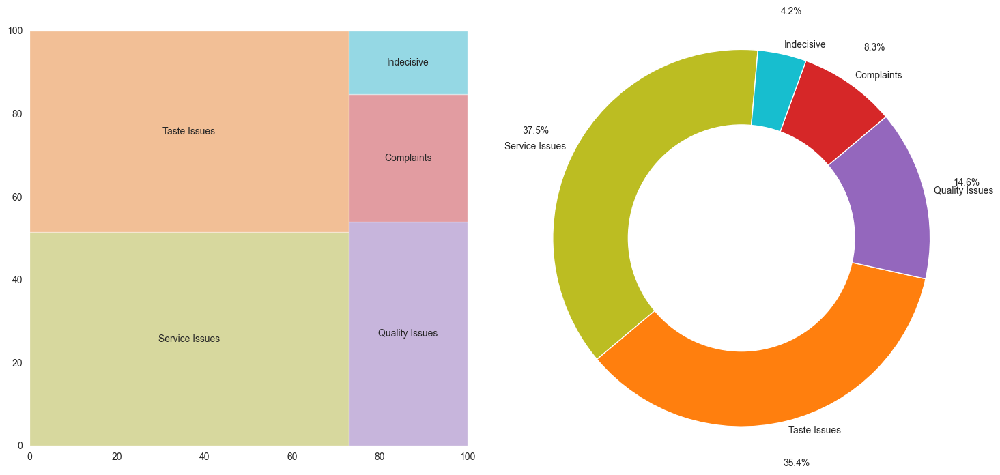

Mughal Darbar Fast Food - Number of reviews: 119


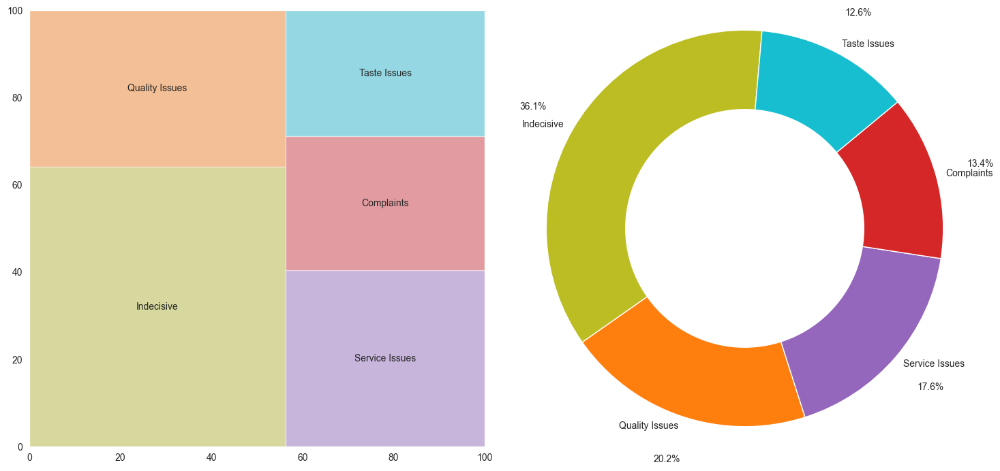

My Bar Headquarter - Number of reviews: 3


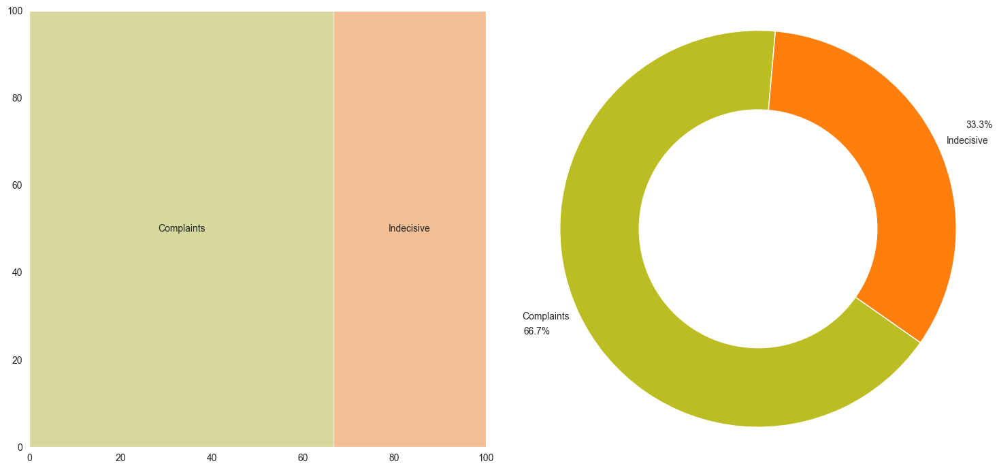

Nai Dilli - Number of reviews: 24


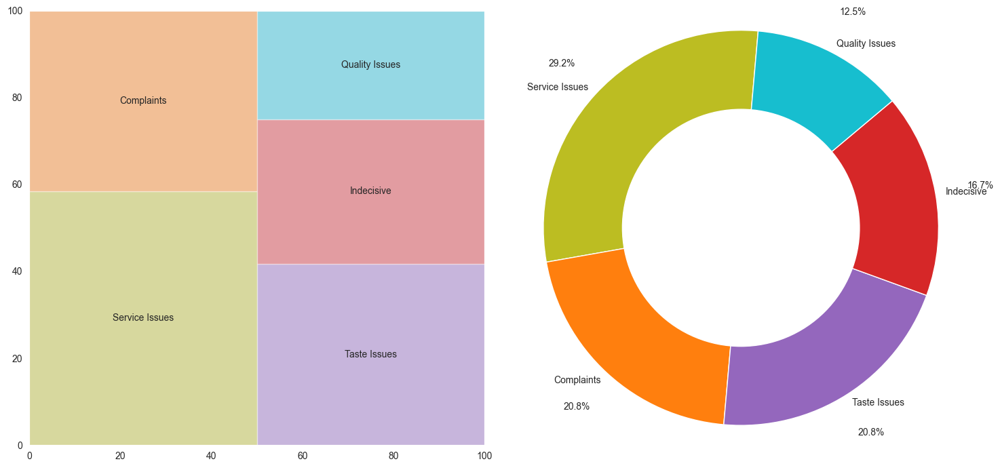

Padharo Sa - Number of reviews: 68


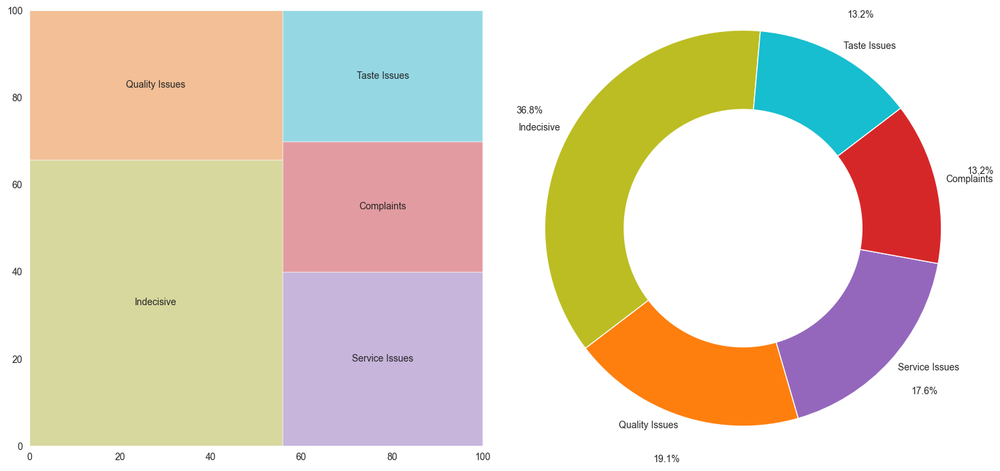

Pepperazzi - Number of reviews: 39


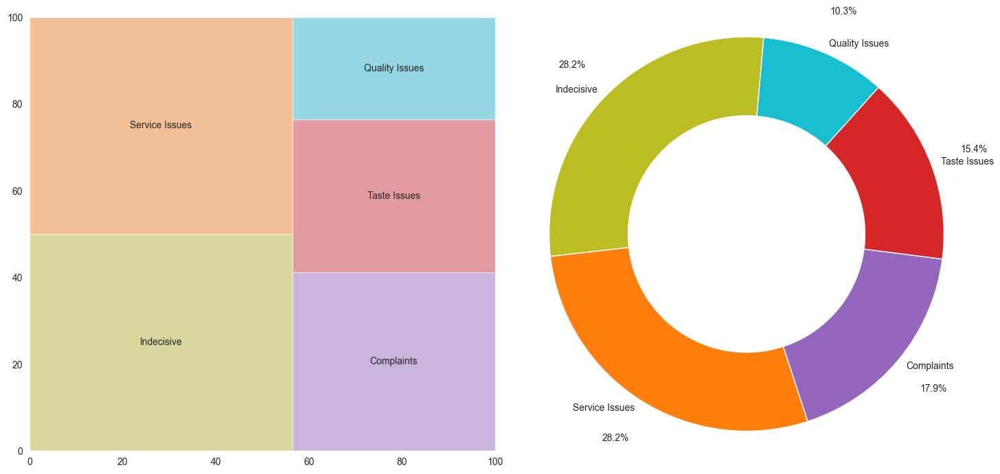

Pin And Pan - Number of reviews: 24


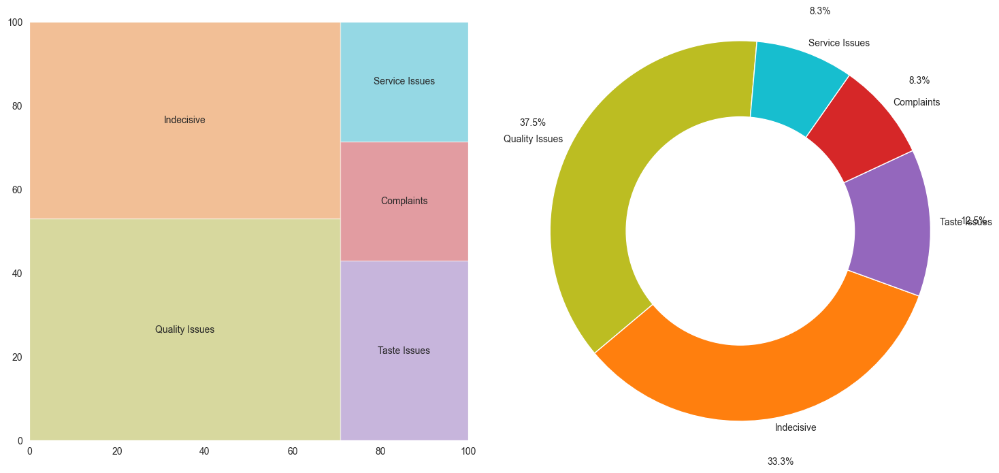

Pirates Of Grill - Number of reviews: 35


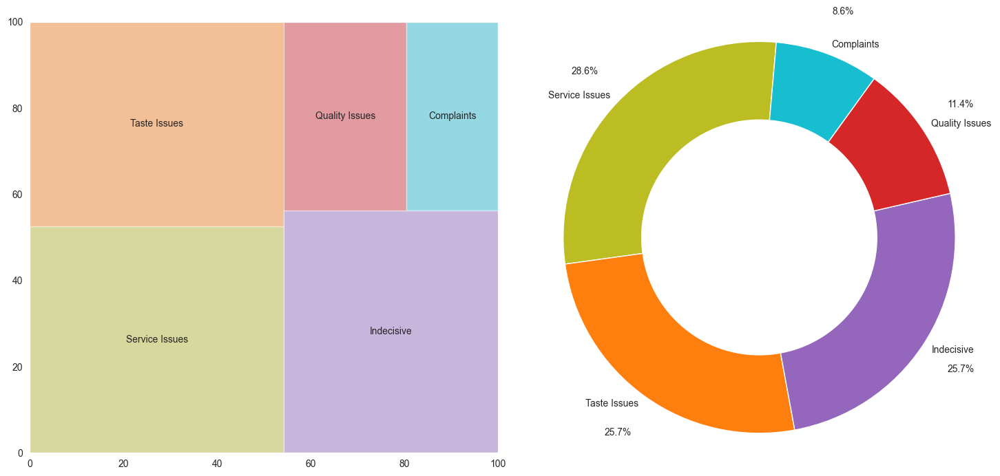

Pitchers Cafe Bar - Number of reviews: 26


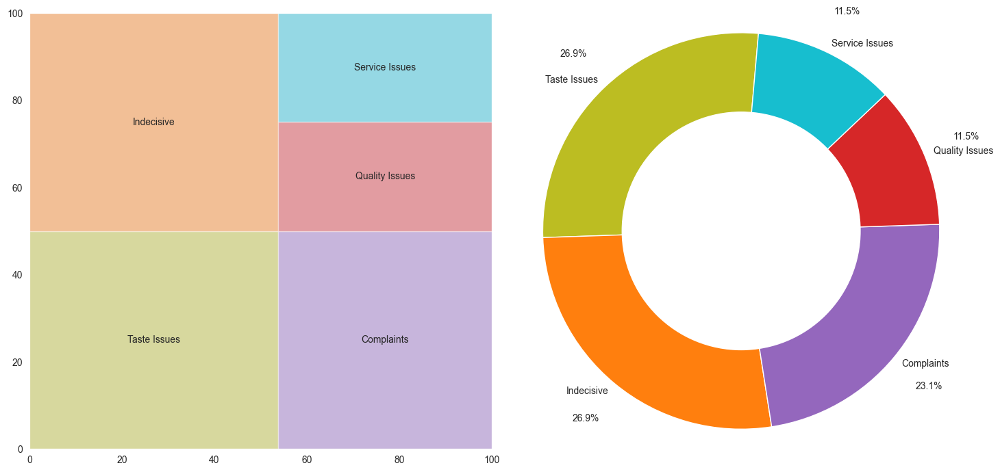

Pizza Hut - Number of reviews: 71


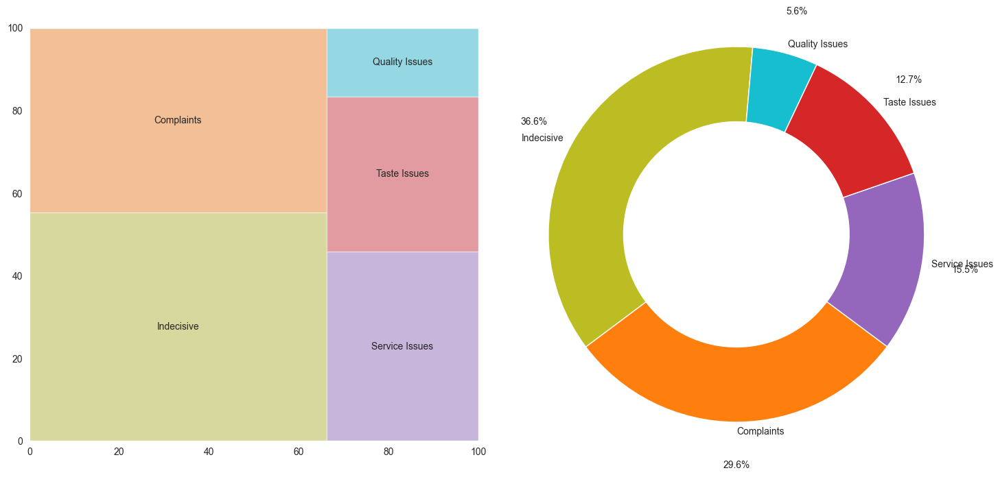

Poppin' Deli - Number of reviews: 3


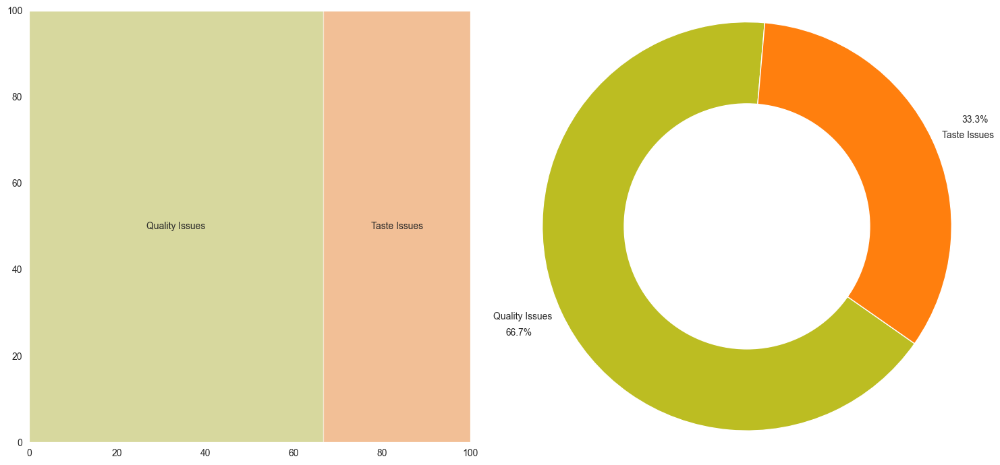

Pure - Number of reviews: 2


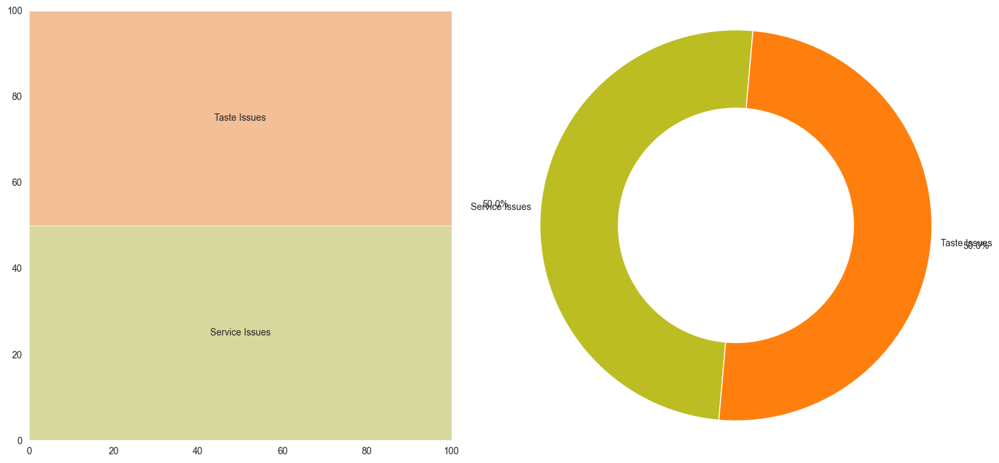

Raasta - Number of reviews: 10


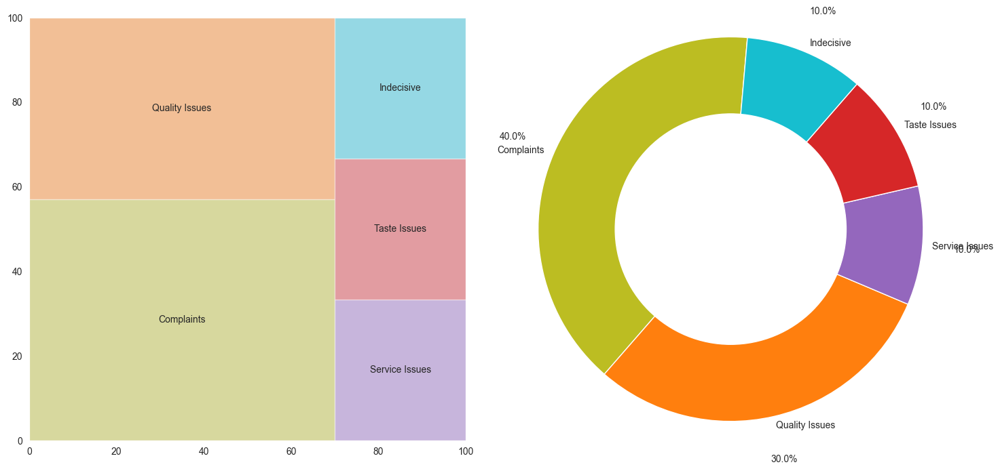

Rajhans Thali - Number of reviews: 45


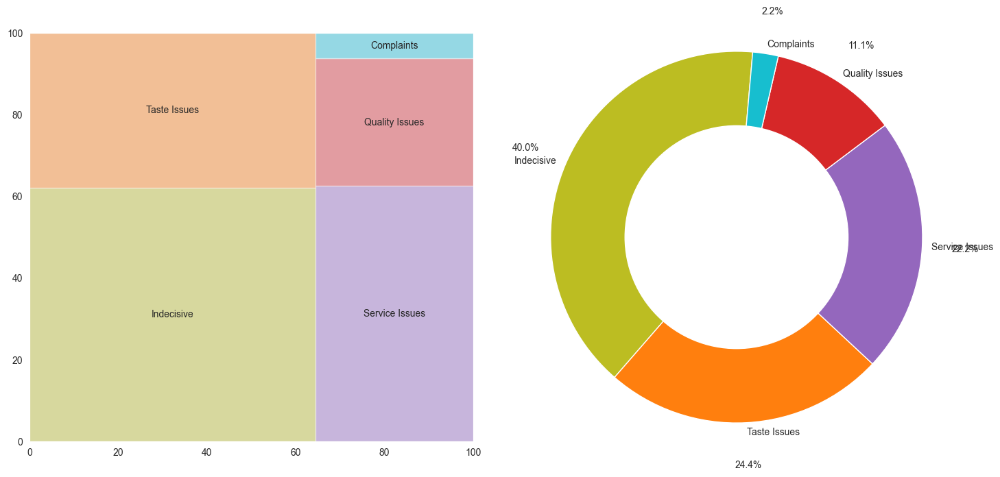

Rangla Punjab Dhaba - Number of reviews: 2


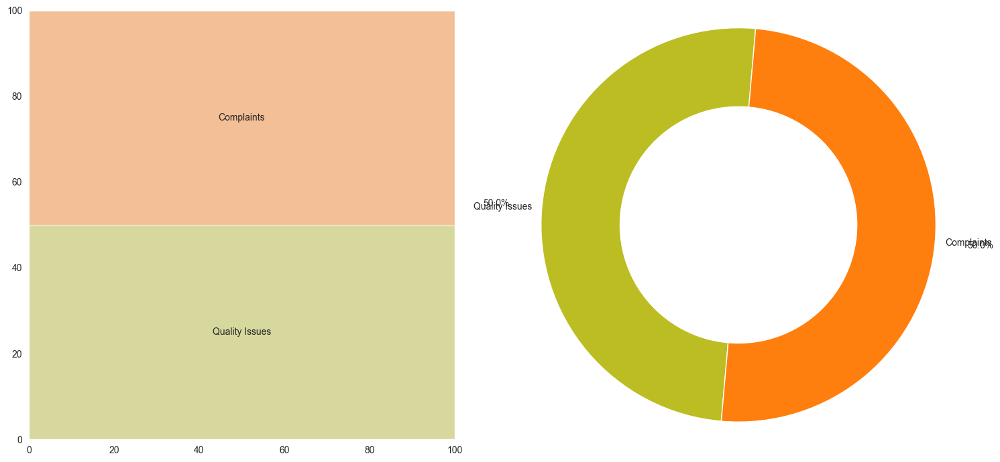

Ranjit's Lakeview - Number of reviews: 67


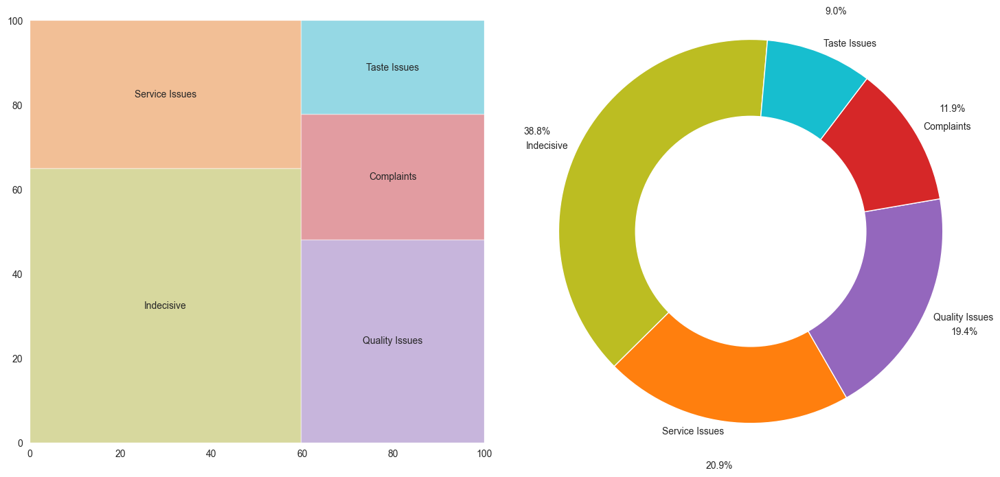

Regenta Place - Number of reviews: 3


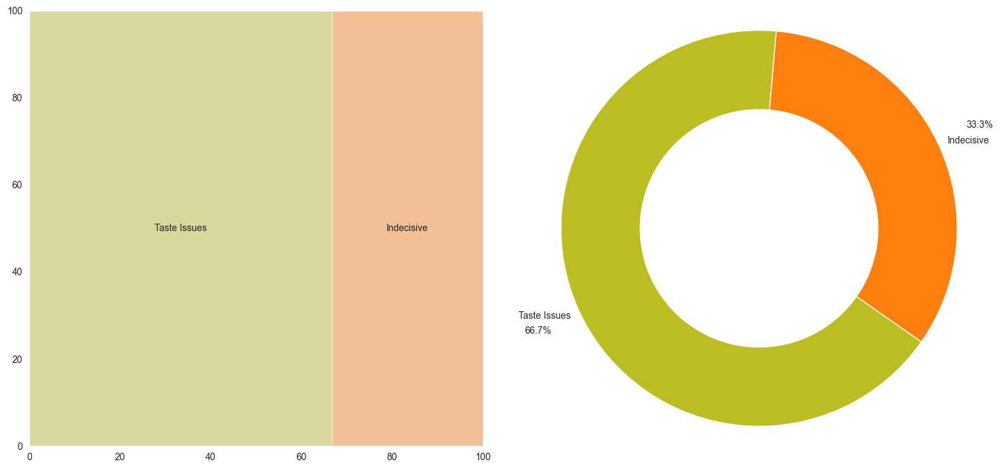

Romeo Lane - Number of reviews: 9


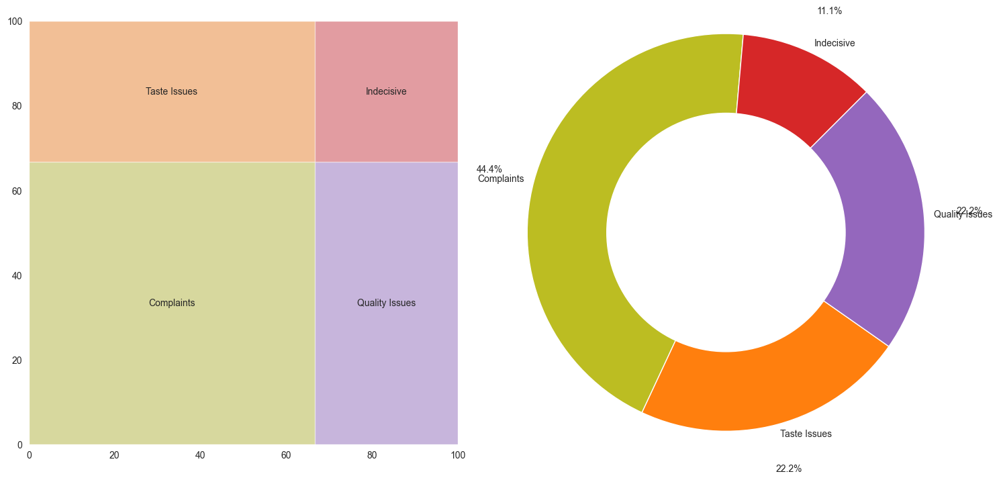

Ru-Bar-Ru - Number of reviews: 17


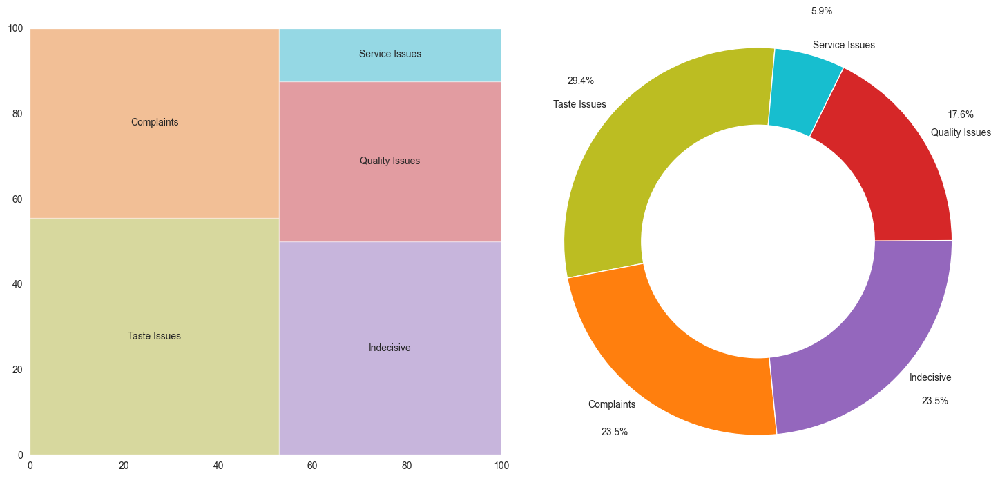

Sagar Gaire Fast Food - Number of reviews: 80


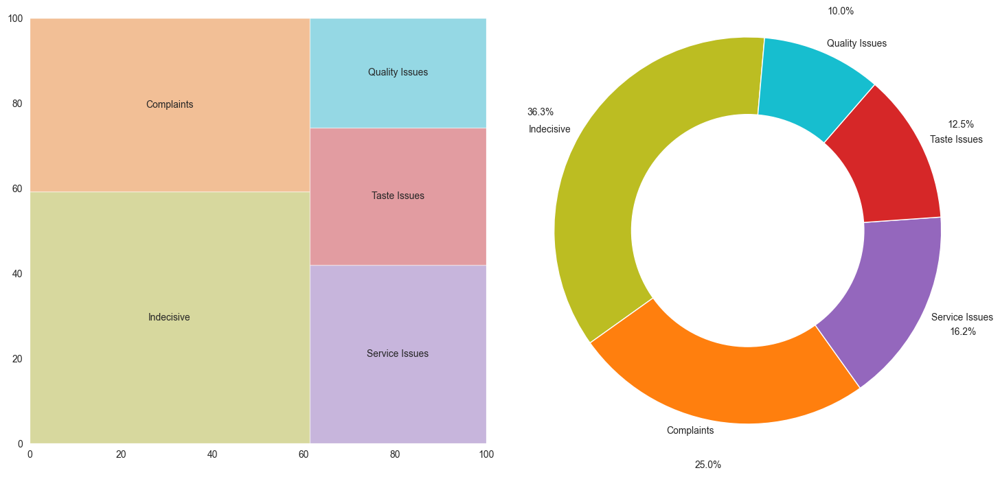

Sanchi - Sayaji Hotel - Number of reviews: 31


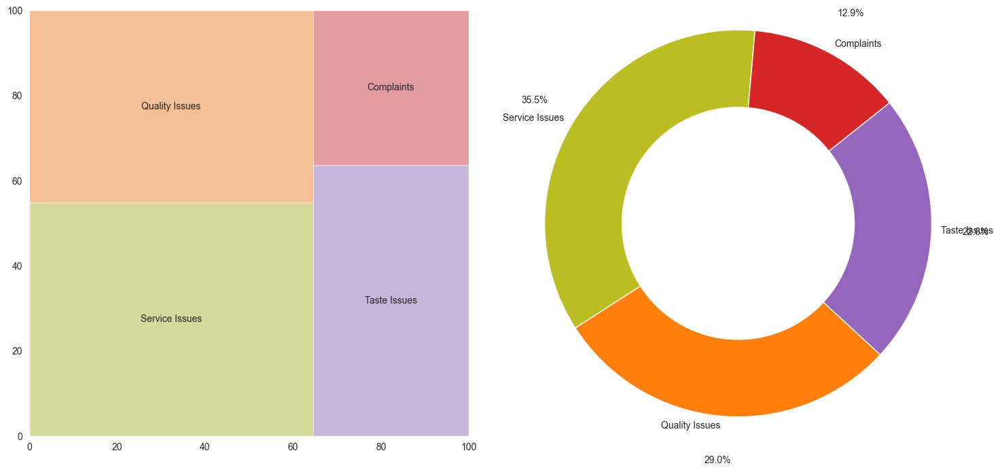

Setu - Number of reviews: 8


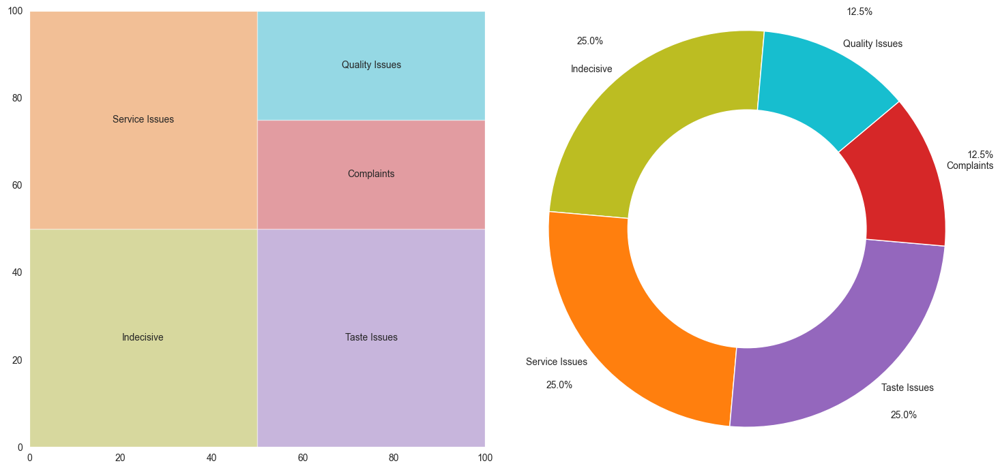

Shaan-E-Bhopal - Number of reviews: 1


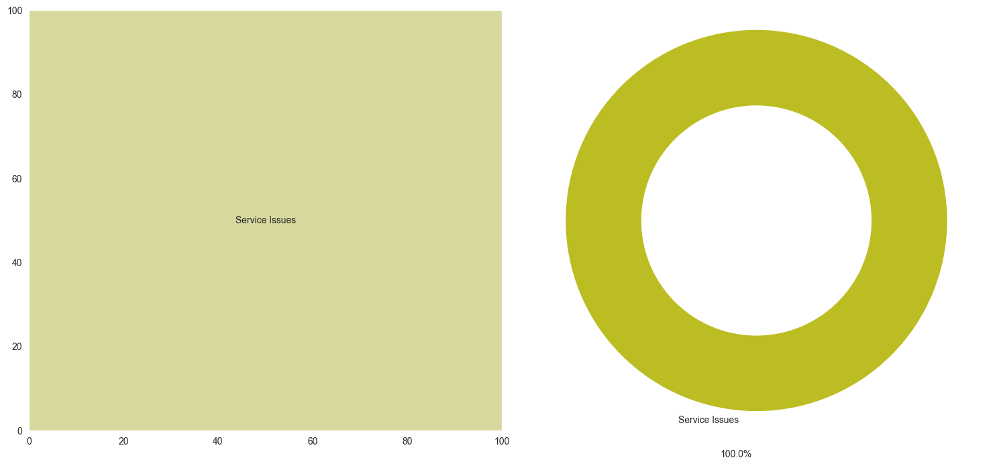

Shahnama - Jehan Numa Palace - Number of reviews: 22


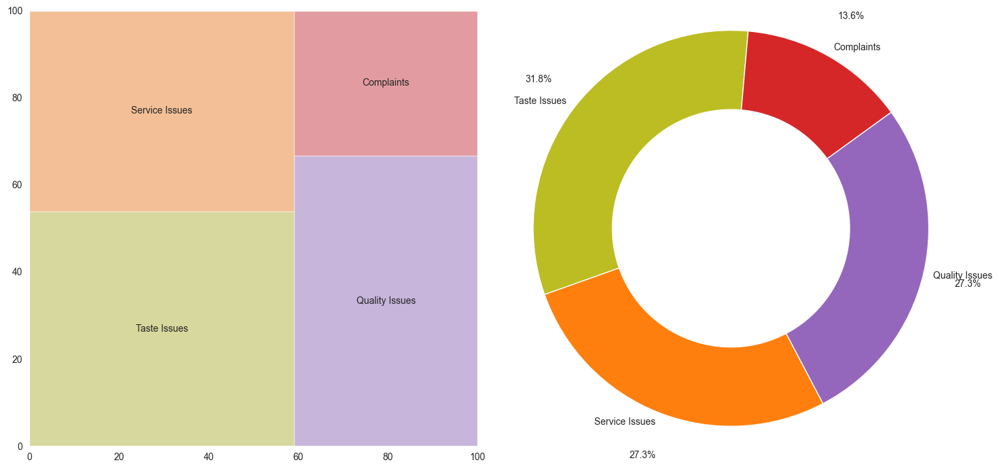

Shikha Greens - Number of reviews: 9


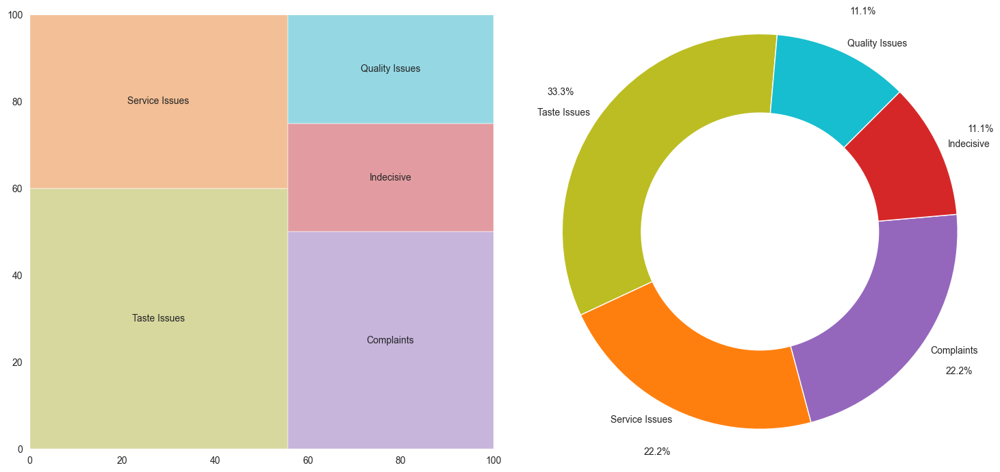

Shubh Shaleen Springs - Number of reviews: 76


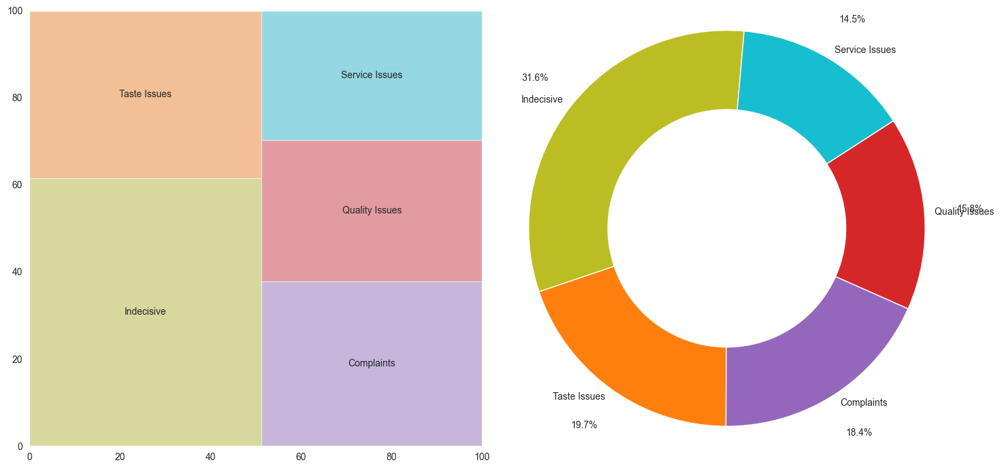

Subway - Number of reviews: 13


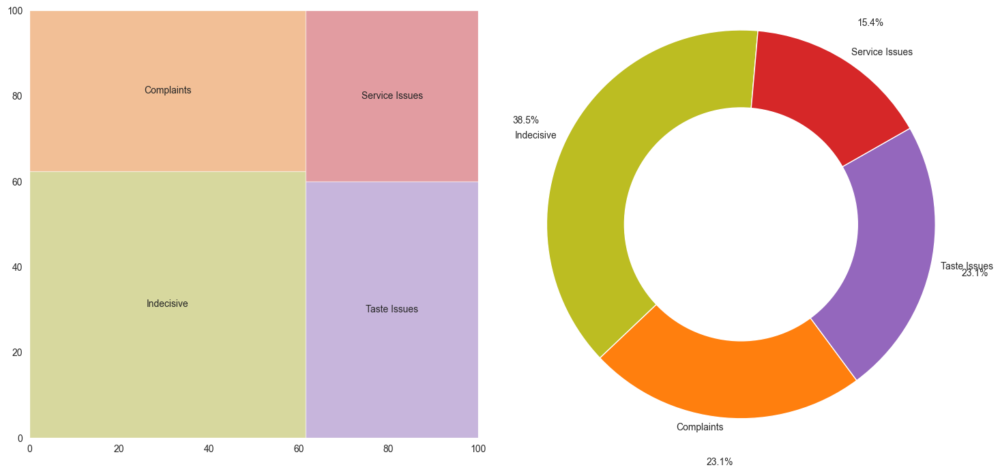

Suruchi's 24x7 - Number of reviews: 57


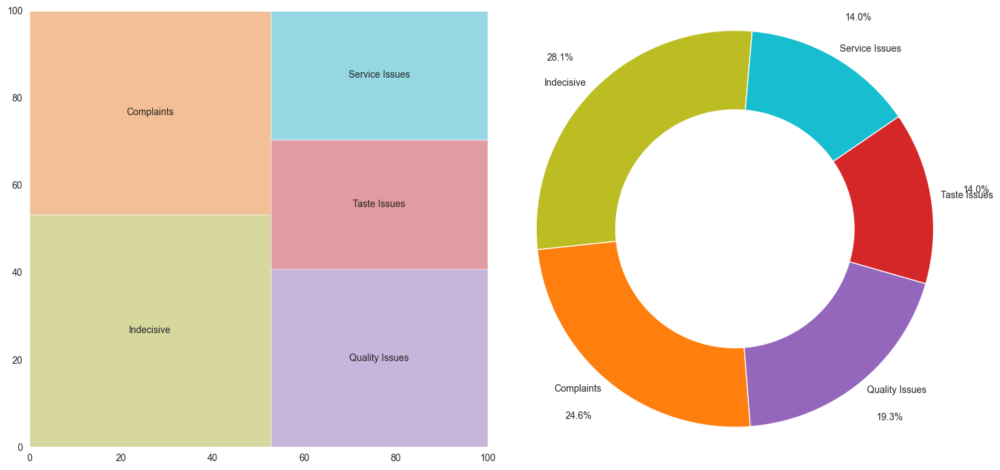

Swastik Pure Veg Restaurant - Number of reviews: 72


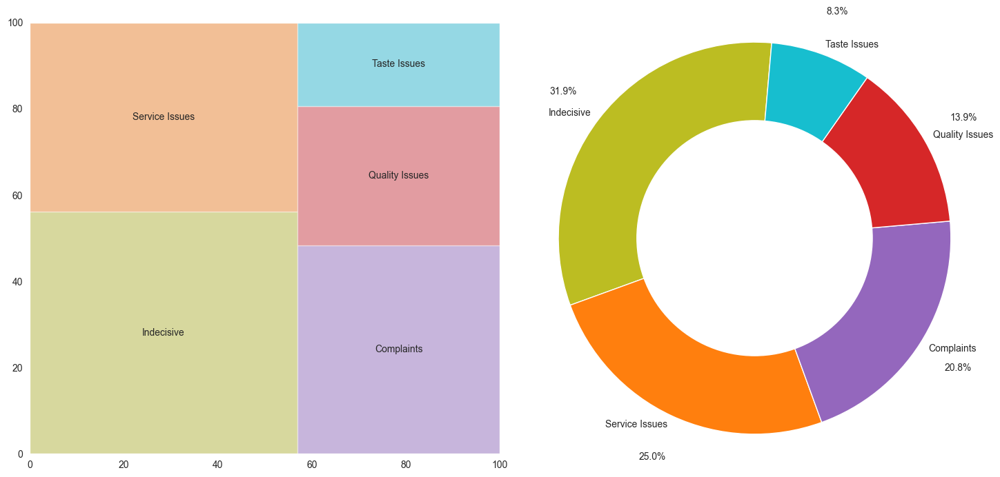

Tabbar House - Number of reviews: 37


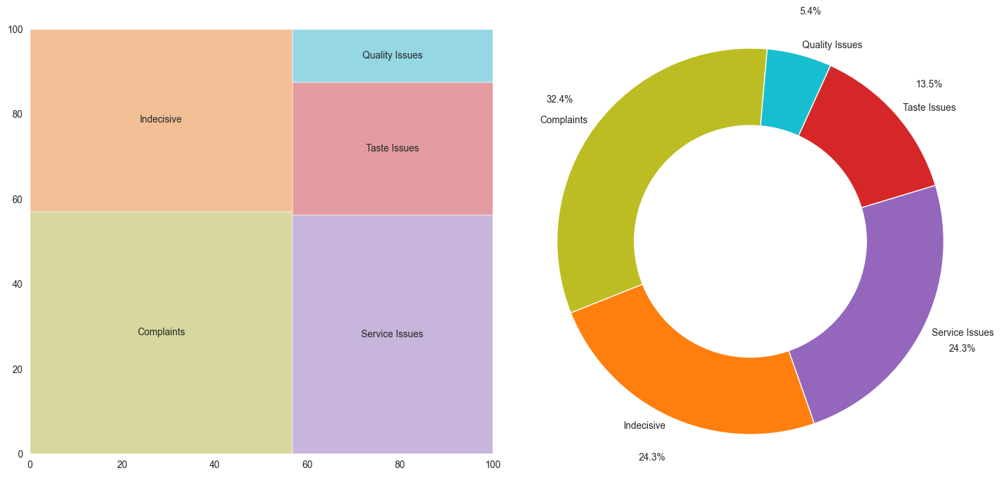

Taco Bell - Number of reviews: 47


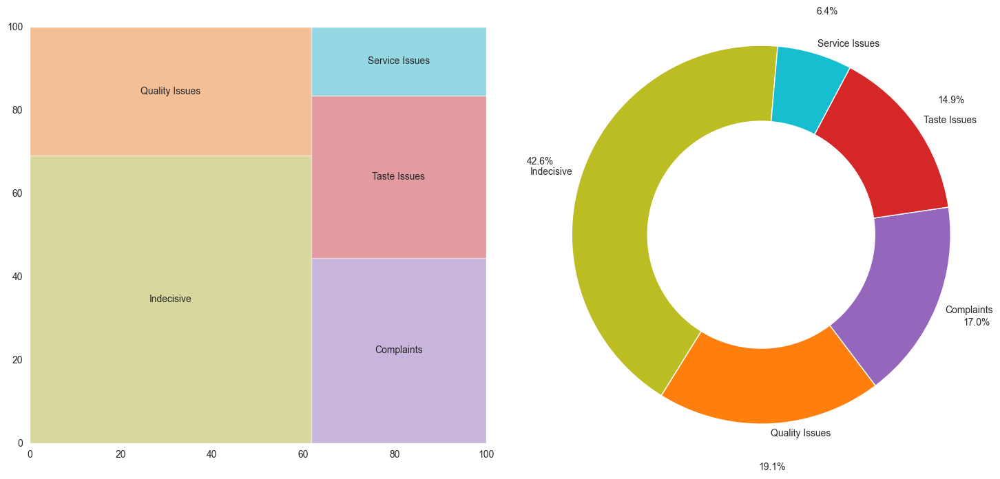

TAO - Jehan Numa Palace - Number of reviews: 26


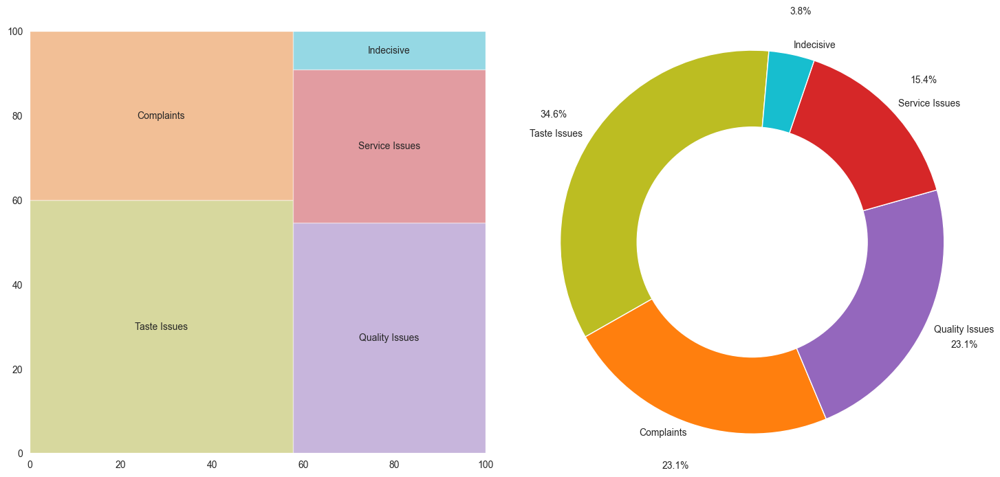

Tesoro Multicuisine Restaurant - Number of reviews: 1


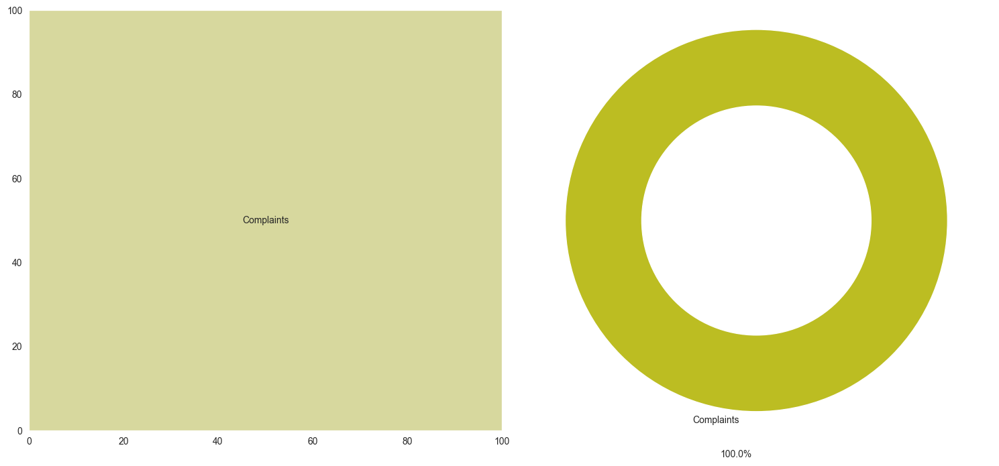

The Brunch House - Number of reviews: 19


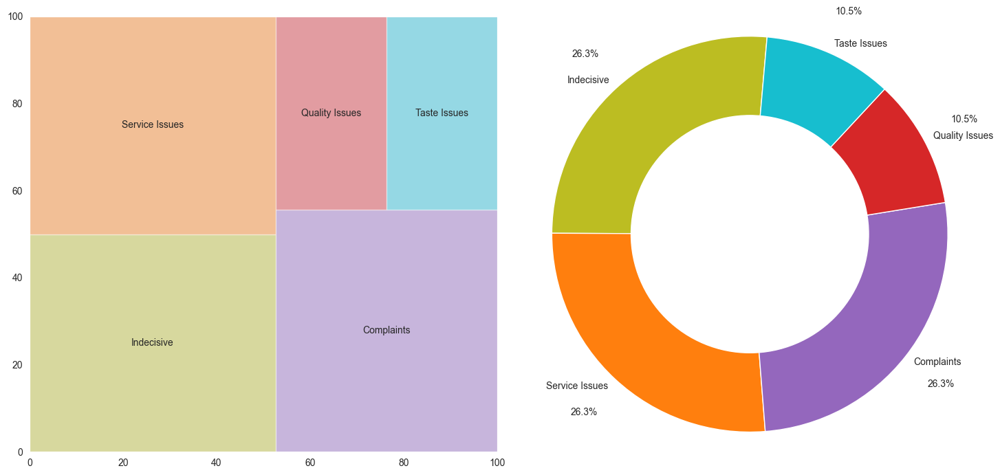

The Fern Residency - Number of reviews: 7


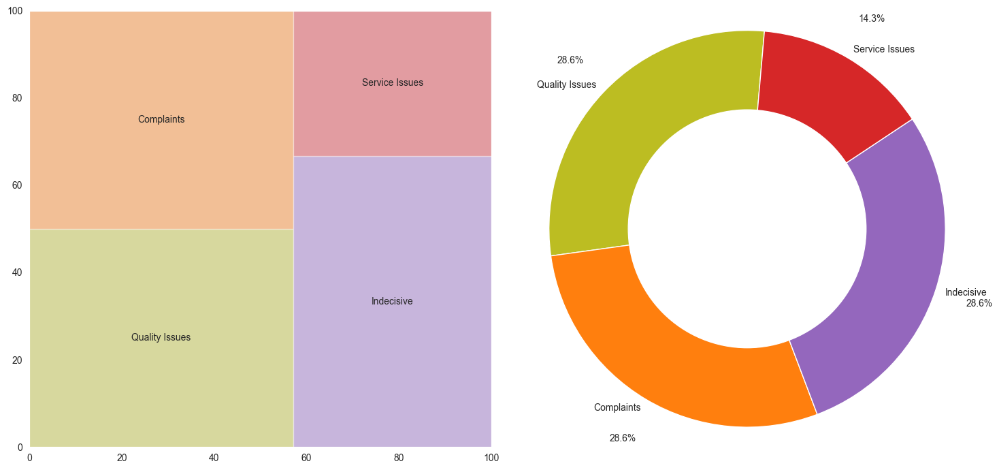

The Flying Saucer - Number of reviews: 4


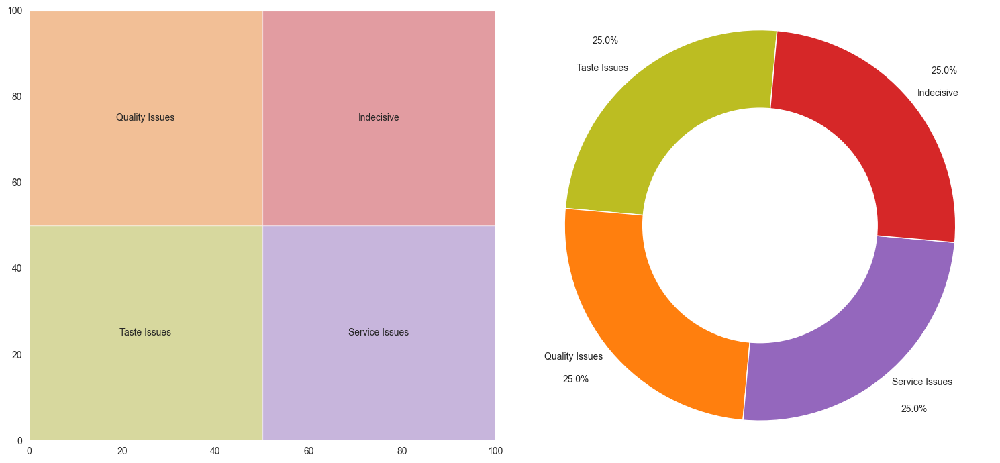

The Giant Panda - Number of reviews: 33


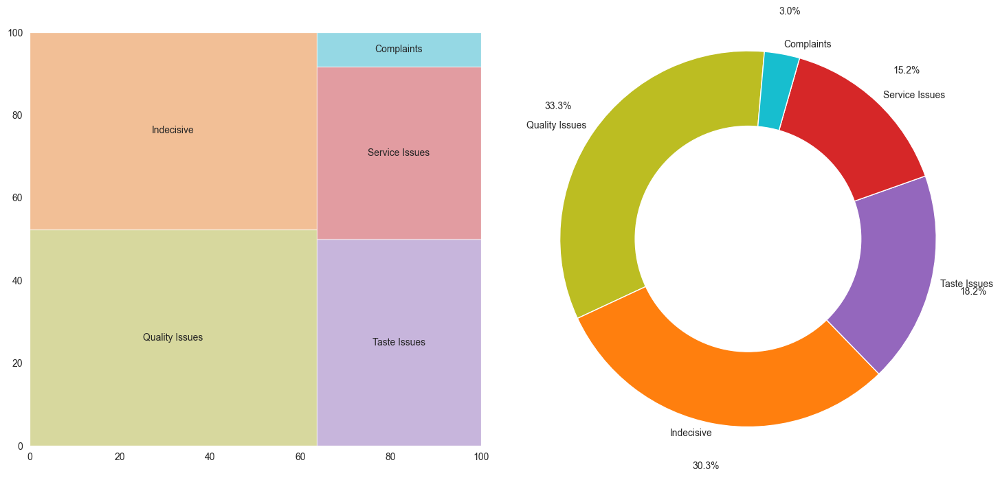

The Lunar Stay - Number of reviews: 17


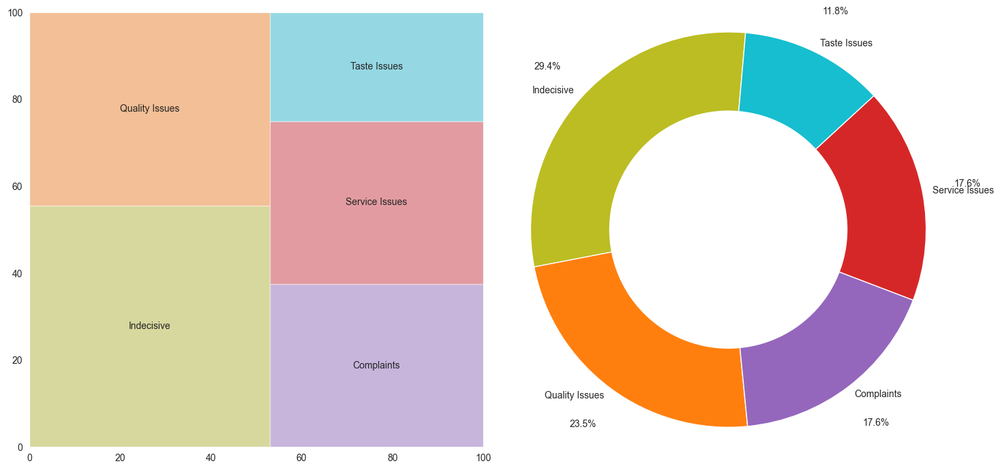

The Pizza Slice - Number of reviews: 25


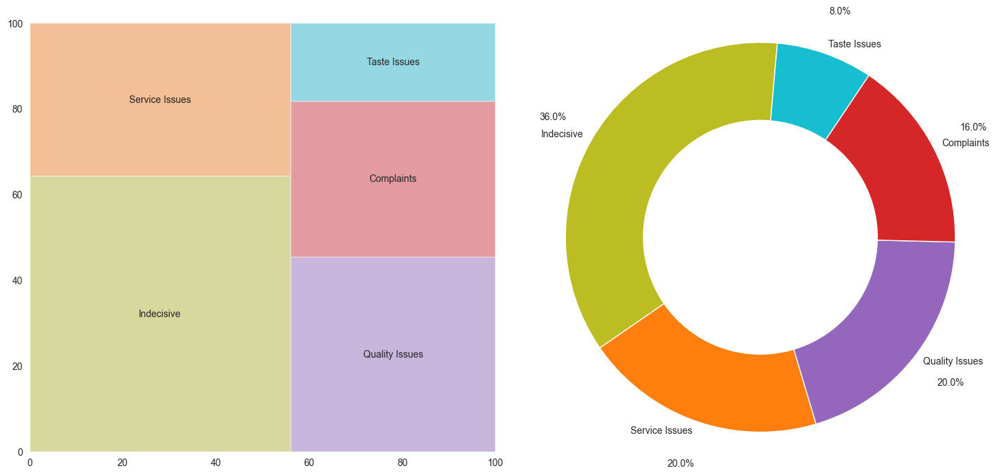

The Ten Suites - Number of reviews: 4


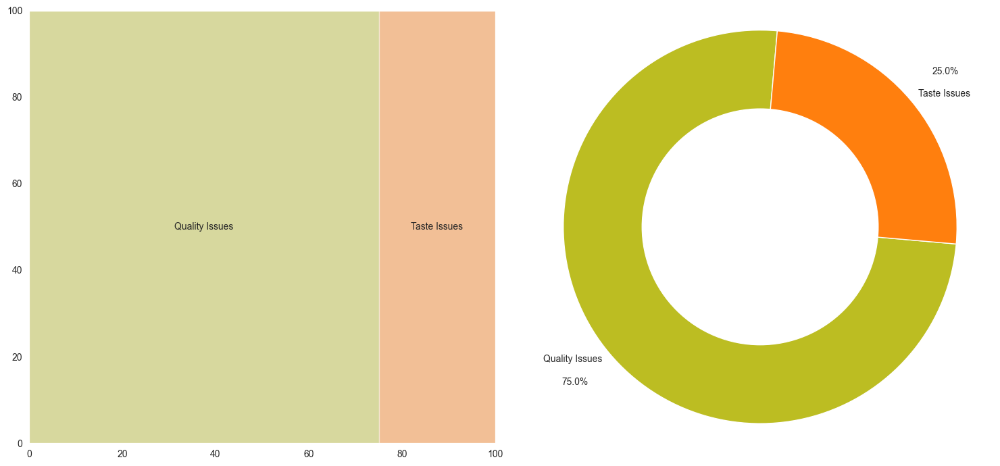

The Whispering Palms - Number of reviews: 17


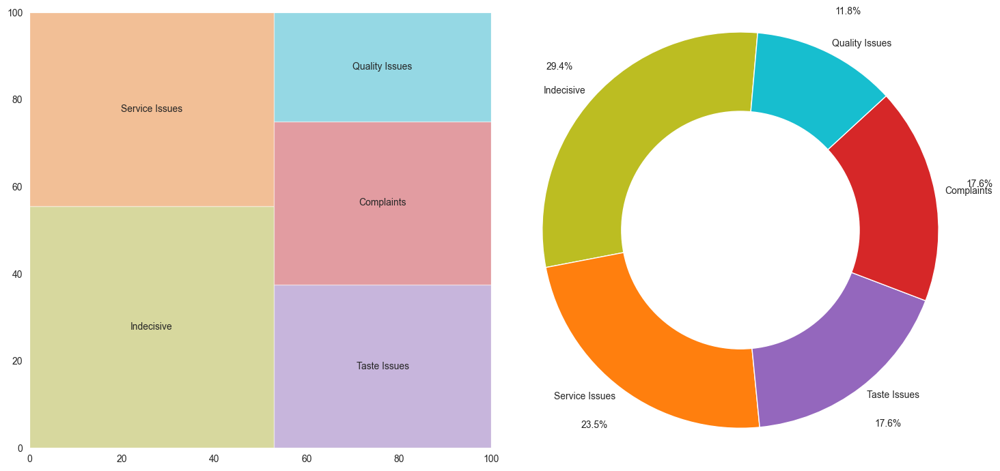

Tilakrams Sweets Bakery Restaurant - Number of reviews: 97


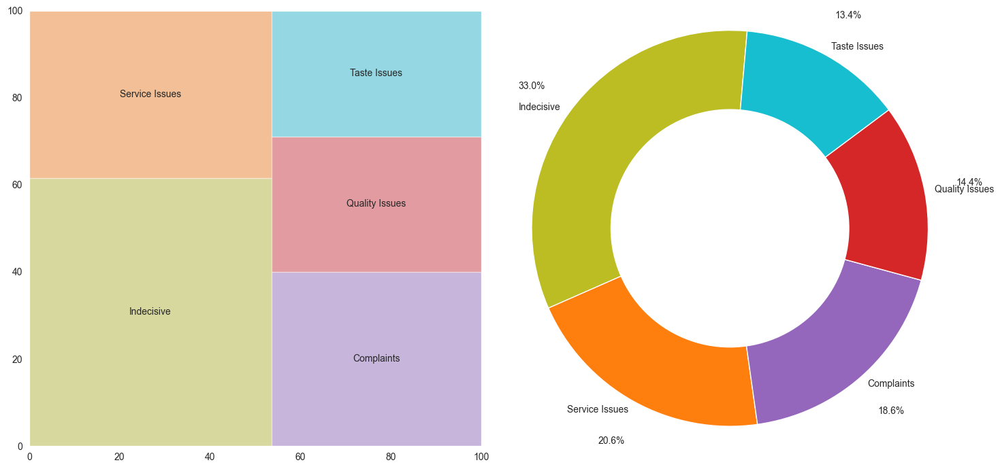

Turquoise Kitchen & Cocktail House - Number of reviews: 4


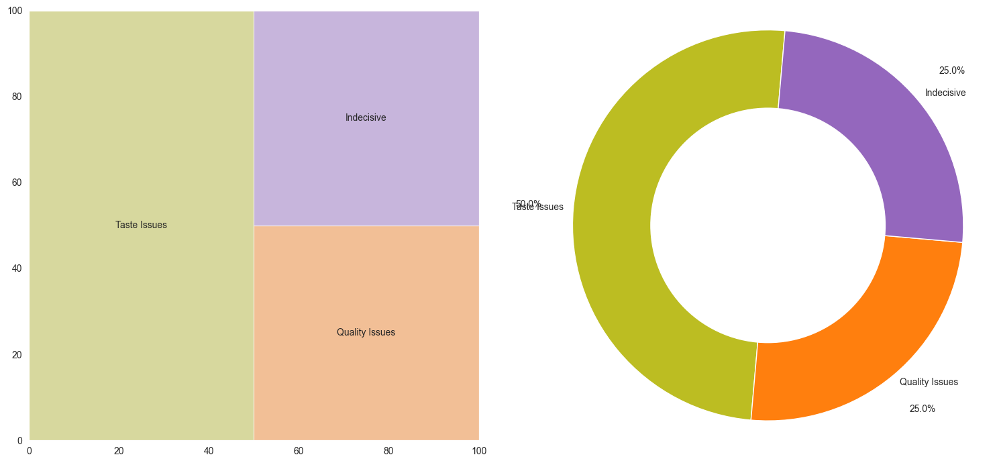

Tweetea Cafe - Number of reviews: 9


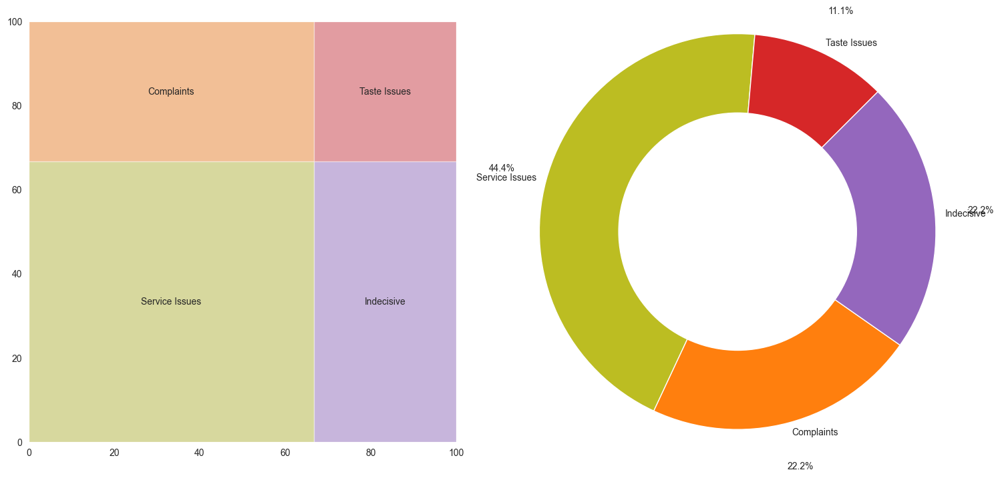

Twisst Of Tadka - Number of reviews: 52


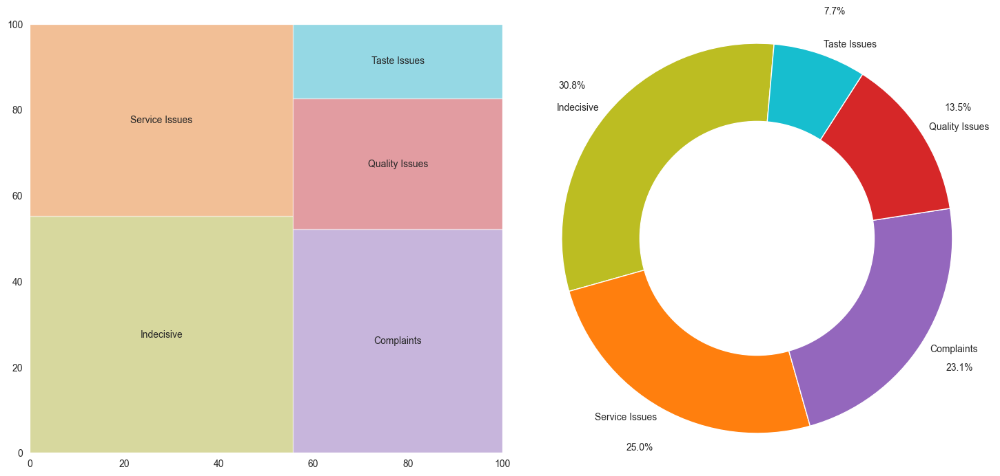

Under The Jamun Tree - Number of reviews: 8


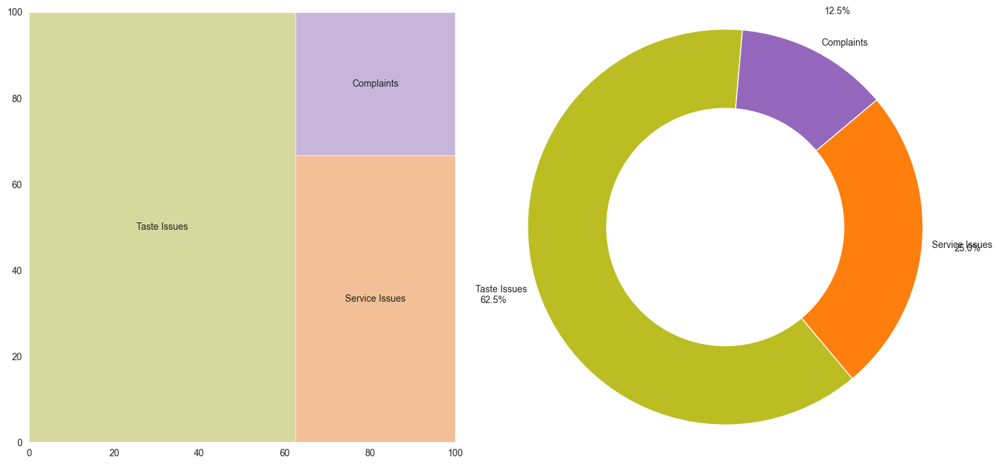

Under The Mango Tree - Jehan Numa Palace - Number of reviews: 32


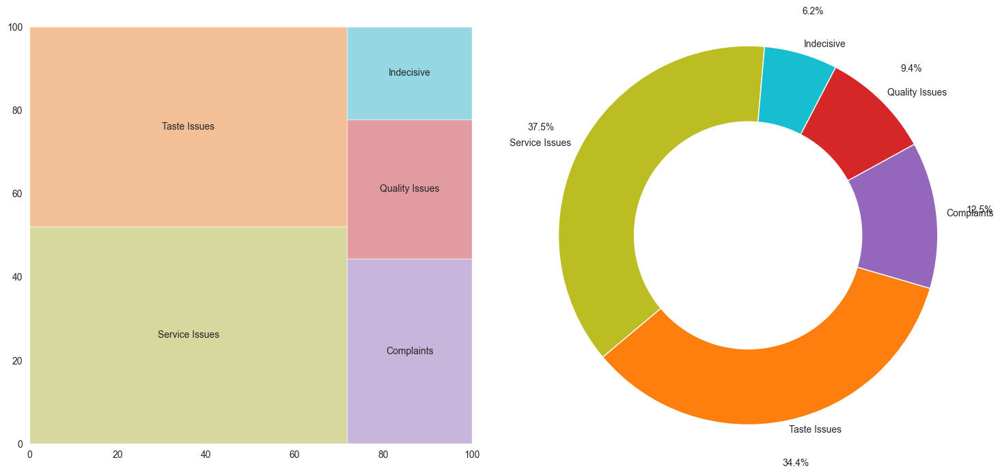

Urban Tadka - Number of reviews: 53


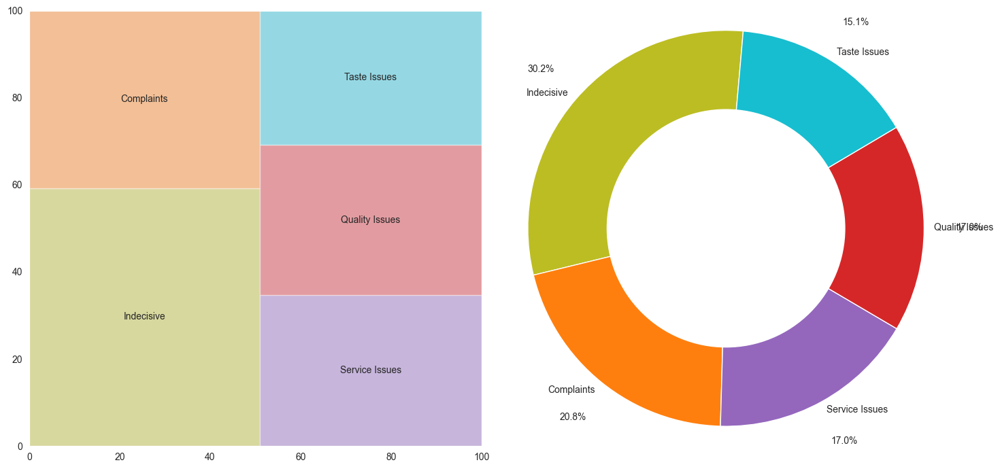

Wind And Waves - Number of reviews: 95


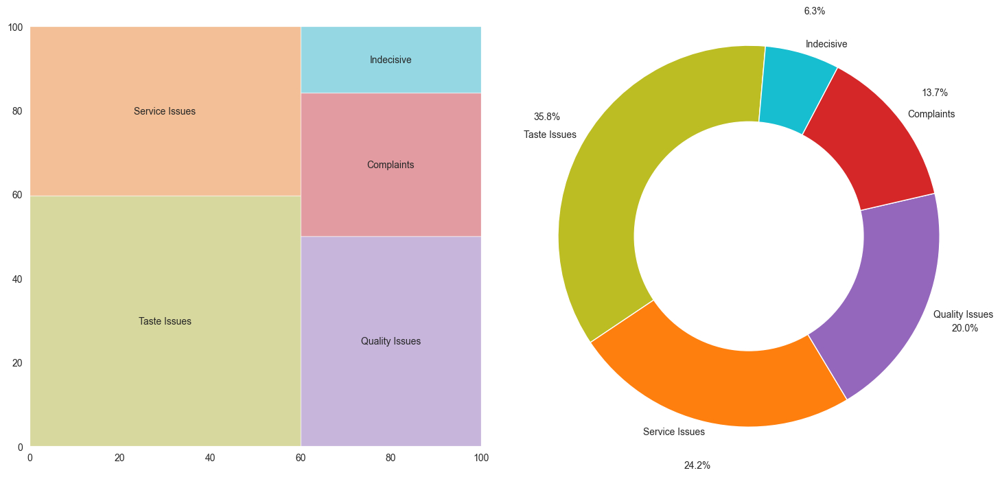

Winni Cakes & More - Number of reviews: 74


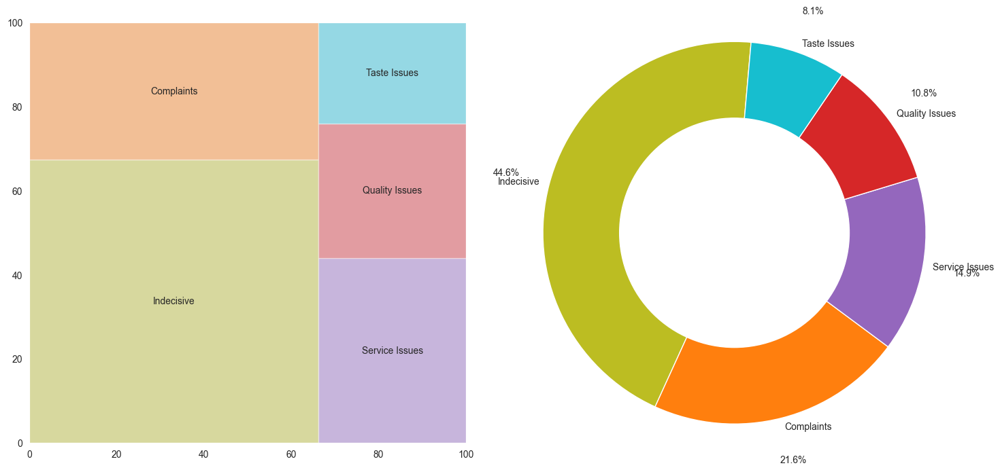

Yaar Bhopali - Number of reviews: 5


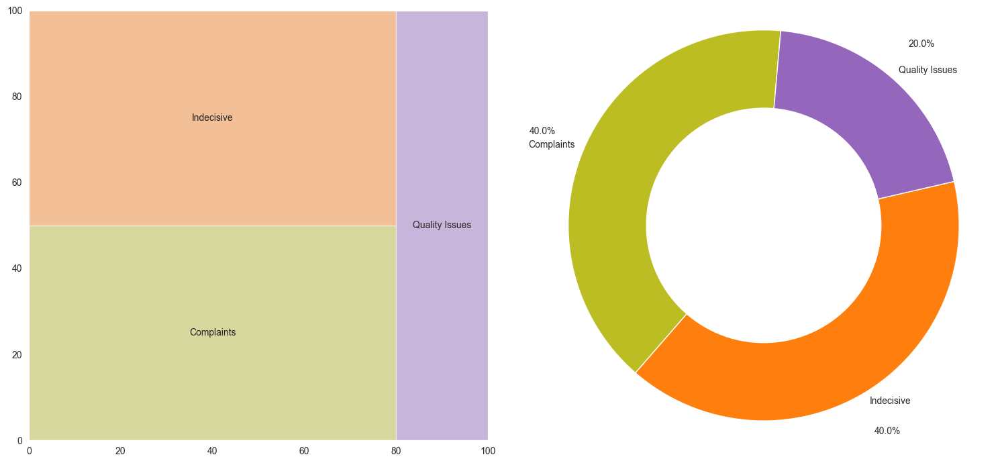

Zaaiqa - Noor Us Sabah Palace - Number of reviews: 1


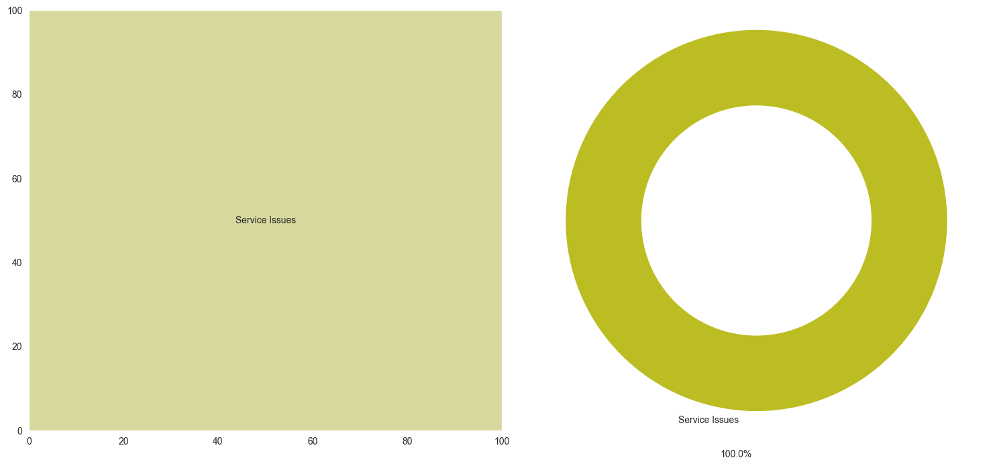

Zam Zam Fast Food - Number of reviews: 82


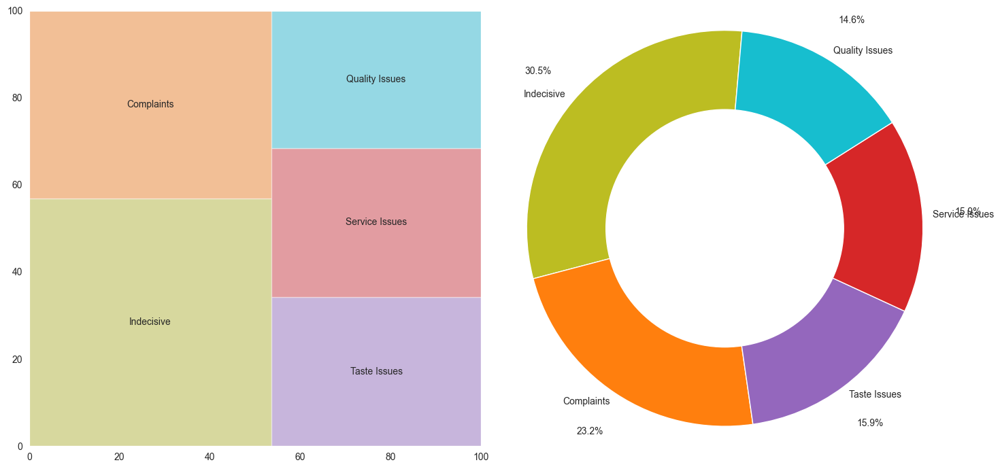

Zauq - Number of reviews: 83


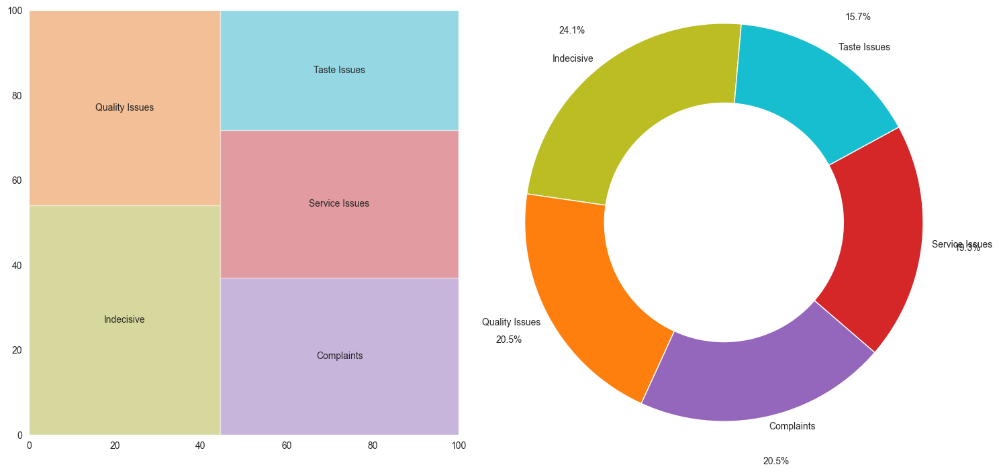

Zoku - Number of reviews: 9


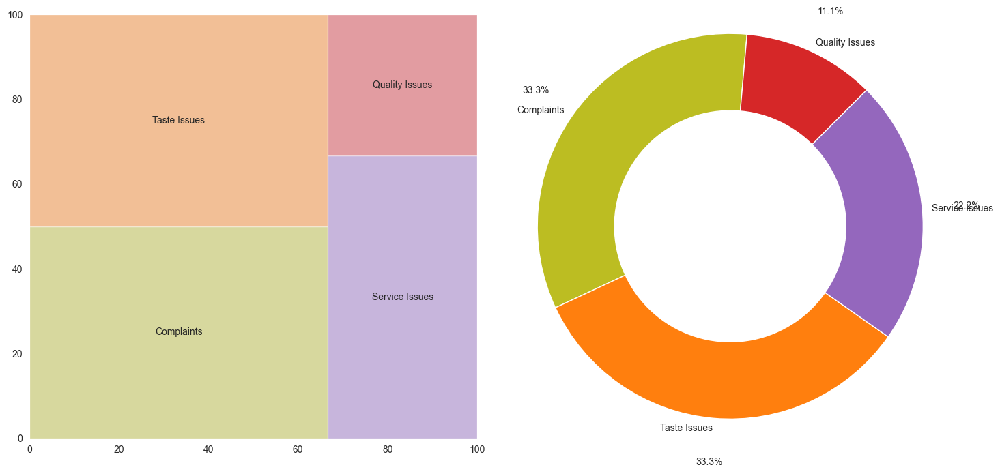

In [63]:
for company in negative_reviews_df.Restaurant_Name.unique():
    reviews_num = negative_reviews_df[negative_reviews_df['Restaurant_Name'] == company].shape[0]
    print('\x1b[1;30m' + company + '\x1b[0m' + ' - Number of reviews: '+ str(reviews_num))
    summary_per_company(input_df=negative_reviews_df, company=company, figsize=(15, 7))

In [64]:
rev = list(positive_reviews_df['ngrams'])

number_of_topics = 2

In [65]:
!pip install gensim


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [66]:
from gensim import corpora, models

In [67]:
dictionary_LDA = corpora.Dictionary(rev)
dictionary_LDA.filter_extremes(no_below=3)
corpus = [dictionary_LDA.doc2bow(list_of_tokens) for list_of_tokens in rev]

In [70]:
lda_model = models.LdaModel(corpus,
                            num_topics=number_of_topics,
                            id2word=dictionary_LDA,
                            passes=10,
                            alpha=1 * (1/number_of_topics),
                            eta=1 * (1/number_of_topics)
                           )

In [71]:
for i,topic in lda_model.show_topics(formatted=True, num_topics=number_of_topics, num_words=15):
    print(str(i)+": "+ topic)
    print()

0: 0.004*"service excellent" + 0.004*"fine dining" + 0.003*"amazing service" + 0.003*"courteous staff" + 0.003*"quality taste" + 0.003*"probably best" + 0.003*"every bite" + 0.003*"top notch" + 0.003*"every dish" + 0.003*"would definitely" + 0.003*"food festival" + 0.003*"awesome taste" + 0.003*"great ambiance" + 0.003*"staff polite" + 0.003*"friendly staff"

1: 0.004*"visit bhopal" + 0.003*"staff courteous" + 0.003*"non vegetarian" + 0.003*"taste quality" + 0.003*"would like" + 0.003*"quality good" + 0.003*"family dinner" + 0.003*"good work" + 0.003*"place good" + 0.003*"north indian" + 0.003*"good quantity" + 0.003*"chicken tikka" + 0.003*"awesome place" + 0.003*"keep good" + 0.003*"great time"



In [72]:
lda_model[corpus[6]]


[(0, 0.6381492), (1, 0.3618508)]

In [74]:
!pip install pyLDAvis

   ---------------------------------------- 0.0/2.6 MB ? eta -:--:--
    --------------------------------------- 0.1/2.6 MB 1.6 MB/s eta 0:00:02
   ---- ----------------------------------- 0.3/2.6 MB 3.5 MB/s eta 0:00:01
   ----- ---------------------------------- 0.4/2.6 MB 3.4 MB/s eta 0:00:01
   ----- ---------------------------------- 0.4/2.6 MB 3.4 MB/s eta 0:00:01
   ----- ---------------------------------- 0.4/2.6 MB 3.4 MB/s eta 0:00:01
   ----- ---------------------------------- 0.4/2.6 MB 3.4 MB/s eta 0:00:01
   ----- ---------------------------------- 0.4/2.6 MB 3.4 MB/s eta 0:00:01
   ----- ---------------------------------- 0.4/2.6 MB 3.4 MB/s eta 0:00:01
   ----- ---------------------------------- 0.4/2.6 MB 3.4 MB/s eta 0:00:01
   ----- ---------------------------------- 0.4/2.6 MB 3.4 MB/s eta 0:00:01
   ------- -------------------------------- 0.5/2.6 MB 932.7 kB/s eta 0:00:03
   ------- -------------------------------- 0.5/2.6 MB 848.9 kB/s eta 0:00:03
   -------- ---


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [75]:
%matplotlib inline

import pyLDAvis
import pyLDAvis.gensim

vis = pyLDAvis.gensim.prepare(topic_model=lda_model, corpus=corpus, dictionary=dictionary_LDA)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)